# Code for the final projects of the six courses of the [IBM ML specialization](https://www.coursera.org/professional-certificates/ibm-machine-learning)
## by <a href='https://insana.net'>Giuseppe Insana</a>
### 2021.12.04 - 2022.03.18

The six courses, with coursera links, were:
1. [Exploratory Data Analysis for Machine Learning](https://www.coursera.org/learn/ibm-exploratory-data-analysis-for-machine-learning)
2. [Supervised Machine Learning: Regression](https://www.coursera.org/learn/supervised-machine-learning-regression)
3. [Supervised Machine Learning: Classification](https://www.coursera.org/learn/supervised-machine-learning-classification)
4. [Unsupervised Machine Learning](https://www.coursera.org/learn/ibm-unsupervised-machine-learning)
5. [Deep Learning and Reinforcement Learning](https://www.coursera.org/learn/deep-learning-reinforcement-learning)
6. [Specialized Models: Time Series and Survival Analysis](https://www.coursera.org/learn/time-series-survival-analysis)

This notebook contains the code used for the final projects of each course.

See the accompanying project reports for explanations and discussions:

<a href='01.EDAcourseproject_report_Giuseppe_Insana.pdf'>01 EDA</a>

<a href='02.supMLregr_courseproject_report_GiuseppeInsana.pdf'>02 Regression</a>

<a href='03.supMLclass_courseproject_report_GiuseppeInsana.pdf'>03 Classification</a>

<a href='04.unsupervised_courseproject_report_Giuseppe_Insana.pdf'>04 Unsupervised</a>

<a href='05.DLcourseproject_report_Giuseppe_Insana.pdf'>05 Deep learning</a>

<a href='06.TimeSeries_courseproject_report_Giuseppe_Insana.pdf'>06 Time series</a>

The present notebook and the reports were first published in <a href='https://github.com/g-insana/machinelearning/'>this github page</a>.

There are options along the notebook to use reduced or full data set, what columns to use, what measure to predict, whether outliers should be imputed...

Furthermore, some sections, e.g. visualisations, can be excluded/included at will by the setting of appropriate flags.

# Contents
- [Exploratory Data Analysys](#EDA)
  - [Out Of Range values](#OOR)
  - [Data cleaning & Feature engineering](#DataCleaning)
  - [Outliers](#Outliers)
  - [SignificanceTesting](#SignificanceTesting)
- [Supervised ML: Regression](#Regression)
  - [Cross Validation](#CrossValidation)
  - [Baseline models](#BaselineModels)
  - [Transformation and Scaling](#Transformation_and_Scaling)
  - [Regularisation](#Regularisation)
  - [Elastic Net](#ElasticNet)
- [Supervised ML: Classification](#Classification)
  - [Classification Pipelines](#ClassificationPipelines)
  - [Stratified Cross Validation](#StratifiedCrossValidation)
  - [SVM](#SVM)
  - [Decision Trees](#DecisionTrees)
  - [Random Forest](#RandomForest)
- [Unsupervised ML](#UnsupervisedML)
  - [PCA](#PCA)
  - [PCA in ML pipeline](#PCA_ML)
  - [Multidimensional Scaling and recovery of topology](#MDS)
- [Deep Learning](#DeepLearning)
  - [Deep Learning Pipelines](#DLpipelines)
  - [Regularisation and dropout](#DLRegularisation)
  - [Going deeper or wider](#DeeperWider)
- [Time Series](#TimeSeries)
  - [Time series Visualisations](#TSvisualisations)
  - [Stationarity](#Stationarity)
  - [Exponential Smoothing](#ExponentialSmoothing)
  - [SARIMA and auto arima](#SARIMA)
  - [Deep Learning of Time Series](#TS_DL)
  - [RNN](#RNN)
  - [LSTM](#LSTM)
  - [Keras Tuner for hyperparameters tuning](#KerasTuner)

### Data origin acknowledgement
Dataset compiled by Huber, Florian (2021); Zenodo. https://doi.org/10.5281/zenodo.4770937

ORIGINAL DATA TAKEN FROM:
```
EUROPEAN CLIMATE ASSESSMENT & DATASET (ECA&D), file created on 22-04-2021
THESE DATA CAN BE USED FREELY PROVIDED THAT THE FOLLOWING SOURCE IS ACKNOWLEDGED:
```
Klein Tank, A.M.G. and Coauthors, 2002. Daily dataset of 20th-century surface air temperature and precipitation series for the European Climate Assessment. Int. J. of Climatol., 22, 1441-1453. Data and metadata available at http://www.ecad.eu

ORIGINAL DATA TAKEN FROM:

EUROPEAN CLIMATE ASSESSMENT & DATASET (ECA&D), file created on 22-04-2021
THESE DATA CAN BE USED FREELY PROVIDED THAT THE FOLLOWING SOURCE IS ACKNOWLEDGED:

Klein Tank, A.M.G. and Coauthors, 2002. Daily dataset of 20th-century surface
air temperature and precipitation series for the European Climate Assessment.
Int. J. of Climatol., 22, 1441-1453.
Data and metadata available at http://www.ecad.eu

## Imports

In [52]:
import sys
import math
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn as sk
from cmplot import cmplot
import plotly.graph_objects as go
#import qgrid #optional
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import pearsonr, shapiro #Pearson correlation, Shapiro-Wilk normality test
from scipy.stats.mstats import normaltest # D'Agostino K^2 Test
from scipy.stats import boxcox #The box cox transformation is a parametrized transformation that tries to get distributions "as close to a normal distribution as possible".
import tensorflow as tf
from tensorflow import keras
import visualkeras
#from tensorflow.keras.utils import plot_model
from os import path
from random import seed #python random
from tensorflow.random import set_seed #tf random
import pickle

In [53]:
%matplotlib inline
sns.set_theme(context='notebook', style='white', font_scale=1)
sns.set(rc={"figure.figsize":(9, 6)})
print('numpy', np.__version__)
print('pandas', pd.__version__)
print('seaborn', sns.__version__)
print('sklearn', sk.__version__)
print('tensorflow', tf.__version__)

numpy 1.24.2
pandas 1.5.3
seaborn 0.12.2
sklearn 1.2.2
tensorflow 2.11.0


In [54]:
def eprint(*myargs, **kwargs):
    """
    print to stderr, useful for error messages and to not clobber stdout
    """
    print(*myargs, file=sys.stderr, **kwargs)

## Data load

In [55]:
#either from url
#df = pd.read_csv("https://zenodo.org/record/5071376/files/weather_prediction_dataset.csv?download=1")
#or from previously saved file
df = pd.read_csv("weather_prediction_dataset.csv.gz")
df.shape
#10 years of data, 165 columns

(3654, 165)

# EDA
[back to ToC](#Contents)
## Exploratory Data Analysis for Machine Learning

Please refer to the <a href='01.EDAcourseproject_report_Giuseppe_Insana.pdf'>project report</a>

## Objective:
Brief description of the data set and a summary of its attributes

Initial plan for data exploration

Actions taken for data cleaning and feature engineering

Key Findings and Insights, which synthesizes the results of Exploratory Data Analysis in an insightful and actionable manner

Formulating at least 3 hypothesis about this data

Conducting a formal significance test for one of the hypotheses and discuss the results

Suggestions for next steps in analyzing this data

A paragraph that summarizes the quality of this data set and a request for additional data if needed

## Initial data exploration

In [56]:
df.drop([3653], inplace=True) #let's drop the 1st of January 2010 (the only date for 2010)

In [57]:
df.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_min,STOCKHOLM_temp_max,TOURS_wind_speed,TOURS_humidity,TOURS_pressure,TOURS_global_radiation,TOURS_precipitation,TOURS_temp_mean,TOURS_temp_min,TOURS_temp_max
0,20000101,1,8,0.89,1.0286,0.20,0.03,0.0,2.9,1.6,...,-9.3,0.7,1.6,0.97,1.0275,0.25,0.04,8.5,7.2,9.8
1,20000102,1,8,0.87,1.0318,0.25,0.00,0.0,3.6,2.7,...,0.5,2.0,2.0,0.99,1.0293,0.17,0.16,7.9,6.6,9.2
2,20000103,1,5,0.81,1.0314,0.50,0.00,3.7,2.2,0.1,...,-1.0,2.8,3.4,0.91,1.0267,0.27,0.00,8.1,6.6,9.6
3,20000104,1,7,0.79,1.0262,0.63,0.35,6.9,3.9,0.5,...,2.5,4.6,4.9,0.95,1.0222,0.11,0.44,8.6,6.4,10.8
4,20000105,1,5,0.90,1.0246,0.51,0.07,3.7,6.0,3.8,...,-1.8,2.9,3.6,0.95,1.0209,0.39,0.04,8.0,6.4,9.5


In [58]:
print(df.dtypes)

DATE                        int64
MONTH                       int64
BASEL_cloud_cover           int64
BASEL_humidity            float64
BASEL_pressure            float64
                           ...   
TOURS_global_radiation    float64
TOURS_precipitation       float64
TOURS_temp_mean           float64
TOURS_temp_min            float64
TOURS_temp_max            float64
Length: 165, dtype: object


In [59]:
#add YEAR column
df['YEAR']=[int(str(x)[0:4]) for x in df.DATE]
df['DAY']=[int(str(x)[6:8]) for x in df.DATE]

In [60]:
df.describe()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,TOURS_wind_speed,TOURS_humidity,TOURS_pressure,TOURS_global_radiation,TOURS_precipitation,TOURS_temp_mean,TOURS_temp_min,TOURS_temp_max,YEAR,DAY
count,3.653000e+03,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,...,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000
mean,2.004566e+07,6.522310,5.417739,0.745056,1.017882,1.330723,0.234760,4.662469,11.025021,6.991103,...,3.677334,0.781851,1.016643,1.370131,0.186151,12.209006,7.862880,16.555817,2004.499589,15.731454
std,2.873269e+04,3.449345,2.325423,0.107759,0.007956,0.935247,0.536314,4.330018,7.414550,6.653203,...,1.520067,0.115581,0.018886,0.926365,0.422198,6.465138,5.691272,7.712116,2.873056,8.802064
min,2.000010e+07,1.000000,0.000000,0.380000,0.985600,0.050000,0.000000,0.000000,-9.300000,-16.000000,...,0.700000,0.330000,0.000300,0.050000,0.000000,-6.200000,-13.000000,-3.100000,2000.000000,1.000000
25%,2.002070e+07,4.000000,4.000000,0.670000,1.013300,0.530000,0.000000,0.500000,5.300000,2.000000,...,2.600000,0.700000,1.012100,0.550000,0.000000,7.600000,3.700000,10.800000,2002.000000,8.000000
50%,2.004123e+07,7.000000,6.000000,0.760000,1.017700,1.110000,0.000000,3.600000,11.400000,7.300000,...,3.400000,0.800000,1.017300,1.240000,0.000000,12.300000,8.300000,16.600000,2004.000000,16.000000
75%,2.007070e+07,10.000000,7.000000,0.830000,1.022700,2.060000,0.210000,8.000000,16.900000,12.400000,...,4.600000,0.870000,1.022200,2.090000,0.160000,17.200000,12.300000,22.400000,2007.000000,23.000000
max,2.009123e+07,12.000000,8.000000,0.980000,1.040800,3.550000,7.570000,15.300000,29.000000,20.800000,...,10.800000,1.000000,1.041400,3.560000,6.200000,31.200000,22.600000,39.800000,2009.000000,31.000000


In [61]:
cities = {x.split("_")[0] for x in df.columns if x not in ["MONTH", "DATE", "DAY", "YEAR"]}
cities.remove("DE")
cities.add("DE_BILT")
import re
measures = set()
for col in df.columns:
    measure = re.findall('[^A-Z]{2,}', col)
    if measure:
        measure = measure[0][1:]
        measures.add(measure)
    
print("Dataset contains {} different measured variables: {}".format(len(measures), ', '.join(measures)))
print("for {} different cities: {}".format(len(cities), ', '.join(cities)))

print("in addition to DATE and MONTH columns")

Dataset contains 11 different measured variables: precipitation, cloud_cover, wind_speed, wind_gust, temp_max, temp_min, pressure, temp_mean, sunshine, humidity, global_radiation
for 18 different cities: KASSEL, DUSSELDORF, MAASTRICHT, MONTELIMAR, ROMA, HEATHROW, DRESDEN, MALMO, SONNBLICK, BUDAPEST, LJUBLJANA, STOCKHOLM, PERPIGNAN, BASEL, MUENCHEN, TOURS, OSLO, DE_BILT
in addition to DATE and MONTH columns


but data is inconsistent. for some locations we have 9 variables (e.g. BASEL), some 8 (BUDAPEST), some 11 (DUSSELDORF), for one (MALMO) only 5


In [62]:
#some helpful dicts
measure_columns = {}
cities2measures = {}
measures2cities = {}
for col in df.columns:
    if col in ["MONTH", "DATE", "YEAR", "DAY"]:
        continue
    city = col.split("_")[0]
    if city == 'DE':
        city = 'DE_BILT'
        measure = "_".join(col.split("_")[2:])
    else:
        measure = "_".join(col.split("_")[1:])       
    if city not in cities2measures:
        cities2measures[city]=set()
    cities2measures[city].add(measure)
    if measure not in measures2cities:
        measures2cities[measure]=set()
    measures2cities[measure].add(city)
    if measure not in measure_columns:
        measure_columns[measure]=list()
    measure_columns[measure].append(col)

for city in cities2measures:
    print("{}: {} measures".format(city, len(cities2measures[city])))
for city in cities2measures:
    print("{}: {} measures".format(city, len(cities2measures[city])))

BASEL: 9 measures
BUDAPEST: 8 measures
DE_BILT: 11 measures
DRESDEN: 10 measures
DUSSELDORF: 11 measures
HEATHROW: 9 measures
KASSEL: 10 measures
LJUBLJANA: 10 measures
MAASTRICHT: 11 measures
MALMO: 5 measures
MONTELIMAR: 8 measures
MUENCHEN: 11 measures
OSLO: 11 measures
PERPIGNAN: 8 measures
ROMA: 8 measures
SONNBLICK: 8 measures
STOCKHOLM: 7 measures
TOURS: 8 measures
BASEL: 9 measures
BUDAPEST: 8 measures
DE_BILT: 11 measures
DRESDEN: 10 measures
DUSSELDORF: 11 measures
HEATHROW: 9 measures
KASSEL: 10 measures
LJUBLJANA: 10 measures
MAASTRICHT: 11 measures
MALMO: 5 measures
MONTELIMAR: 8 measures
MUENCHEN: 11 measures
OSLO: 11 measures
PERPIGNAN: 8 measures
ROMA: 8 measures
SONNBLICK: 8 measures
STOCKHOLM: 7 measures
TOURS: 8 measures


In [63]:
#let's make a table to show this clearly
print('CITIES'.ljust(10)+'\t'+'\t'.join(sorted(measures)))    
for city in sorted(cities):
    print(city.ljust(10)+'\t', end='')
    for measure in sorted(measures):
        if measure in cities2measures[city]:
            print('*\t', end='')
        else:
            print(' \t', end='')
    print('')

CITIES    	cloud_cover	global_radiation	humidity	precipitation	pressure	sunshine	temp_max	temp_mean	temp_min	wind_gust	wind_speed
BASEL     	*	*	*	*	*	*	*	*	*	 	 	
BUDAPEST  	*	*	*	*	*	*	*	*	 	 	 	
DE_BILT   	*	*	*	*	*	*	*	*	*	*	*	
DRESDEN   	*	*	*	*	 	*	*	*	*	*	*	
DUSSELDORF	*	*	*	*	*	*	*	*	*	*	*	
HEATHROW  	*	*	*	*	*	*	*	*	*	 	 	
KASSEL    	 	*	*	*	*	*	*	*	*	*	*	
LJUBLJANA 	*	*	*	*	*	*	*	*	*	 	*	
MAASTRICHT	*	*	*	*	*	*	*	*	*	*	*	
MALMO     	 	 	 	*	 	 	*	*	*	 	*	
MONTELIMAR	 	*	*	*	*	 	*	*	*	 	*	
MUENCHEN  	*	*	*	*	*	*	*	*	*	*	*	
OSLO      	*	*	*	*	*	*	*	*	*	*	*	
PERPIGNAN 	 	*	*	*	*	 	*	*	*	 	*	
ROMA      	*	*	*	 	*	*	*	*	*	 	 	
SONNBLICK 	*	*	*	*	 	*	*	*	*	 	 	
STOCKHOLM 	*	 	 	*	*	*	*	*	*	 	 	
TOURS     	 	*	*	*	*	 	*	*	*	 	*	


### Checking for null values

In [64]:
#ARE THERE NULL VALUES?
df.isna().any().any()

False

In [65]:
#we can look at data for one city at a time:
citydata={}
for city in cities:
    citydata[city]=df[['DATE','MONTH','YEAR'] + [city+'_'+x for x in cities2measures[city]]]

In [66]:
#citydata['ROMA'].describe()

### Amount of data per variable

In [67]:
bymeasure={}
for measure in measures:
    bymeasure[measure]=pd.DataFrame(df[['DATE']+[x for x in df.columns if x.find("_"+measure) != -1]].set_index('DATE').stack())
    bymeasure[measure].columns=[measure]

In [68]:
#cumulative analysis of amount of data for all the measures across all cities
for measure in sorted(measures):
    print('{}: {}'.format(measure, len(bymeasure[measure])))

cloud_cover: 47489
global_radiation: 58448
humidity: 58448
precipitation: 62101
pressure: 54795
sunshine: 51142
temp_max: 65754
temp_mean: 65754
temp_min: 62101
wind_gust: 25571
wind_speed: 43836


### Ranges for the variables

In [69]:
#data ranges, mean and std for each measure across all cities
for measure in list(sorted(measures)):
    display(bymeasure[measure].describe().loc[['min','max','mean','std']])
    #print(data[[x for x in data.columns if x.find("_"+measure) != -1]].stack().describe()[['min','max','mean','std']])

,cloud_cover
min,-99.000000
max,9.000000
mean,5.134094
std,2.425169


,global_radiation
min,0.010000
max,4.420000
mean,1.365922
std,0.952579


,humidity
min,0.100000
max,1.000000
mean,0.749430
std,0.139223


,precipitation
min,0.000000
max,16.040000
mean,0.230572
std,0.576888


,pressure
min,-0.099000
max,1.051200
mean,1.015804
std,0.013065


,sunshine
min,-1.700000
max,24.000000
mean,5.012107
std,4.427524


,temp_max
min,-24.700000
max,41.100000
mean,14.506085
std,9.576142


,temp_mean
min,-26.600000
max,33.100000
mean,10.390387
std,8.406680


,temp_min
min,-30.300000
max,26.300000
mean,6.331621
std,7.578375


,wind_gust
min,1.500000
max,41.000000
mean,10.061057
std,3.884123


,wind_speed
min,0.000000
max,16.300000
mean,3.333450
std,1.886494


### Distribution of variables across all locations

<Axes: title={'center': 'Pressure distribution'}, xlabel='pressure', ylabel='Density'>

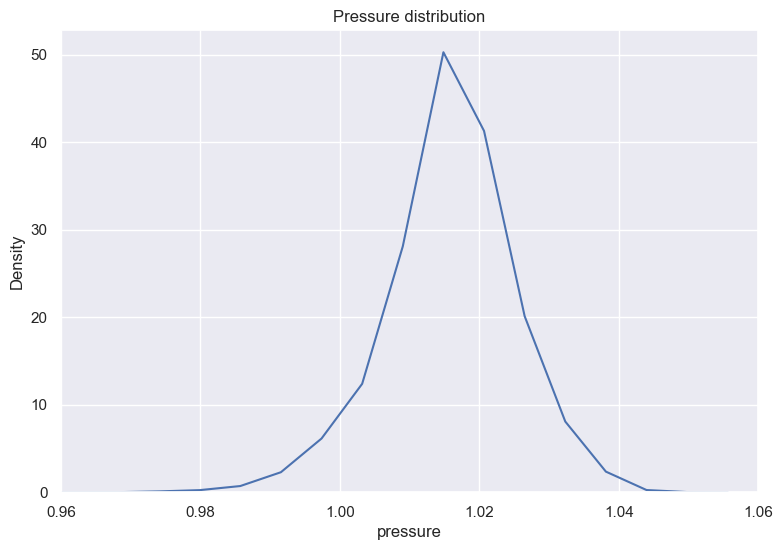

In [70]:
measure='pressure'
ax = sns.kdeplot(x=bymeasure[measure][measure])
ax.set_xlim(xmin=0.96, xmax=1.06)
ax.set(title='Pressure distribution')
ax

[Text(0.5, 1.0, 'Humidity distribution')]

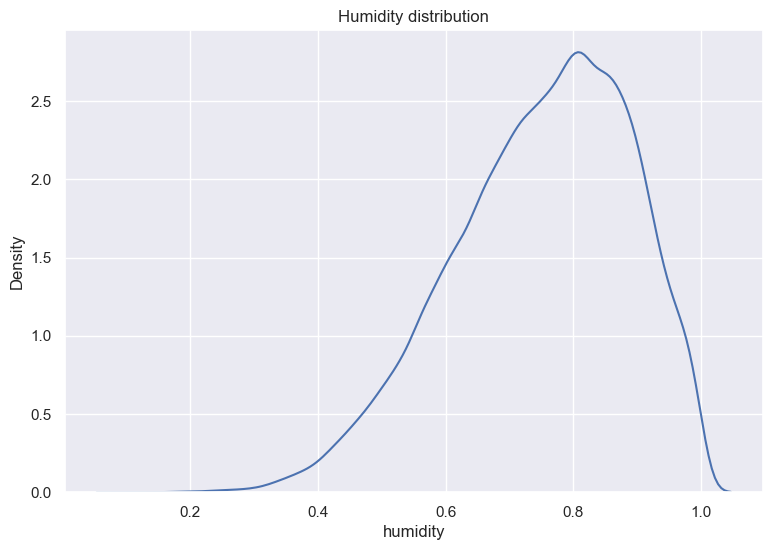

In [71]:
measure='humidity'
ax = sns.kdeplot(x=bymeasure[measure][measure])
ax.set(title='Humidity distribution')

In [72]:
measure='precipitation'
fig=go.Figure()
fig.add_trace(go.Violin(x=bymeasure[measure][measure].values, points='outliers', side='positive', spanmode='hard',
                        meanline_visible=True, box_visible=True, name=measure))
#fig.show()
measure='sunshine'
fig=go.Figure()
fig.add_trace(go.Violin(x=bymeasure[measure][measure].values, points='outliers', side='positive', spanmode='hard',
                        meanline_visible=True, box_visible=True, name=measure))
#fig.show()

measure='temp_mean'
fig=go.Figure()
fig.add_trace(go.Violin(x=bymeasure[measure][measure].values, points='outliers', side='positive', spanmode='hard',
                        meanline_visible=True, box_visible=True, name=measure))
fig.add_annotation(x=-26.6, y=0, text="20050228 Sonnblick -26.6")
#fig.show()
print("Uncomment fig.show() lines above to show interactive plots, like static figures below")

Uncomment fig.show() lines above to show interactive plots, like static figures below


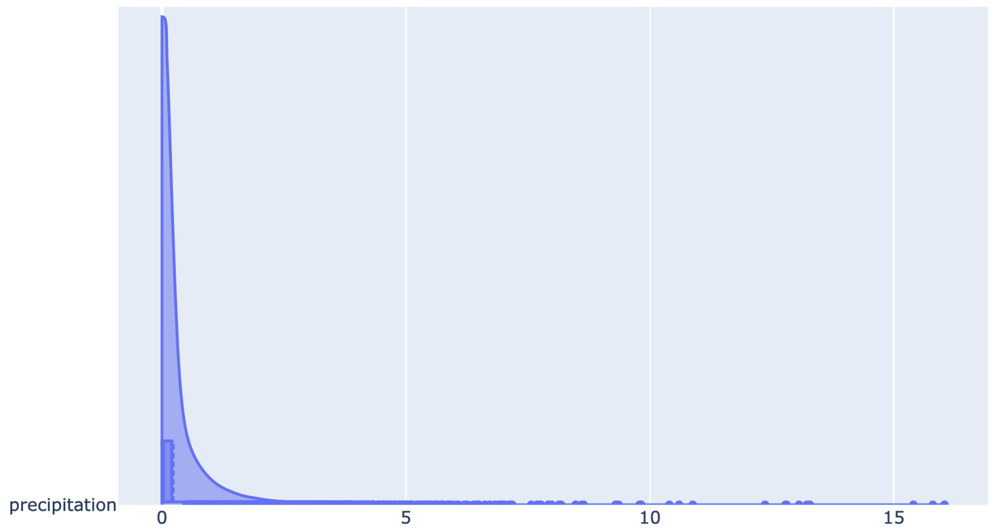

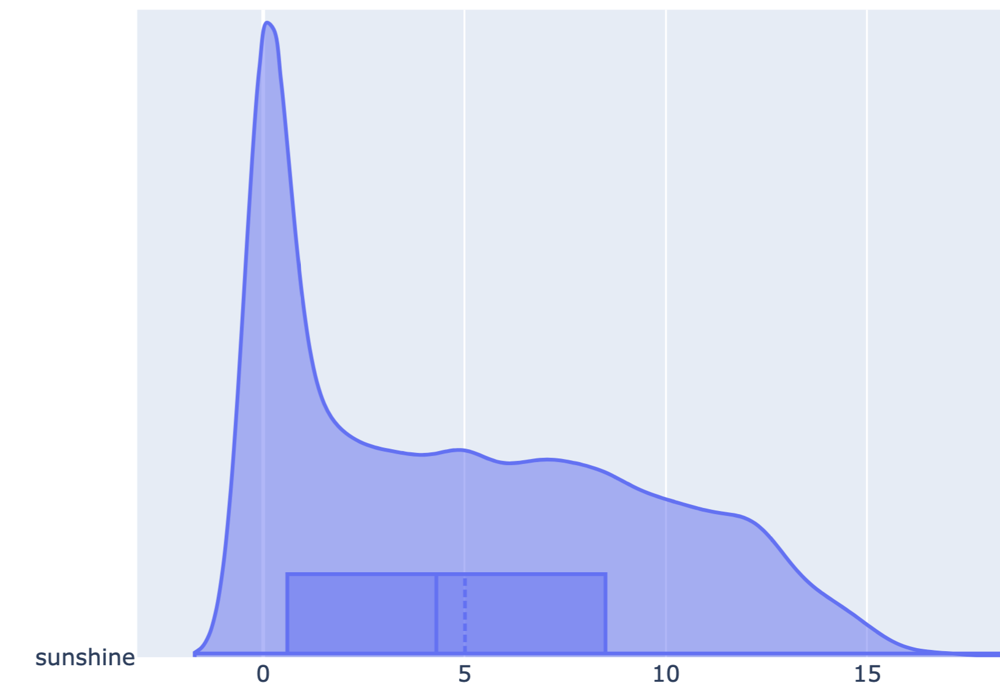

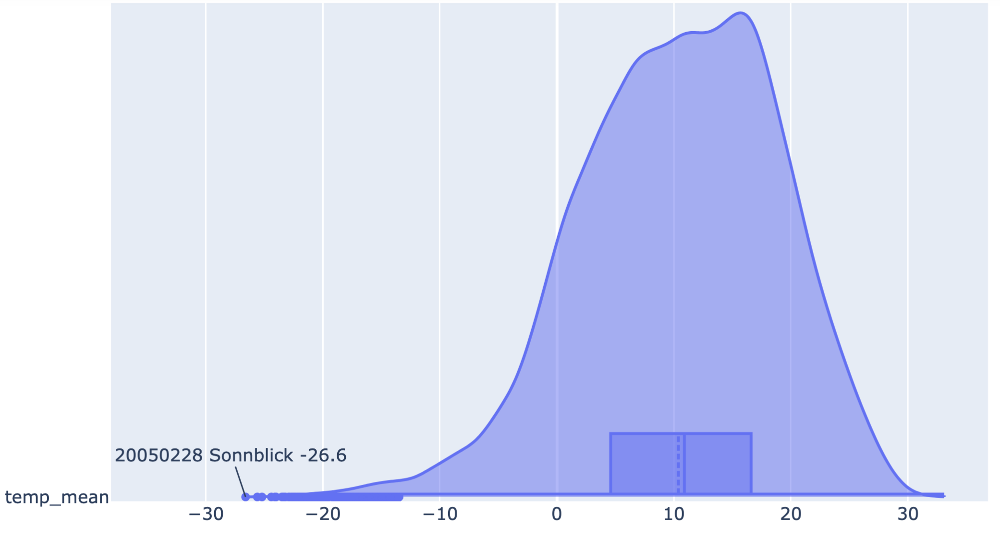

### Distribution of variables by locations

<Axes: xlabel='MONTH', ylabel='DUSSELDORF_sunshine'>

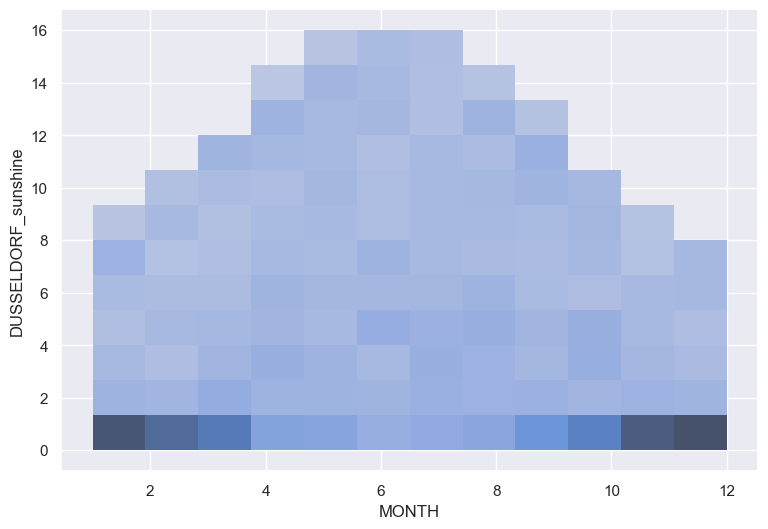

In [73]:
sns.histplot(data=citydata['DUSSELDORF'], x='MONTH', y='DUSSELDORF_sunshine', bins=12)

<Axes: xlabel='MONTH', ylabel='ROMA_sunshine'>

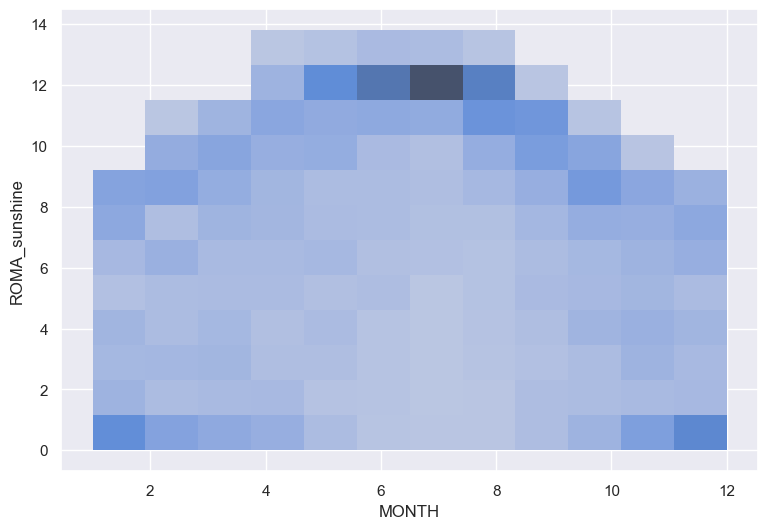

In [74]:
sns.histplot(data=citydata['ROMA'], x='MONTH', y='ROMA_sunshine', bins=12)

<Axes: xlabel='MONTH', ylabel='DUSSELDORF_precipitation'>

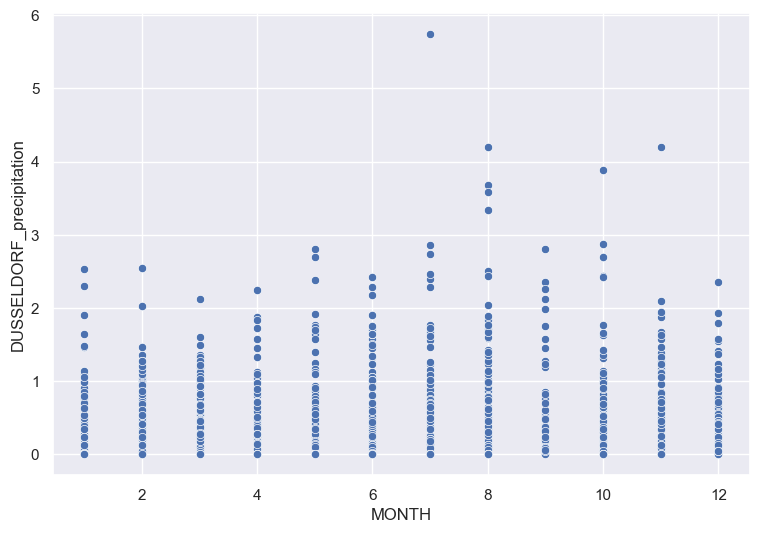

In [75]:
sns.scatterplot(data=citydata['DUSSELDORF'], x='MONTH', y='DUSSELDORF_precipitation')

<Axes: xlabel='MONTH', ylabel='MAASTRICHT_precipitation'>

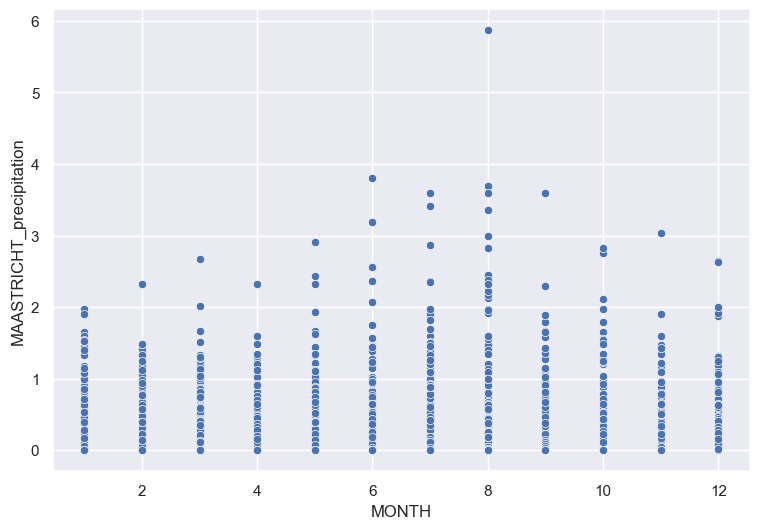

In [76]:
sns.scatterplot(data=citydata['MAASTRICHT'], x='MONTH', y='MAASTRICHT_precipitation')

In [77]:
fig = go.Figure()
measure='sunshine'
for city in list(cities)[0:4]:
    if measure in cities2measures[city]:
        fig.add_trace(go.Violin(y=df[city+'_'+measure], name=city, text=df['DATE'], points='outliers'))
fig.update_layout(showlegend=False, title_text='Sunshine by location')
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


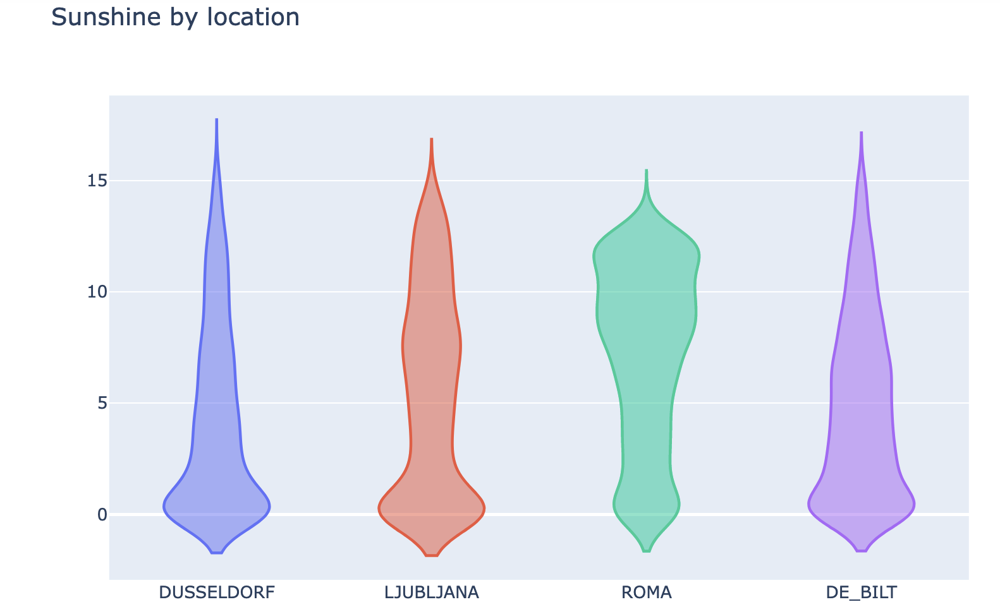

In [78]:
fig = go.Figure()
measure='sunshine'
for city in list(sorted(cities)):
    if measure in cities2measures[city]:
        fig.add_trace(go.Violin(y=df[city+'_'+measure], name=city, text=df['DATE'], points='outliers'))
fig.update_layout(showlegend=False, title_text='Mean temperatures by location')
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


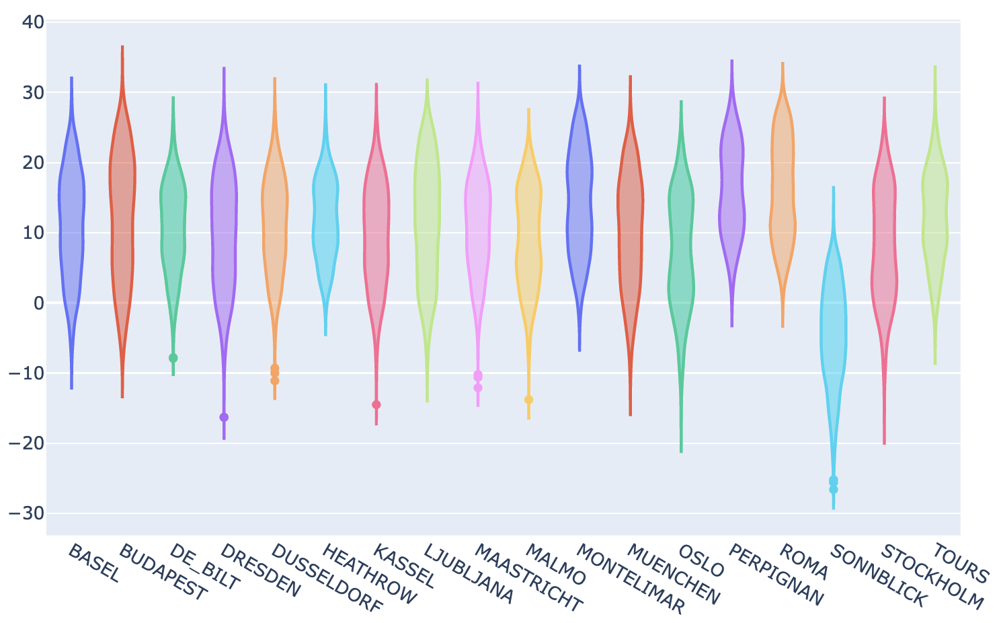

In [79]:
fig = go.Figure()
#for plot reproducibility:
for city in  ['DUSSELDORF', 'LJUBLJANA', 'PERPIGNAN', 'MALMO', 'DE_BILT', 'MONTELIMAR', 'OSLO',
              'SONNBLICK', 'STOCKHOLM', 'MAASTRICHT', 'BASEL', 'TOURS', 'MUENCHEN', 'DRESDEN', 'BUDAPEST',
              'KASSEL', 'HEATHROW', 'ROMA']:
    if 'precipitation' in cities2measures[city]:
        fig.add_trace(go.Violin(y=df[city+'_precipitation'], name=city, text=df['DATE'],
                                points='outliers', spanmode='hard'))
fig.update_layout(showlegend=False, title_text='Precipitation by location' )
fig.add_annotation(x=0, y=5.74, text="20090703")
fig.add_annotation(x=0, y=4.2, text="20080803", ax=-10, ay=20)
fig.add_annotation(x=1, y=8.64, text="20041009")
fig.add_annotation(x=1, y=4.24, text="20080815", ax=-10, ay=30)
fig.add_annotation(x=2, y=16.04, text="20051114")
fig.add_annotation(x=3, y=7.69, text="20070705")
fig.add_annotation(x=5, y=15.4,text="20080812")
fig.add_annotation(x=8, y=3.88, text="20080804")
fig.add_annotation(x=9, y=5.87, text="20070809")
fig.add_annotation(x=9, y=3.59, text="20080803", ay=20)
fig.add_annotation(x=10, y=7.57, text="20070808")
fig.add_annotation(x=12, y=9.79, text="20000517")
fig.add_annotation(x=13, y=2.6, text="20080807")
fig.add_annotation(x=13, y=15.8, text="20020812")

#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


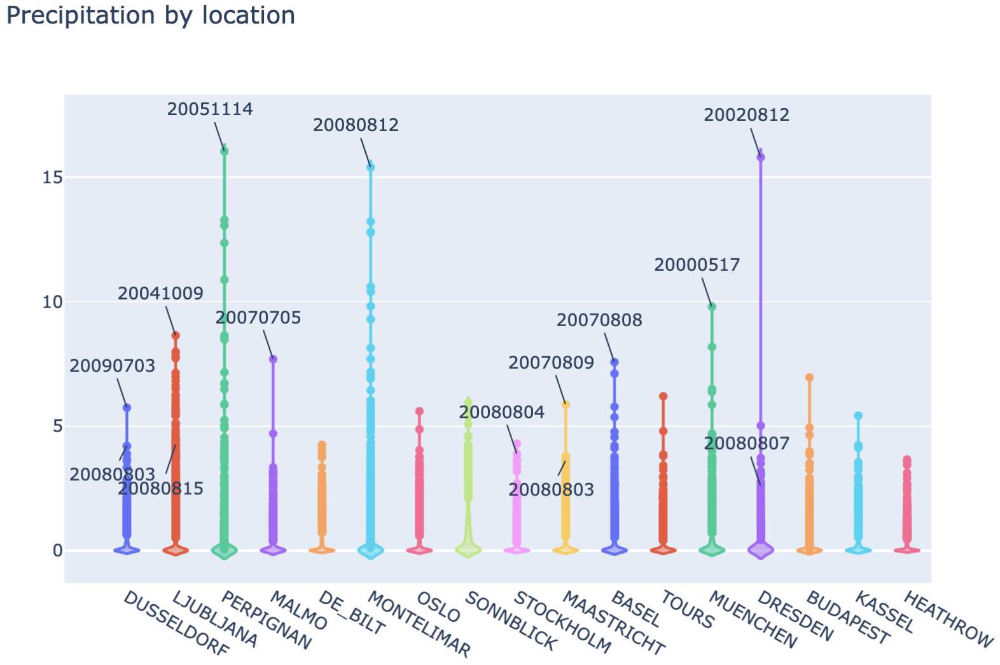

In [80]:
#to check precipitation for Aug 2008 across all cities
aug_rain=df.loc[(df['DATE']>=20080801) & (df['DATE']<=20080831)][['DATE']+[city+'_precipitation' for city in cities if city != 'ROMA']]
aug_rain=aug_rain.set_index('DATE')
#time line of top precipitation by city in Aug 2008
aug_toprain=pd.DataFrame(zip(aug_rain.columns, aug_rain.idxmax(), aug_rain.max()))
aug_toprain.columns=['city','DATE','precipitation']
aug_toprain.city=[x.split('_')[0] if x != 'DE_BILT_precipitation' else 'DE_BILT' for x in aug_toprain.city]
fig = px.scatter(aug_toprain, x='DATE',y='precipitation', text=aug_toprain['city'])
#fig.show()

### Distribution of variables by month

In [81]:
by_month = df.groupby('MONTH')
by_year = df.groupby('YEAR')

In [82]:
months_palette = sns.diverging_palette(250, 250, n=12, center="dark")
month_colour_tuples=[x for x in list(months_palette)]
month_colours=['rgb'+str(tups)+'' for tups in month_colour_tuples]
city_colour_tuples=[x for x in list(sns.color_palette("hls", 18))]
city_colours=['rgb'+str(tups)+'' for tups in city_colour_tuples]
year_colour_tuples=[x for x in list(sns.color_palette("hls", 10))]
year_colours=['rgb'+str(tups)+'' for tups in year_colour_tuples]
months_palette

[(0.26613466399181535, 0.47369810827813025, 0.7317615976606106),
 (0.24335449909160858, 0.4147282053323163, 0.6290009850082352),
 (0.2205743341914018, 0.35575830238650236, 0.5262403723558599),
 (0.19730088277204144, 0.29551145266324425, 0.42125455961632796),
 (0.17353027591965176, 0.23397764089369927, 0.31402609423993627),
 (0.150750111019445, 0.17500773794788532, 0.2112654815875609),
 (0.150750111019445, 0.1750077379478853, 0.21126548158756087),
 (0.17353027591965176, 0.23397764089369924, 0.3140260942399362),
 (0.19730088277204144, 0.29551145266324425, 0.4212545596163279),
 (0.2205743341914018, 0.35575830238650236, 0.5262403723558599),
 (0.24335449909160858, 0.41472820533231625, 0.6290009850082352),
 (0.26613466399181535, 0.47369810827813025, 0.7317615976606106)]

In [83]:
measure='temp_mean'
layout=go.Layout()
all_traces=[]
fig = go.Figure()
columns=[city+'_'+measure for city in cities if measure in cities2measures[city]]
for month, subdf in by_month:
    fig.add_trace(go.Violin(x=subdf[columns].stack(),
                            name=str(month),
                           side='positive', points=False,
                           orientation='h', width=2, spanmode='hard', line_color=month_colours[month-1]))
fig.update_layout(showlegend=False)
fig.update_layout(
    title_text='Mean temperatures by month across all locations',
    xaxis_title=measure+'(°C)',
    yaxis_title='Month'
)
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


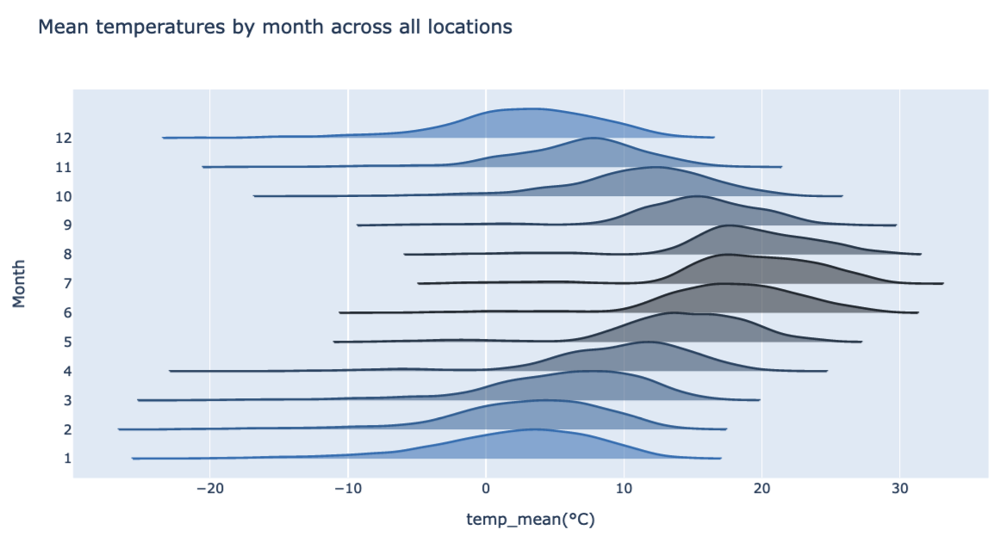

In [84]:
measure='pressure'
layout=go.Layout()
all_traces=[]
fig = go.Figure()
columns=[city+'_'+measure for city in cities if measure in cities2measures[city]]
for month, subdf in by_month:
    fig.add_trace(go.Violin(x=subdf[columns].stack(), box_visible=True, name=str(month), side='positive',
                            points=False, orientation='h', width=2, spanmode='hard',
                            line_color=month_colours[month-1]))
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Pressure by month across all locations', xaxis_title=measure+'(x1000 hPa)', yaxis_title='Month')
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


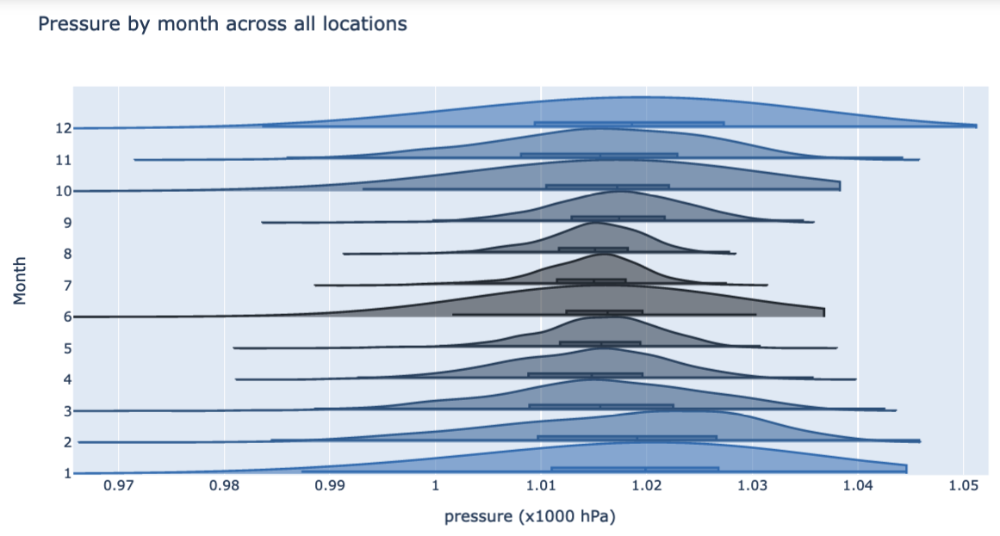

In [85]:
measure = 'sunshine'
layout = go.Layout()
all_traces=[]
fig = go.Figure()
#for i, city in enumerate(cities):
for i, city in enumerate(['DRESDEN','ROMA']):
    if measure in cities2measures[city]:
        for month, subdf in by_month:
            fig.add_trace(go.Violin(x=subdf[city+'_'+measure],
                                    name=city+str(month),
                                   side='positive', points=False,
                                   orientation='h', width=2, spanmode='hard', line_color=city_colours[i]))
fig.update_layout(showlegend=False)
fig.update_layout(
    title_text='Sunshine by location and month',
    xaxis_title="Sunshine hours",
    yaxis_title="Location and month"
)
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


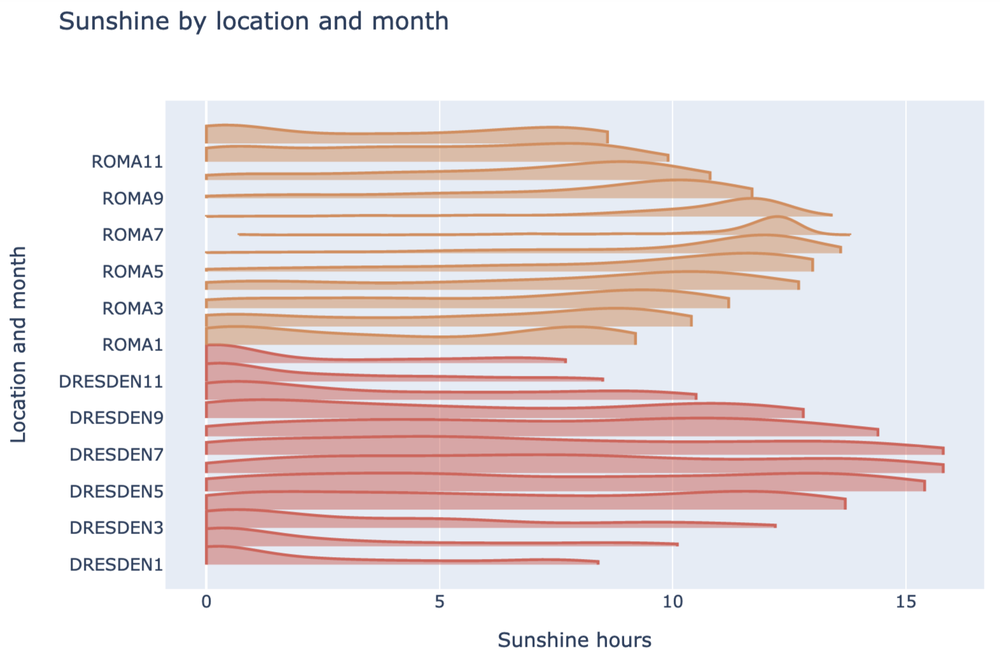

In [86]:
traces, layout = cmplot(citydata['DUSSELDORF'], xcol='MONTH', ycol='DUSSELDORF_temp_mean', showpoints=False, side='pos', spanmode="hard", ycolorgroups=False)
layout.showlegend = False
fig = go.Figure(traces, layout)
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


/Users/insana/miniconda3/envs/tensorflow_env/lib/python3.10/site-packages/cmplot.py:340: FutureWarning:

In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.



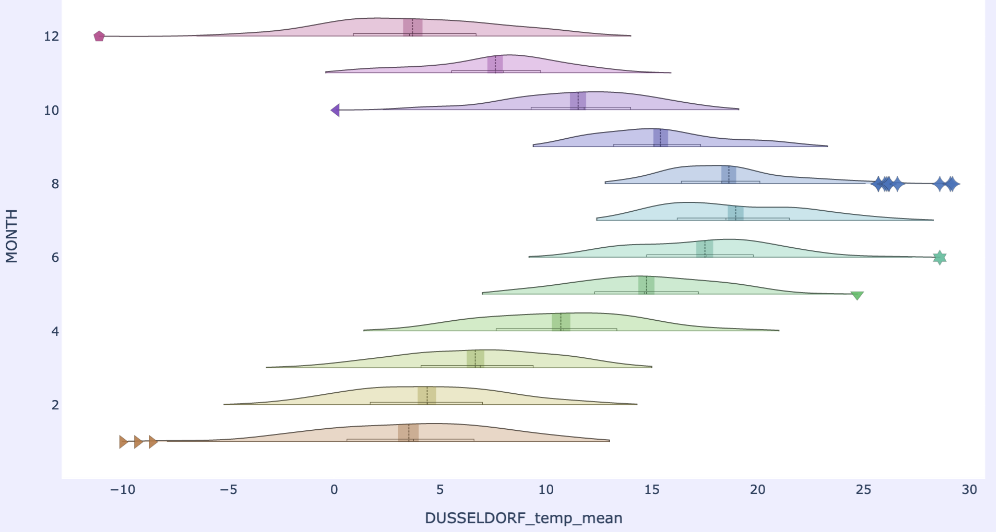

In [87]:
#traces, layout = cmplot(citydata['MAASTRICHT'], xcol='MONTH', ycol='MAASTRICHT_sunshine', showpoints=False, side='pos',spanmode="hard", ycolorgroups=False)
#layout.showlegend=False
#fig = go.Figure(traces, layout)
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


<Axes: xlabel='DUSSELDORF_temp_max', ylabel='Count'>

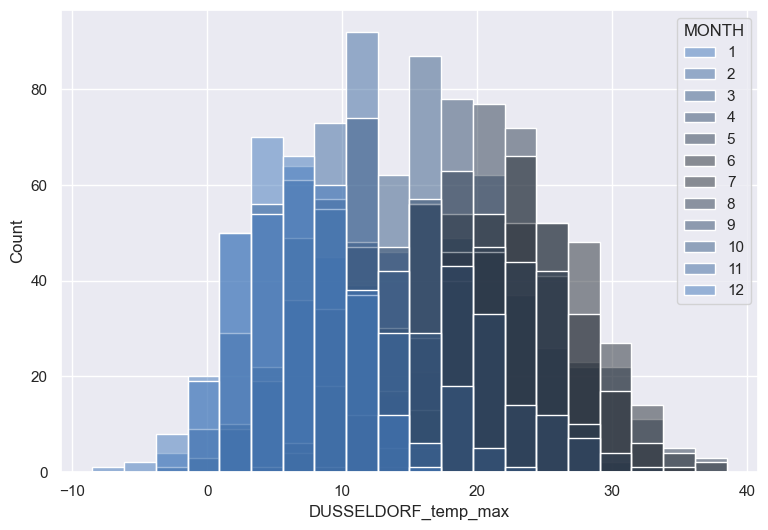

In [88]:
sns.histplot(data=df, x='DUSSELDORF_temp_max', hue='MONTH', bins=20, palette=months_palette)

### Distribution of variables by year

In [201]:
measure='temp_mean'
layout=go.Layout()
all_traces=[]
fig = go.Figure()
columns=[city+'_'+measure for city in cities if measure in cities2measures[city]]
for year, subdf in by_year:
    fig.add_trace(go.Violin(x=subdf[columns].stack().values,
                            name=str(year),
                           side='positive', points=False,
                           orientation='h', width=2, spanmode='hard', box_visible=False, line_color=year_colours[year % 2000]))
fig.update_layout(showlegend=False)
fig.update_layout(
    title_text='Mean temperatures by year across all locations',
    xaxis_title=measure+' (°C)',
    yaxis_title='Year'
)
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


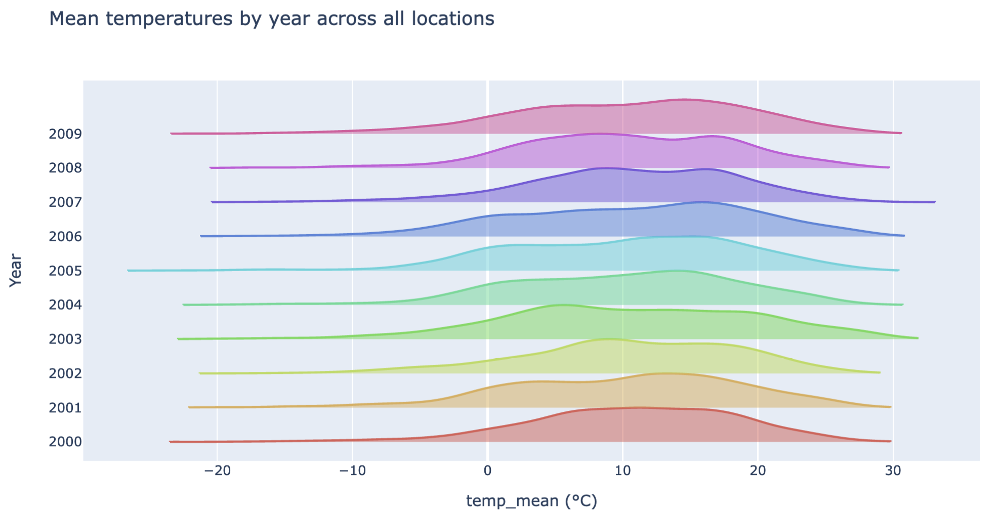

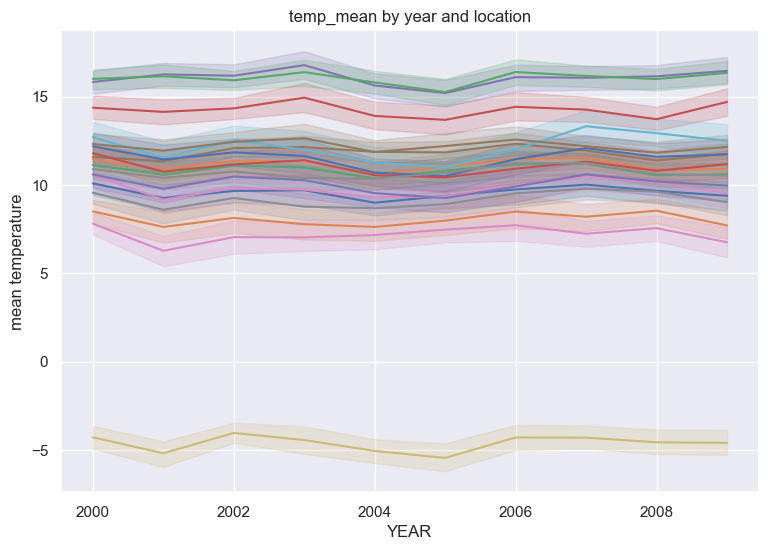

In [90]:
for city in cities:
    sns.lineplot(data=df, x='YEAR', y=city+'_temp_mean').set(ylabel ="mean temperature", title ='temp_mean by year and location')

<Axes: xlabel='ROMA_temp_max', ylabel='Count'>

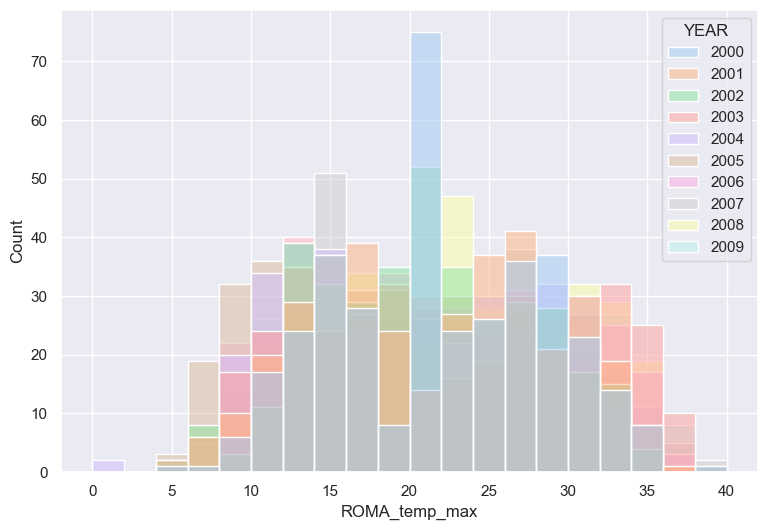

In [91]:
sns.histplot(data=df, x='ROMA_temp_max', hue='YEAR', bins=20, palette="pastel")

<Axes: xlabel='YEAR', ylabel='mean'>

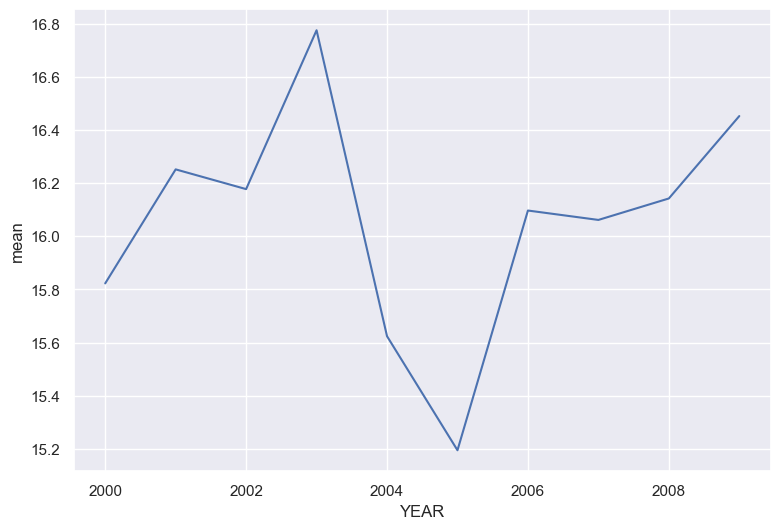

In [92]:
sns.lineplot(data=by_year['ROMA_temp_mean'].describe()['mean'])

### Pairplots

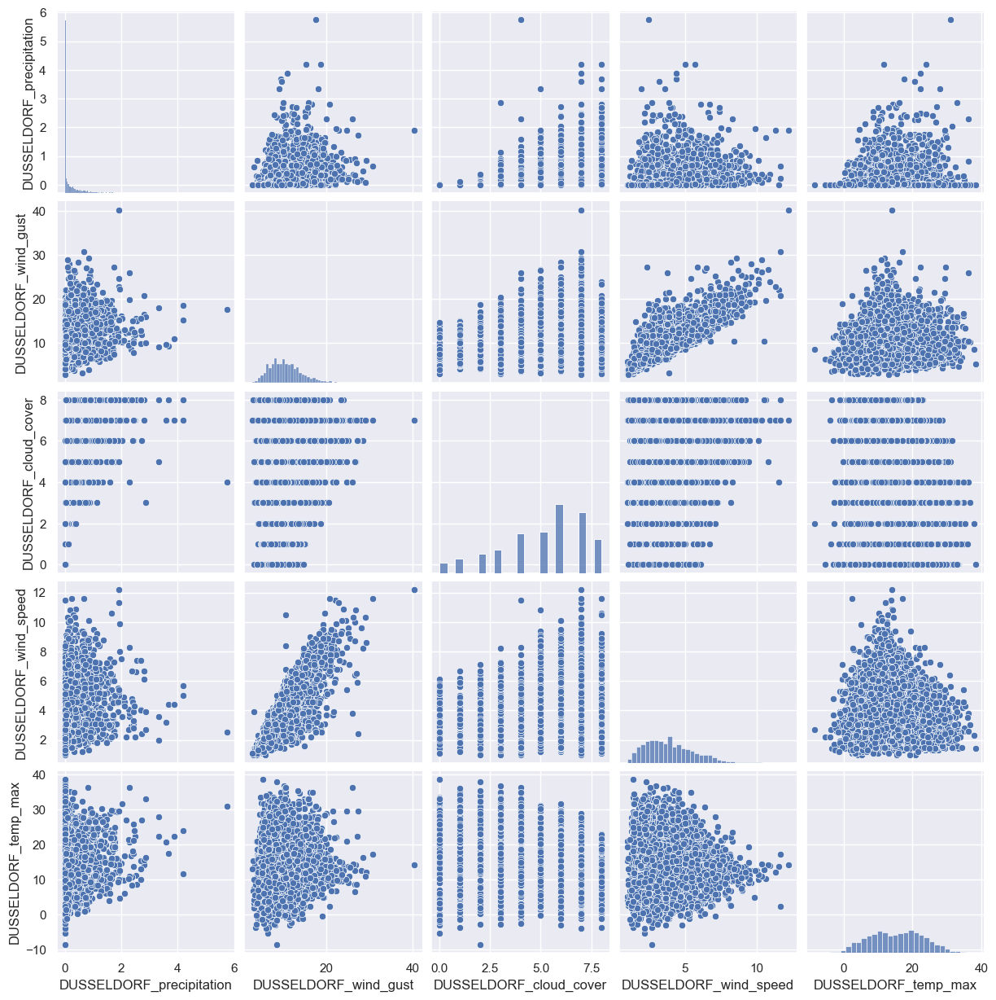

In [93]:
##pairplot for one city, some variables:
city='DUSSELDORF'
columns=[city+'_'+measure for measure in cities2measures[city]]
sns.pairplot(df[columns[0:5]])
##pairplot for one city, all variables:
#sns.pairplot(df[columns])
##to do a pairplot with two cities to see the correlation among them
##warning, big!:
#sns.pairplot(df,vars=[city+'_'+x for x in cities2measures[city] for city in ['DUSSELDORF', 'MAASTRICHT']])

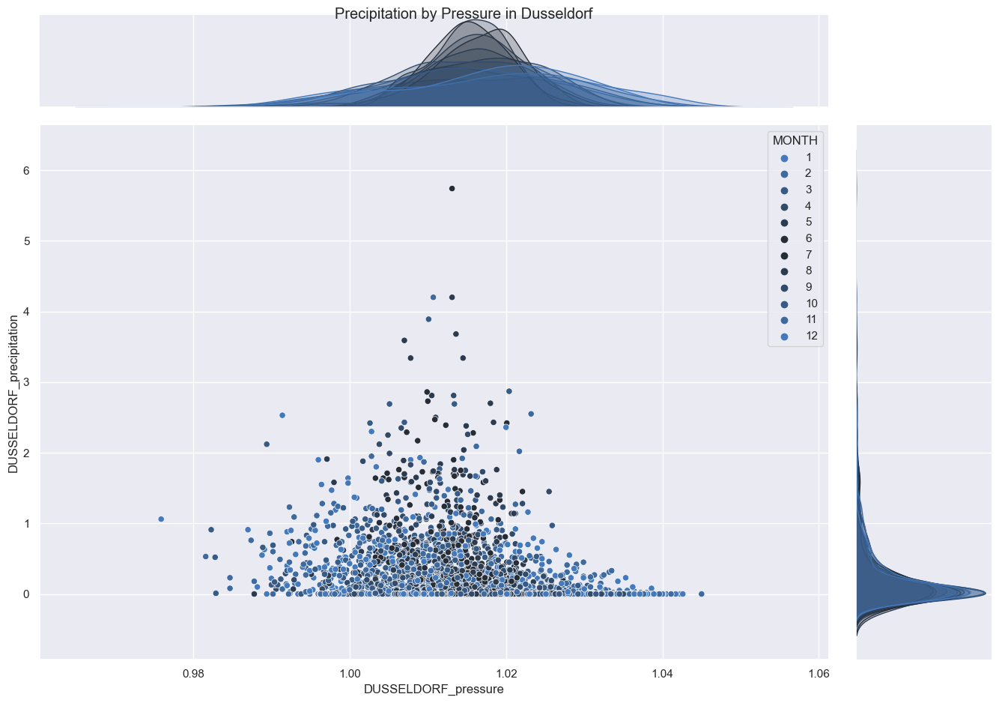

In [94]:
city='DUSSELDORF'
a=sns.jointplot(data=citydata[city], x=f'{city}_pressure', hue='MONTH', y=f'{city}_precipitation', kind='scatter', palette=months_palette).figure
a.suptitle('Precipitation by Pressure in Dusseldorf')
a.set_figwidth(15)
a.set_figheight(10)

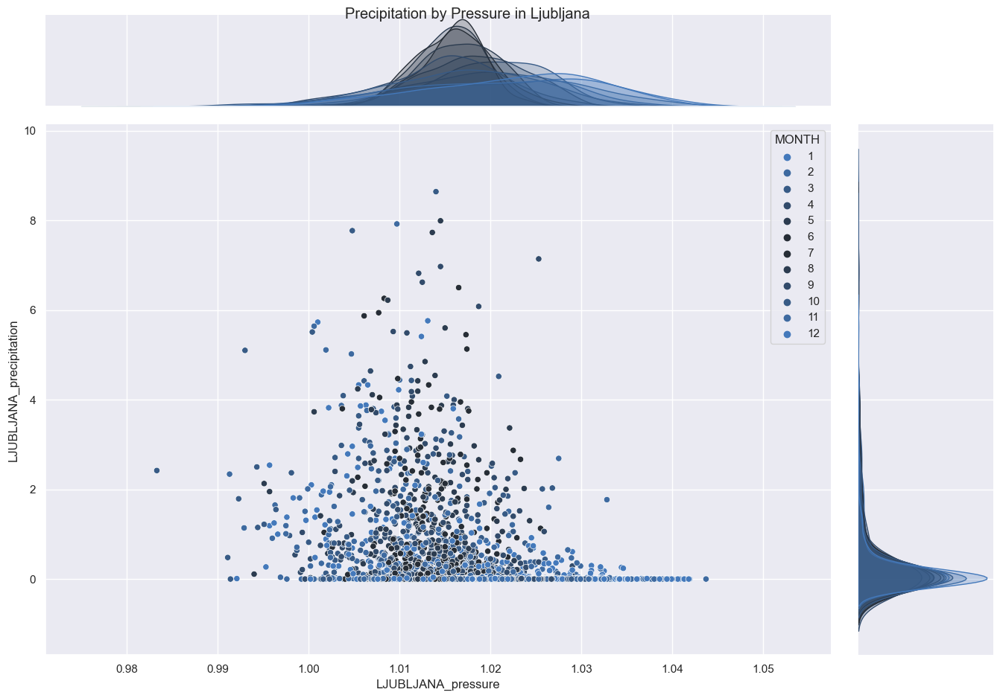

In [95]:
city='LJUBLJANA'
a=sns.jointplot(data=citydata[city], x=f'{city}_pressure', hue='MONTH', y=f'{city}_precipitation', kind='scatter', palette=months_palette).figure
a.suptitle('Precipitation by Pressure in Ljubljana')
a.set_figwidth(15)
a.set_figheight(10)

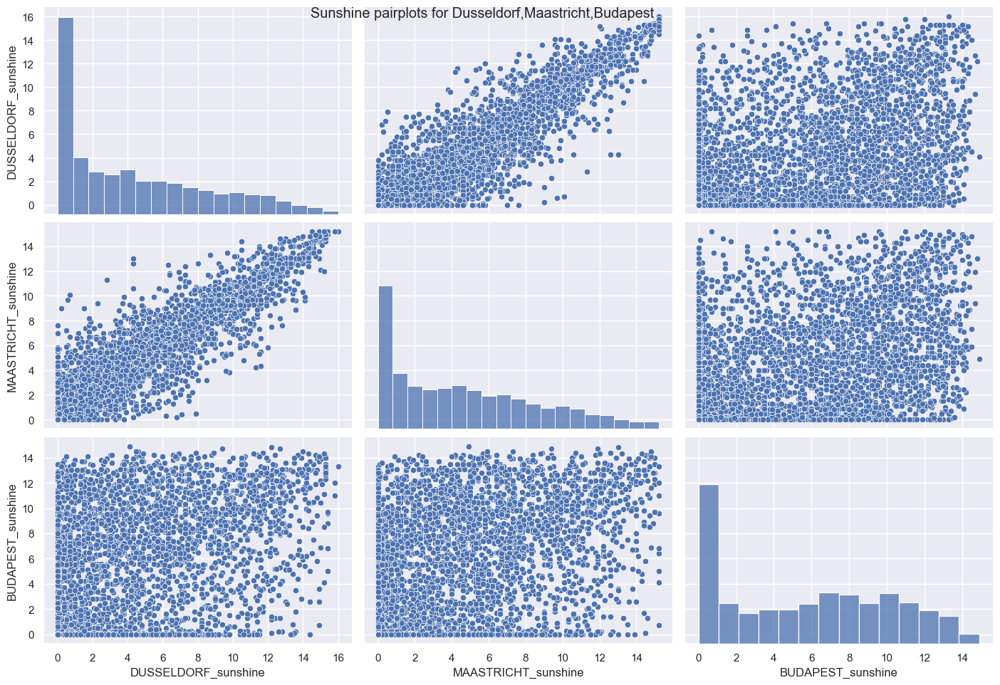

In [ ]:
#to do a pairplot with few cities for a single feature:
measure="sunshine"
these_cities=['DUSSELDORF', 'MAASTRICHT', 'BUDAPEST']
a=sns.pairplot(df,vars=[city+'_'+measure for city in these_cities]).figure
a.suptitle('Sunshine pairplots for '+','.join([str(x).lower().capitalize() for x in these_cities]))
a.set_figwidth(15)
a.set_figheight(10)

## OOR
### Looking at out of range values
[back to ToC](#Contents)

### Cloud cover -99? 9?

In [ ]:
measure = 'cloud_cover'
print(bymeasure[measure].loc[bymeasure[measure][measure].idxmin()])
print(bymeasure[measure].loc[bymeasure[measure][measure].idxmax()])

In [ ]:
#optional:
#we can use qgrid and sort by cloud_cover to check all out of range values
#qgrid.show_grid(df[['DATE','STOCKHOLM_cloud_cover']])

### Negative air pressure?


In [99]:
#we can use qgrid and sort to check all out of range values
#qgrid.show_grid(data[['DATE','STOCKHOLM_pressure']])

In [100]:
#only for Stockholm
measure = 'pressure'
print(bymeasure[measure].loc[bymeasure[measure][measure].idxmin()])

pressure   -0.099
Name: (20000124, STOCKHOLM_pressure), dtype: float64


### Negative sunshine? sunshine 24 h/day?


In [101]:
#again for Stockholm: negative sunshine
measure = 'sunshine'
print(bymeasure[measure].loc[bymeasure[measure][measure].idxmin()])
print(bymeasure[measure].loc[bymeasure[measure][measure].idxmax()])
#and for OSLO 24h sunshine

sunshine   -1.7
Name: (20000326, STOCKHOLM_sunshine), dtype: float64
sunshine    24.0
Name: (20061112, OSLO_sunshine), dtype: float64


In [102]:
#count how many negative data points
len(df.loc[(df['STOCKHOLM_sunshine'] < 0)])

29

In [103]:
print(len(df.loc[(df['OSLO_sunshine'] > 18)][['DATE','OSLO_sunshine']]),
      len(df.loc[(df['OSLO_sunshine'] >= 24)][['DATE','OSLO_sunshine']]))

24 20


In [104]:
df.loc[(df['OSLO_sunshine'] > 18)][['DATE','OSLO_sunshine']].head()

,DATE,OSLO_sunshine
2507,20061112,24.0
2508,20061113,24.0
2509,20061114,24.0
2510,20061115,24.0
2511,20061116,24.0


In [105]:
#create dict with mu and sigma for each variable
bymeasure_mean={}
bymeasure_std={}
bymeasure_min={}
bymeasure_max={}
print("Means and Std:")
for measure in sorted(measures):
    print("{}: avg {:.2f}, std {:.2f}".format(measure, bymeasure[measure].mean()[0], bymeasure[measure].std()[0]))
    bymeasure_mean[measure] = bymeasure[measure].mean()[0]
    bymeasure_std[measure] = bymeasure[measure].std()[0]
    bymeasure_min[measure] = bymeasure[measure].min()[0]
    bymeasure_max[measure] = bymeasure[measure].max()[0]

#helper functions for feature_scaling
def standardize(values, measure):
    """
    transforms the data such that the resulting distribution has μ=0 and σ=1
    mainly used in KNN and K-means
    """
    mu = bymeasure_mean[measure]
    sigma = bymeasure_std[measure]
    return (values - mu) / sigma

def mean_normalize(values, measure):
    mu = bymeasure_mean[measure]
    min = bymeasure_min[measure]
    max = bymeasure_max[measure]
    return (values - mu) / (max - min)


Means and Std:
cloud_cover: avg 5.13, std 2.43
global_radiation: avg 1.37, std 0.95
humidity: avg 0.75, std 0.14
precipitation: avg 0.23, std 0.58
pressure: avg 1.02, std 0.01
sunshine: avg 5.01, std 4.43
temp_max: avg 14.51, std 9.58
temp_mean: avg 10.39, std 8.41
temp_min: avg 6.33, std 7.58
wind_gust: avg 10.06, std 3.88
wind_speed: avg 3.33, std 1.89


## DataCleaning
[back to ToC](#Contents)
### Data cleaning and feature engineering

In [106]:
#convert cloud cover to int
df[measure_columns['cloud_cover']] = df[measure_columns['cloud_cover']].astype(int)
firstindex = df.head(1).index.values[0]
lastindex = df.tail(1).index.values[0]

In [107]:
#we'll work on a copy of the df for cleaning invalid values
cleandata = df.copy()

In [108]:
def impute_oor_values(df, oor_idxs, oor_column, verbose=True):
    range_days_window = 5 #we'll calculate the mean using the 5 days before and the 5 days after and use that to assign the value
    indexmodifier = 0 #in case there are subsequent invalid values, we need to shift one year forward or backward
    if oor_idxs[0] - 365 - range_days_window > firstindex: #if we can go back to previous year, we can use -365 as modifier
        indexmodifier_amount = -365
    elif oor_idxs[-1] + 365 + range_days_window < lastindex: #if we can go forward to next year, we can use +365 as modifier
        indexmodifier_amount = 365
    else:
        indexmodifier_amount = 0
        eprint("WARNING, we cannot use previous/last year to get avg data in case of subsequent out of range values!")

    for i, oor_idx in enumerate(oor_idxs):
        if indexmodifier != 0:
            break
        if i > 0 and oor_idx - range_days_window <= oor_idxs[i-1]:
            if verbose: print("for index {} (and possibly others) we cannot use window around the date, due to other invalid data in that range, shifting one year".format(oor_idx))
            indexmodifier = indexmodifier_amount
        if i < len(oor_idxs) - 1 and oor_idx + range_days_window >= oor_idxs[i+1]:
            if verbose: print("for index {} (and possibly others) we cannot use window around the date, due to other invalid data in that range, shifting one year".format(oor_idx))
            indexmodifier = indexmodifier_amount

    round_to_int = False
    if df[oor_column].dtype == int:
        round_to_int = True

    #if we have out of range values in subsequent days we cannot apply window around, so we can use data from one day before
    oor_values = df.loc[oor_idxs, oor_column]

    if verbose: print("** Imputing {} value(s) for column {} based on average from {} days before and after".format(len(oor_idxs), oor_column, range_days_window))
    if indexmodifier > 0:
        if verbose: print(" * Notice: due to subsequent invalid values, calculating average from a range {} days (after)".format(indexmodifier))
    elif indexmodifier < 0:
        if verbose: print(" * Notice: due to subsequent invalid values, calculating average from a range {} days (before)".format(indexmodifier))
        
    for oor_idx, oor_value in zip(oor_idxs, oor_values):
        window_start = oor_idx + indexmodifier - range_days_window
        window_end = oor_idx + indexmodifier + range_days_window + 1

        oor_newvalue = (df[window_start : oor_idx + indexmodifier][oor_column].mean() #mean of 5 days before
                        + df[oor_idx + indexmodifier + 1 : window_end][oor_column].mean()) / 2 # mean of 10 days around the date
        if round_to_int:
            oor_newvalue = int(round(oor_newvalue))
        if verbose: print("idx{}: from {} to {} using mean data from range {}-{}".format(oor_idx, oor_value, oor_newvalue, window_start, window_end))
        df.loc[oor_idx, oor_column] = oor_newvalue
    print('Imputed {} values'.format(len(oor_idxs)))

### Imputing cloud cover values -99 and 9

In [109]:
measure = "cloud_cover"
#identify out of range indexes, values and the column they belong to
oor_columns =  [col for col in measure_columns[measure] if (cleandata[col].isin([9, -99])).any()]
cleandata.loc[(cleandata[oor_columns].isin([9, -99])).any(axis=1) , ['DATE'] + oor_columns]
# -> Stockholm has both 9 and -99

,DATE,STOCKHOLM_cloud_cover
1407,20031108,9
3127,20080724,-99
3463,20090625,-99


In [110]:
#impute invalid values using the average of a window of values in same column
for oor_column in oor_columns:
    oor_idxs =  cleandata.loc[cleandata[[oor_column]].isin([9, -99]).any(axis=1)].index
    impute_oor_values(cleandata, oor_idxs, oor_column)

** Imputing 3 value(s) for column STOCKHOLM_cloud_cover based on average from 5 days before and after
idx1407: from 9 to 7 using mean data from range 1402-1413
idx3127: from -99 to 3 using mean data from range 3122-3133
idx3463: from -99 to 2 using mean data from range 3458-3469
Imputed 3 values


### out of range air pressure

In [111]:
measure = "pressure"
oor_columns =  [col for col in measure_columns[measure] if (cleandata[col] < 0.9).any()]
cleandata.loc[(cleandata[oor_columns] < 0.9).any(axis=1) , ['DATE'] + oor_columns]

,DATE,STOCKHOLM_pressure,TOURS_pressure
23,20000124,-0.0990,1.0234
2710,20070603,-0.0990,1.0205
2837,20071008,-0.0990,1.0242
3286,20081230,1.0328,0.0003


In [112]:
#impute invalid values using the average of a window of values in same column
for oor_column in oor_columns:
    oor_idxs =  cleandata.loc[(cleandata[[oor_column]]< 0.9).any(axis=1)].index
    impute_oor_values(cleandata, oor_idxs, oor_column)

** Imputing 3 value(s) for column STOCKHOLM_pressure based on average from 5 days before and after
idx23: from -0.099 to 1.00449 using mean data from range 18-29
idx2710: from -0.099 to 1.02079 using mean data from range 2705-2716
idx2837: from -0.099 to 1.0203099999999998 using mean data from range 2832-2843
Imputed 3 values
** Imputing 1 value(s) for column TOURS_pressure based on average from 5 days before and after
idx3286: from 0.0003 to 1.02485 using mean data from range 3281-3292
Imputed 1 values


In [113]:
measure = "sunshine"
oor_columns =  [col for col in measure_columns[measure] if ((cleandata[col] < 0) | (cleandata[col] >= 18)) .any()]
#cleandata.loc[((cleandata[oor_columns] < 0) | (cleandata[oor_columns] >= 18)).any(axis=1) , ['DATE'] + oor_columns]
oor_columns

['OSLO_sunshine', 'STOCKHOLM_sunshine']

In [114]:
#impute invalid values using the average of a window of values in same column
for oor_column in oor_columns:
    oor_idxs =  cleandata.loc[((cleandata[[oor_column]] < 0) | (cleandata[[oor_column]] >= 18)).any(axis=1)].index
    print('{}:'.format(oor_column), end='\t')
    impute_oor_values(cleandata, oor_idxs, oor_column, verbose=False)

OSLO_sunshine:	Imputed 25 values
STOCKHOLM_sunshine:	Imputed 29 values


## Outliers
[back to ToC](#Contents)

In [115]:
measure = "precipitation"
measure_max = 3
oor_columns =  [col for col in measure_columns[measure] if ((cleandata[col] > measure_max)) .any()]
outliers_num = len(cleandata.loc[(cleandata[oor_columns] > measure_max).any(axis=1)])
print("*** Identified {} outliers for measure {} limit {} max".format(outliers_num, measure, measure_max))

measure = "humidity"
measure_min = 0.25
oor_columns =  [col for col in measure_columns[measure] if ((cleandata[col] < measure_min)) .any()]
cleandata.loc[((cleandata[oor_columns] < measure_min)).any(axis=1) , ['DATE'] + oor_columns] #to see the outliers
outliers_num = len(cleandata.loc[(cleandata[oor_columns] < measure_min).any(axis=1)])
print("*** Identified {} outliers for measure {} limit {} min".format(outliers_num, measure, measure_min))

measure = "wind_speed"
measure_max = 12.5
oor_columns =  [col for col in measure_columns[measure] if ((cleandata[col] > measure_max)) .any()]
cleandata.loc[((cleandata[oor_columns] > measure_max)).any(axis=1) , ['DATE'] + oor_columns] #to see the outliers
outliers_num = len(cleandata.loc[(cleandata[oor_columns] > measure_max).any(axis=1)])
print("*** Identified {} outliers for measure {} limit {} max".format(outliers_num, measure, measure_max))

*** Identified 369 outliers for measure precipitation limit 3 max
*** Identified 29 outliers for measure humidity limit 0.25 min
*** Identified 30 outliers for measure wind_speed limit 12.5 max


In [116]:
#.e.g to check outliers:
cleandata.loc[((cleandata[oor_columns] > measure_max)).any(axis=1) , ['DATE'] + oor_columns].head()

,DATE,MONTELIMAR_wind_speed,PERPIGNAN_wind_speed
17,20000118,11.8,13.4
395,20010130,9.8,13.2
463,20010408,5.8,13.8
680,20011111,9.0,13.8
782,20020221,9.0,13.5


In [117]:
#NOTE: we decided not to impute outliers

## Normality and Skewdness tests

In [118]:
#Let's check if any of the features has normal distribution
#The null hypothesis of Shapiro’s test is that the population is distributed normally.
#Caveat: usually doesn’t work well with large cleandatasets (>5000)
alpha = 0.05 #significance level
found_one = False
for measure in measures:
    for city in cities:
        col = city+'_'+measure
        if col in cleandata.columns:
            x = cleandata[col]
            #tests of normality and correlation
            x_k2, x_k2_pvalue = normaltest(x)
            message = "{} D'agostino K2 test: {:.3f}, pvalue {:.3f} -> ".format(col, x_k2, x_k2_pvalue)
            if x_k2_pvalue > alpha:
                message += "probably Gaussian"
                found_one = True
                print(message)
            else:
                message += "ATTENTION: probably not Gaussian"
            x_sw, x_sw_value = shapiro(x)
            message = '{} Shapiro-Wilk test: {:.3f}, pvalue {:.3f} -> '.format(col, x_sw, x_sw_value)
            if x_sw_value > alpha:
                #p-value is not so low to allow us to reject the null hypothesis
                message += "probably Gaussian"
                found_one = True
                print(message)
            else:
                #we can reject the null hypothesis of the normality of the cleandataset
                message += "ATTENTION: probably not Gaussian"
if not found_one: 
    print("No feature has probable Gaussian distribution using significance level {}".format(alpha))

No feature has probable Gaussian distribution using significance level 0.05


In [119]:
#Checking skewed columns
def find_skewed_columns(df, skew_limit=0.75, full_df=False):
    skew_cols = (df.skew()
                 .sort_values(ascending=False)
                 .to_frame()
                 .rename(columns={0:'Skew'})
                 .query('abs(Skew) > {0}'.format(skew_limit)))
    if full_df:
        return skew_cols
    else:
        return skew_cols.index.tolist()

find_skewed_columns(cleandata, skew_limit=0.75, full_df=True).head(10)
#precipitation, wind measures and to a minor extent humidity are the most skewed

,Skew
DRESDEN_precipitation,13.075417
PERPIGNAN_precipitation,10.779272
MONTELIMAR_precipitation,7.478480
BUDAPEST_precipitation,5.661027
MALMO_precipitation,5.335884
MUENCHEN_precipitation,5.205889
BASEL_precipitation,4.529571
STOCKHOLM_precipitation,4.479878
TOURS_precipitation,4.232566
LJUBLJANA_precipitation,3.827500


## SignificanceTesting
[back to ToC](#Contents)

Pearsons correlation: 0.818, pvalue 0.00000000


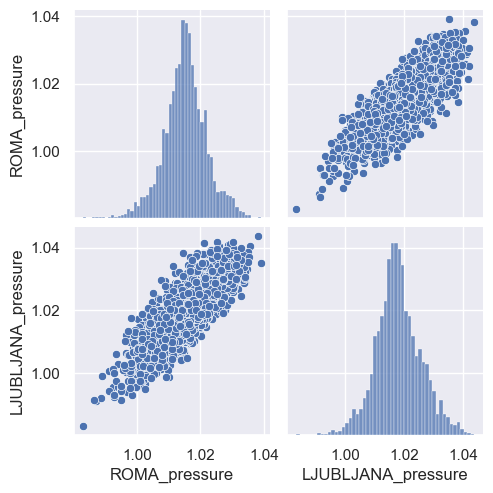

In [120]:
measure="pressure"
city1='ROMA'
city2='LJUBLJANA'
col1 = city1+'_'+measure
col2 = city2+'_'+measure
x = cleandata[col1]
y = cleandata[col2]
sns.pairplot(cleandata[[col1, col2]])

corr, pvalue = pearsonr(x, y)
print('Pearsons correlation: {:.3f}, pvalue {:.8f}'.format(corr, pvalue))

Pearsons correlation: 0.044, pvalue 0.00731782


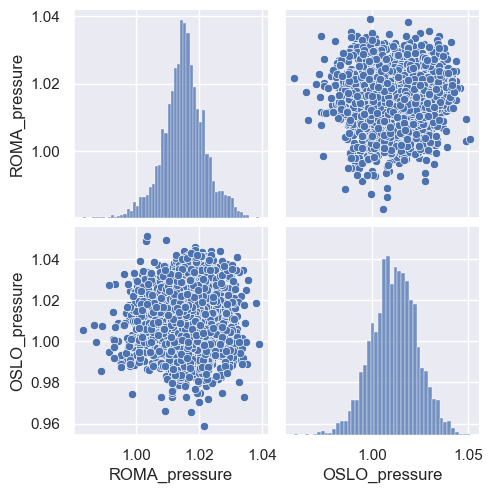

In [121]:
measure="pressure"
city1='ROMA'
city2='OSLO'
col1 = city1+'_'+measure
col2 = city2+'_'+measure
x = cleandata[col1]
y = cleandata[col2]
sns.pairplot(cleandata[[col1, col2]])

corr, pvalue = pearsonr(x, y)
print('Pearsons correlation: {:.3f}, pvalue {:.8f}'.format(corr, pvalue))

In [122]:
#to check for all cities against all cities
measure="pressure"
city1='ROMA'
observed_cities=[]
print("High absolute correlation with low p-values for {}:".format(measure))
for city1 in sorted(cities):
    if measure not in cities2measures[city1]:
        continue
    col1 = city1+'_'+measure
    observed_cities.append(city1)
    for city2 in sorted(cities):
        #if city2 in observed_cities:
        if city2 == city1:
            continue
        if measure in cities2measures[city2]:
            col2 = city2+'_'+measure
            x = cleandata[col1]
            y = cleandata[col2]
            corr, pvalue = pearsonr(x, y)
            if abs(corr) > 0.8 and pvalue < 0.01:
                print('{} - {}: {:.3f}\t{:.6f}'.format(city1, city2, corr, pvalue))

High absolute correlation with low p-values for pressure:
BASEL - DE_BILT: 0.845	0.000000
BASEL - DUSSELDORF: 0.897	0.000000
BASEL - KASSEL: 0.880	0.000000
BASEL - LJUBLJANA: 0.828	0.000000
BASEL - MAASTRICHT: 0.907	0.000000
BASEL - MONTELIMAR: 0.940	0.000000
BASEL - MUENCHEN: 0.972	0.000000
BASEL - PERPIGNAN: 0.902	0.000000
BASEL - TOURS: 0.929	0.000000
BUDAPEST - LJUBLJANA: 0.958	0.000000
BUDAPEST - MUENCHEN: 0.803	0.000000
DE_BILT - BASEL: 0.845	0.000000
DE_BILT - DUSSELDORF: 0.989	0.000000
DE_BILT - HEATHROW: 0.952	0.000000
DE_BILT - KASSEL: 0.960	0.000000
DE_BILT - MAASTRICHT: 0.989	0.000000
DE_BILT - MUENCHEN: 0.860	0.000000
DE_BILT - TOURS: 0.833	0.000000
DUSSELDORF - BASEL: 0.897	0.000000
DUSSELDORF - DE_BILT: 0.989	0.000000
DUSSELDORF - HEATHROW: 0.923	0.000000
DUSSELDORF - KASSEL: 0.982	0.000000
DUSSELDORF - MAASTRICHT: 0.996	0.000000
DUSSELDORF - MUENCHEN: 0.917	0.000000
DUSSELDORF - TOURS: 0.855	0.000000
HEATHROW - DE_BILT: 0.952	0.000000
HEATHROW - DUSSELDORF: 0.923	0.0000

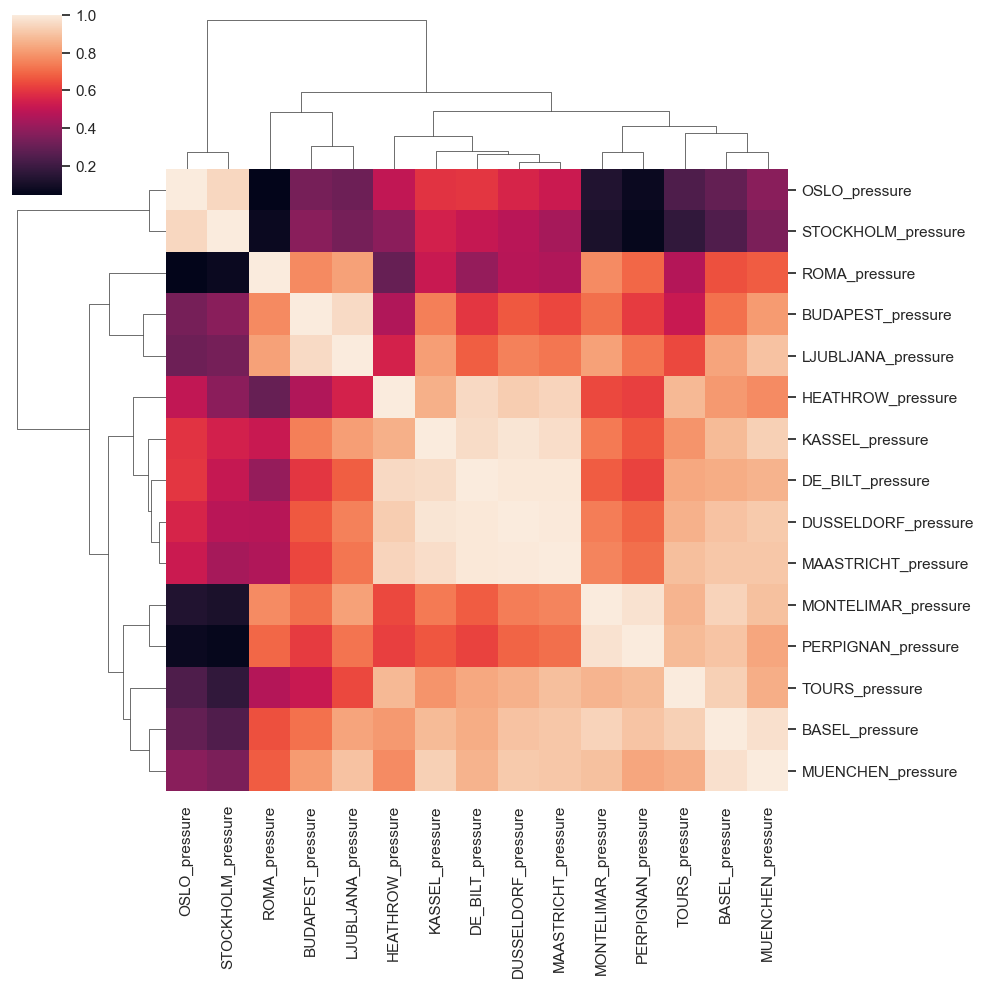

In [123]:
#clustermap according to correlations
measure="pressure"
sns.clustermap(cleandata[[x for x in cleandata.columns if x.find("_"+measure) != -1]].corr())

# Regression
[back to ToC](#Contents)
## Supervised Machine Learning: Regression

Please refer to the <a href='02.supMLregr_courseproject_report_GiuseppeInsana.pdf'>project report</a>

## Objective:
Main objective of the analysis that specifies whether your model will be focused on prediction or interpretation.

Brief description of the data set you chose and a summary of its attributes.

Brief summary of data exploration and actions taken for data cleaning and feature engineering.

Summary of training at least three linear regression models which should be variations that cover using a simple linear regression as a baseline, adding polynomial effects, and using a regularization regression. Preferably, all use the same training and test splits, or the same cross-validation method.

A paragraph explaining which of your regressions you recommend as a final model that best fits your needs in terms of accuracy and explainability.

Summary Key Findings and Insights, which walks your reader through the main drivers of your model and insights from your data derived from your linear regression model.

Suggestions for next steps in analyzing this data, which may include suggesting revisiting this model adding specific data features to achieve a better explanation or a better prediction.

In [124]:
def initialize_data(df, city4prediction, measure4prediction, includeMonth=True, includeDay=False,
                    reduced_data=False, #to training on a smaller subse
                    reduced_features=False, # to only use the set of cities and features for which we have data across all features
                    use_most_correlated_features=False, #to use the most correlated features only
                    timeseries=False
                   ):
    years_to_train_on = 3 #years of data to use if reduced_data
    col4prediction = city4prediction + "_" + measure4prediction
    if col4prediction not in df.columns:
        eprint("We don't have measure {} in the df!".format(col4prediction))
    else:
        if includeDay:
            print("*** We aim to predict tomorrow's '{}' measure in '{}' based on today's weather data for all locations and day+month information".format(measure4prediction,
                                                                                                                                                       city4prediction))
            X_data = df.drop(columns=['DATE', 'YEAR'])
        elif includeMonth:
            print("*** We aim to predict tomorrow's '{}' measure in '{}' based on today's weather data for all locations and month information".format(measure4prediction,
                                                                                                                                                       city4prediction))
            X_data = df.drop(columns=['DATE', 'YEAR', 'DAY'])
        else:
            print("*** We aim to predict tomorrow's '{}' measure in '{}' based on today's weather data for all locations without any date information".format(measure4prediction,
                                                                                                                                                       city4prediction))
            X_data = df.drop(columns=['DATE', 'YEAR', 'MONTH', 'DAY']) #if we want to also ignore MONTH

        if reduced_features:
            measures_sub = sorted(['global_radiation', 'humidity', 'pressure', 'temp_max', 'temp_mean', 'sunshine', 'precipitation'])
            cities_sub = measures2cities[measures_sub[0]] #start with cities for first measure
            for measure in measures_sub[1:]: #intersect with the cities for all the others
                cities_sub = cities_sub.intersection(measures2cities[measure])
            cities_sub = sorted(list(cities_sub)) #all cities which contain all the measures selected

            print ("We'll work on", len(cities_sub),"cities and",len(measures_sub),"measures")
            print ("  * Cities: {}".format(cities_sub))
            print ("  * Measures: {}".format(measures_sub))
            from itertools import product
            columns = [x+'_'+y for x,y in product(cities_sub, measures_sub)]
            if includeDay:
                columns = ['MONTH', 'DAY'] + columns
            elif includeMonth:
                columns = ['MONTH'] + columns
            X_data = X_data[columns]
        elif use_most_correlated_features:
            corr_limit = 0.5
            corr4df = X_data
            corr4df['target'] = X_data.loc[1:lastindex][col4prediction].tolist() + [0]
            corr2target = pd.DataFrame(corr4df.corr()['target'])
            corr2target['abscorr'] = abs(corr2target['target']) #compatible with old pandas
            mostcorr2target = corr2target.query('abs(abscorr) > {}'.format(corr_limit)).sort_values(by='abscorr', ascending=False)
            columns = [x for x in mostcorr2target.index.tolist() if x != 'target']
            print("** We'll use the {} most correlated columns (>{}) to {}, which are: {}".format(len(columns), corr_limit, col4prediction, columns))
            if includeDay:
                columns = ['MONTH', 'DAY'] + columns
            elif includeMonth:
                columns = ['MONTH'] + columns
            X_data = X_data[columns]

        X_data_ori = X_data
        
        if timeseries:
            if reduced_data:
                untilindex = lastindex - np.timedelta64(365 * (10 - years_to_train_on), 'D')
            else:
                untilindex = lastindex
            y_data = X_data.loc[firstindex:untilindex][col4prediction]
            X_data = X_data.loc[firstindex:untilindex]
        else:
            if reduced_data:
                untilindex = 365 * years_to_train_on
            else:
                untilindex = lastindex - 1
            y_data = X_data.loc[1:(untilindex+1)][col4prediction]
            X_data = X_data.loc[0:untilindex]
            
        print('Data size: X={} Y={}'.format(X_data.shape, y_data.shape))
        print(X_data[X_data.columns[0:7]].head())
        print(X_data[X_data.columns[0:7]].tail())
        print("\nFeature to predict:")
        print(y_data.head(), y_data.tail())
        return X_data, y_data, X_data_ori, untilindex

## Choosing the target of the prediction and which features to use

In [125]:
city4prediction = "BASEL"
measure4prediction = "sunshine"
col4prediction = city4prediction + "_" + measure4prediction
reduced_data = True
includeMonth = True
X_data, y_data, X_data_ori, untilindex = initialize_data(cleandata, city4prediction, measure4prediction,
                                                         reduced_data=reduced_data, includeMonth=includeMonth)

*** We aim to predict tomorrow's 'sunshine' measure in 'BASEL' based on today's weather data for all locations and month information
Data size: X=(1096, 164) Y=(1096,)
   MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure  \
0      1                  8            0.89          1.0286   
1      1                  8            0.87          1.0318   
2      1                  5            0.81          1.0314   
3      1                  7            0.79          1.0262   
4      1                  5            0.90          1.0246   

   BASEL_global_radiation  BASEL_precipitation  BASEL_sunshine  
0                    0.20                 0.03             0.0  
1                    0.25                 0.00             0.0  
2                    0.50                 0.00             3.7  
3                    0.63                 0.35             6.9  
4                    0.51                 0.07             3.7  
      MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure 

In [126]:
#we recreate measure_columns as the available cities/measures may have been reduced
measure_columns = {}
for col in X_data.columns:
    city = col.split("_")[0]
    if city == 'DE':
        city = 'DE_BILT'
        measure = "_".join(col.split("_")[2:])
    else:
        measure = "_".join(col.split("_")[1:])     
    if measure not in measure_columns:
        measure_columns[measure]=list()
    measure_columns[measure].append(col)

In [127]:
threads = 7 #for multithread

## CrossValidation
[back to ToC](#Contents)

### Creating Test Train split

In [128]:
from sklearn.model_selection import train_test_split
#we set aside 20% of the data to test the accuracy of our models
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=12)

### Choosing folds for Cross validation

In [129]:
from sklearn.model_selection import KFold
if reduced_data:
    folds = 2 #for KFold
else:
    #folds = 5
    folds = 3 #note, for course projects used 5
KF = KFold(shuffle=True, random_state=42, n_splits=folds)

## BaselineModels
[back to ToC](#Contents)

In [130]:
#as baseline we can take today's weather in the city
y_baseline_train_pred = X_train[col4prediction] #'same as today'
y_baseline_test_pred = X_test[col4prediction]

#we can also use a dummy regressor which always uses the mean for the measure as the prediction
from sklearn.dummy import DummyRegressor
dummy_mean = DummyRegressor(strategy="mean")
dummy_mean.fit(X_train, y_train)
y_dummy_train_pred = dummy_mean.predict(X_train)
y_dummy_test_pred = dummy_mean.predict(X_test)

In [131]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

errors_df = pd.DataFrame()
#reset metrics df
error_df = pd.DataFrame([
{ # dummy: predict tomorrow weather as mean of all observed measures
    'trainMSE' : mean_squared_error(y_train,  y_dummy_train_pred),
    'testMSE' : mean_squared_error(y_test,  y_dummy_test_pred),
    'trainR2' : r2_score(y_train, y_dummy_train_pred),
    'testR2' : r2_score(y_test, y_dummy_test_pred)
},
{ #baseline: predict tomorrow weather as equal to today
    'trainMSE': mean_squared_error(y_train, y_baseline_train_pred),
    'testMSE' : mean_squared_error(y_test,  y_baseline_test_pred),
    'trainR2' : r2_score(y_train, y_baseline_train_pred),
    'testR2' : r2_score(y_test, y_baseline_test_pred)
}
],
    index=['dummy_mean', 'same_as_today'])#, 'LR'])
errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(2), 4)

,trainMSE,testMSE,trainR2,testR2
dummy_mean,19.1498,21.0765,0.0000,-0.0014
same_as_today,17.7810,21.5345,0.0715,-0.0232


Text(0.5, 0, 'predicted sunshine')

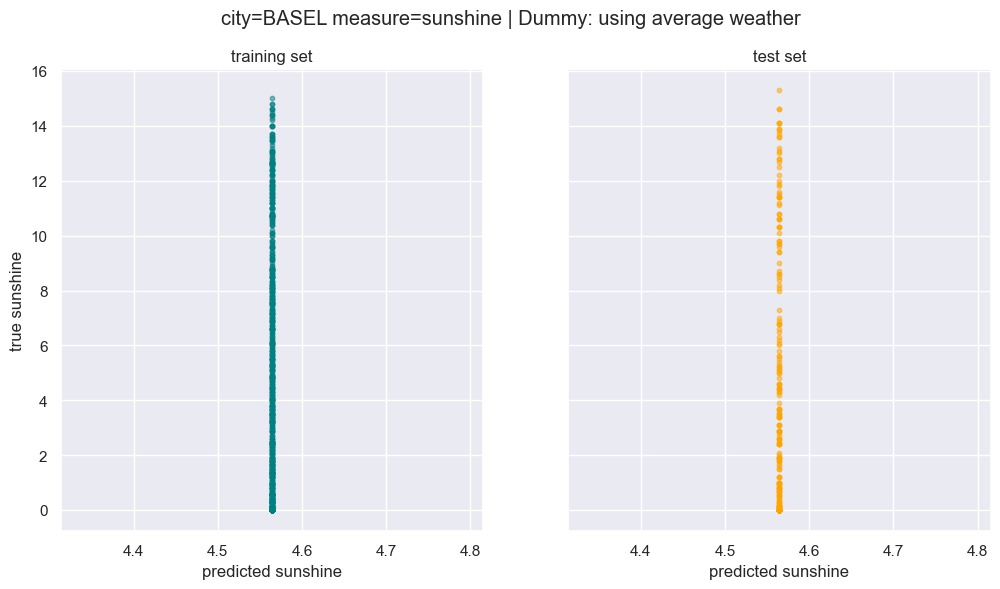

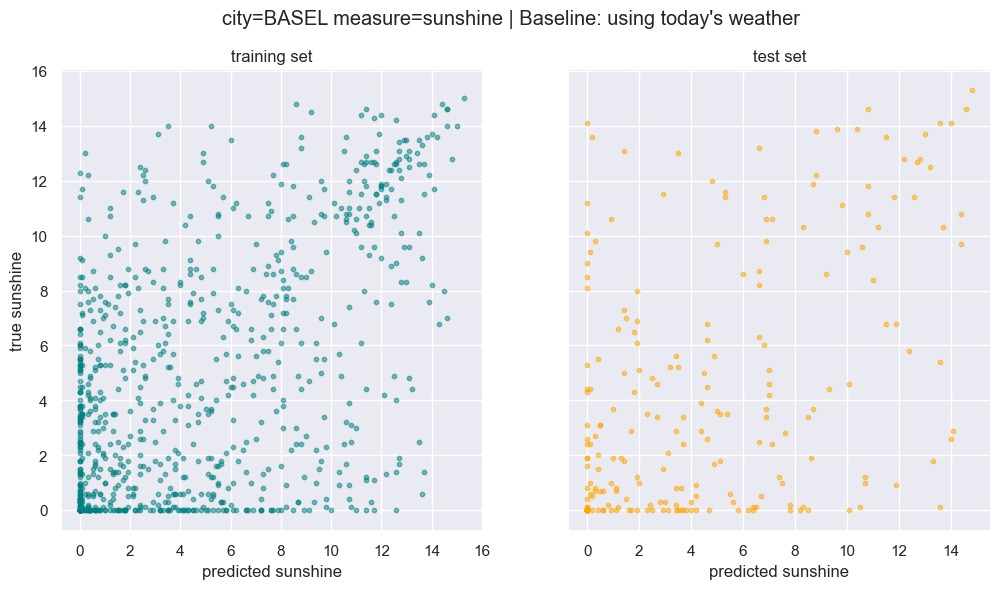

In [81]:
#Plots for baseline models
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
fig.suptitle("city={} measure={} | Dummy: using average weather".format(city4prediction, measure4prediction))
axes[0].scatter(y_dummy_train_pred, y_train, s=10, alpha=0.5, color="teal")
axes[0].set_title("training set")
axes[0].set_xlabel("predicted {}".format(measure4prediction))
axes[0].set_ylabel("true {}".format(measure4prediction))

axes[1].scatter(y_dummy_test_pred, y_test, s=10, alpha=0.5, color="orange")
axes[1].set_title("test set")
axes[1].set_xlabel("predicted {}".format(measure4prediction))

fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
fig.suptitle("city={} measure={} | Baseline: using today's weather".format(city4prediction, measure4prediction))
axes[0].scatter(y_baseline_train_pred, y_train, s=10, alpha=0.5, color="teal")
axes[0].set_title("training set")
axes[0].set_xlabel("predicted {}".format(measure4prediction))
axes[0].set_ylabel("true {}".format(measure4prediction))

axes[1].scatter(y_baseline_test_pred, y_test, s=10, alpha=0.5, color="orange")
axes[1].set_title("test set")
axes[1].set_xlabel("predicted {}".format(measure4prediction))


### Helper functions

In [132]:
from sklearn.pipeline import Pipeline

def score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=False):
    if fitted:
        y_test_pred = fitted.predict(X_test)
        y_train_pred = fitted.predict(X_train)
    if not fitted:
        estimator.fit(X_train, y_train)
        y_train_pred = estimator.predict(X_train)
        y_test_pred = estimator.predict(X_test)
    estimator.y_train = y_train
    estimator.y_test = y_test
    estimator.y_train_pred = y_train_pred
    estimator.y_test_pred = y_test_pred
    error_df=pd.DataFrame(
    {
        'trainMSE': -cross_val_score(estimator, X_train, y_train, scoring='neg_mean_squared_error', cv=KF).mean(),
        'testMSE' : mean_squared_error(y_test,  y_test_pred),
        'trainR2' : cross_val_score(estimator, X_train, y_train, scoring='r2', cv=KF).mean(),
        'testR2' : r2_score(y_test, y_test_pred)
    }, index=[est_name])
    return estimator, error_df

def plot_train_test(estimator, prediction_label, plot_title, coef = [], columns = [], feat_importance=False):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(plot_title)
    axes[0].scatter(estimator.y_train_pred, estimator.y_train, s=10, alpha=0.5, color="teal")
    axes[0].set_title("training set")
    axes[0].set_xlabel("predicted {}".format(prediction_label))
    axes[0].set_ylabel("true {}".format(prediction_label))

    axes[1].scatter(estimator.y_test_pred, estimator.y_test, s=10, alpha=0.5, color="orange")
    axes[1].set_title("test set")
    axes[1].set_xlabel("predicted {}".format(prediction_label))
    
    # Checking feature importance
    if len(coef):
        print('** Coefficient analysis')
        print('   Sum of coefficients: {:0.2f}'.format(abs(coef).sum()))
        zero_coef = (coef==0).sum()
        tot_coef = len(coef)
        print('   Coefficients set to zero: {}/{} ({:0.2f}%)'.format(zero_coef, tot_coef, 100 * zero_coef / tot_coef))
        print("   Highest (absolute) coefficients:")
        
        pandas_version = str(pd.__version__)
        if pandas_version.find("0.25") != -1: #back compatible with old pandas
            df_importances = pd.DataFrame(zip(columns, abs(coef), coef))
            df_importances.columns=['feat', '(abs_coef)', 'coef']
            print(df_importances.sort_values(by='(abs_coef)', ascending=False).head(10))
            all_nz_coefs = df_importances.query('coef != 0').sort_values(by='(abs_coef)', ascending=False).coef.tolist()
            all_nz_cols = df_importances.query('coef != 0').sort_values(by='(abs_coef)', ascending=False).feat.tolist()
        else:
            df_importances = pd.DataFrame(zip(columns, coef))
            df_importances.columns=['feat','coef']
            print(df_importances.sort_values(by='coef', ascending=False, key=abs).head(10))
            all_nz_coefs = df_importances.query('coef != 0').sort_values(by='coef', ascending=False, key=abs).coef.tolist()
            all_nz_cols = df_importances.query('coef != 0').sort_values(by='coef', ascending=False, key=abs).feat.tolist()
        if feat_importance: #for full printout of feature importance
            print(' full feature importance list:')
            for nz_coef,nz_col in zip(all_nz_coefs, all_nz_cols):
                print('{}\t{}'.format(nz_coef, nz_col))

### Simple Linear Regression

** Coefficient analysis
   Sum of coefficients: 3008.49
   Coefficients set to zero: 0/164 (0.00%)
   Highest (absolute) coefficients:
                    feat        coef
43   DUSSELDORF_pressure -894.806309
83   MAASTRICHT_pressure  584.308534
62       KASSEL_pressure  318.041158
158       TOURS_pressure -205.433685
107    MUENCHEN_pressure  194.379892
3         BASEL_pressure  154.851322
127   PERPIGNAN_pressure -153.646290
135        ROMA_pressure -142.124506
97   MONTELIMAR_pressure  124.467478
72    LJUBLJANA_pressure  -49.828347


,trainMSE,testMSE,trainR2,testR2
dummy_mean,19.1498,21.0765,0.0000,-0.0014
same_as_today,17.7810,21.5345,0.0715,-0.0232
LR,15.2314,12.0770,0.2009,0.4262


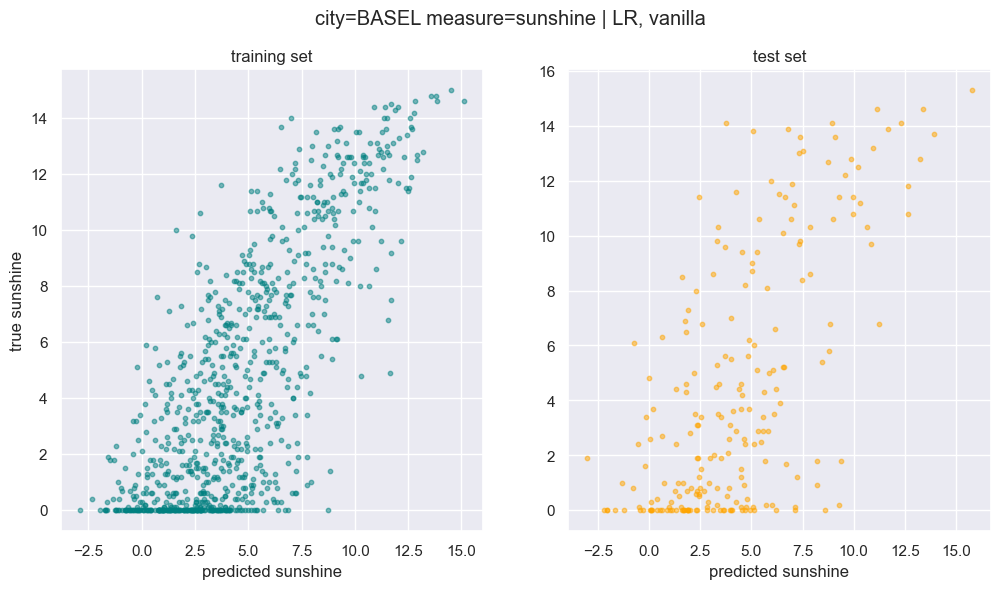

In [133]:
from sklearn.linear_model import LinearRegression
est_name = 'LR'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

estimator = Pipeline([
    ("regression", LinearRegression())
])
estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test)

plot_title = "city={} measure={} | LR, vanilla".format(city4prediction, measure4prediction)
plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_, X_train.columns)

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(3), 4)

## Transformation_and_Scaling
[back to ToC](#Contents)

### Adding transformation for specific columns

In [134]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import Normalizer
def col_transformer(df, measure_columns, all=False):
    log1p_transformer = FunctionTransformer(np.log1p)
    columns4log1p = []
    columns4normalizer1 = []
    columns4normalizer2 = []
    if 'precipitation' in measure_columns:
        columns4log1p += measure_columns['precipitation']
    if 'wind_gust' in measure_columns:
        columns4log1p += measure_columns['wind_gust']
    if 'wind_speed' in measure_columns:
        columns4log1p += measure_columns['wind_speed']
    if 'humidity' in measure_columns:
        columns4log1p += measure_columns['humidity']
        
    #alternative: apply only to most skewed columns:
    if all:
        columns4log1p = find_skewed_columns(df, skew_limit=0.4)
    else:
        columns4log1p = find_skewed_columns(df)
        
    #if 'pressure' in measure_columns:
        #columns4normalizer1 = measure_columns['pressure']
    #if 'temp_max' in measure_columns:
        #columns4normalizer2 = measure_columns['temp_max']
    columnspassthrough = [col for col in df.columns if (col not in columns4log1p and
                                                             col not in columns4normalizer1 and
                                                             col not in columns4normalizer2)]

    #print("* Columns to apply log1p: {}".format(columns4log1p))
    #print("* Columns to apply normalizer1: {}".format(columns4normalizer1))
    #print("* Columns to apply normalizer2: {}".format(columns4normalizer2))
    #print("* Columns untouched: {}".format(columnspassthrough))
    
    #eprint("* #columns to apply log1p: {}".format(len(columns4log1p))) #debug
    
    CT = ColumnTransformer(transformers=[
        ("log1p", log1p_transformer, columns4log1p)#,
        #("norm1", Normalizer(norm='l1'), columns4normalizer1),
        #("norm2", Normalizer(norm='l1'), columns4normalizer2)
    ], remainder='passthrough')
    #to check transformed data:
    #X_logp = CT.fit_transform(X_train)
    #pd.DataFrame(X_logp, columns = columns4log1p + columnspassthrough)[columns4log1p]
    return CT
    

** Coefficient analysis
   Sum of coefficients: 2819.95
   Coefficients set to zero: 0/164 (0.00%)
   Highest (absolute) coefficients:
                          feat        coef
76         LJUBLJANA_temp_mean -826.574400
102        MONTELIMAR_temp_max  551.750343
88         MAASTRICHT_temp_min  320.182772
159     TOURS_global_radiation -215.176891
119      OSLO_global_radiation  202.857758
140              ROMA_temp_max -145.819130
112          MUENCHEN_temp_min  126.320240
134              ROMA_humidity -103.437386
53   HEATHROW_global_radiation   94.208746
152         STOCKHOLM_sunshine  -46.519952


,trainMSE,testMSE,trainR2,testR2
dummy_mean,19.1498,21.0765,0.0000,-0.0014
same_as_today,17.7810,21.5345,0.0715,-0.0232
LR,15.2314,12.0770,0.2009,0.4262
CT_LR,14.8849,11.8948,0.2194,0.4348


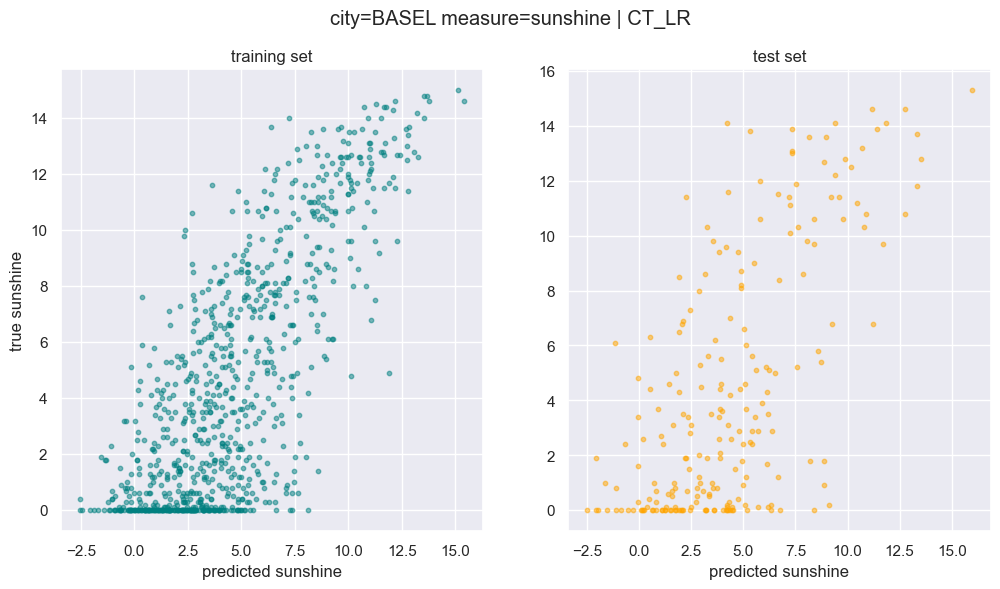

In [85]:
est_name = 'CT_LR'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)
    

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("regression", LinearRegression())
])

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test)

plot_title = "city={} measure={} | CT_LR".format(city4prediction, measure4prediction)
plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_, X_train.columns)

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(4), 4)

### Adding scaling
Note: we use StandardScaler and not Normalizer, because we don't have similar data on the different columns

In [ ]:
from sklearn.preprocessing import StandardScaler

est_name = 'CTSS_LR'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", StandardScaler()),
    ("regression", LinearRegression())
])

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test)

plot_title="city={} measure={} | CTSS_LR: Linear regression, with transformation and scaling".format(city4prediction, measure4prediction)
#plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_, X_train.columns)

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(3), 4)

### Adding polynomial features

** Coefficient analysis
   Sum of coefficients: 211.91
   Coefficients set to zero: 0/13694 (0.00%)
   Highest (absolute) coefficients:
                                               feat      coef
24                            DE_BILT_precipitation -0.146387
1303             BASEL_temp_mean DE_BILT_wind_speed  0.116611
1654               BASEL_temp_max KASSEL_wind_speed  0.114244
3933         DE_BILT_precipitation ROMA_cloud_cover  0.110321
3951  DE_BILT_precipitation STOCKHOLM_precipitation  0.108801
86                              MAASTRICHT_sunshine  0.102222
12                                BUDAPEST_pressure -0.094149
2950      BUDAPEST_temp_max STOCKHOLM_precipitation  0.093869
1451               BASEL_temp_min BUDAPEST_humidity  0.093321
8                                    BASEL_temp_min -0.092617


,trainMSE,testMSE,trainR2,testR2
LR,15.2314,12.0770,0.2009,0.4262
CT_LR,14.8849,11.8948,0.2194,0.4348
CTSS_LR,14.8849,11.8948,0.2194,0.4348
CTSSPF_LR,18.7809,15.8149,0.0218,0.2486


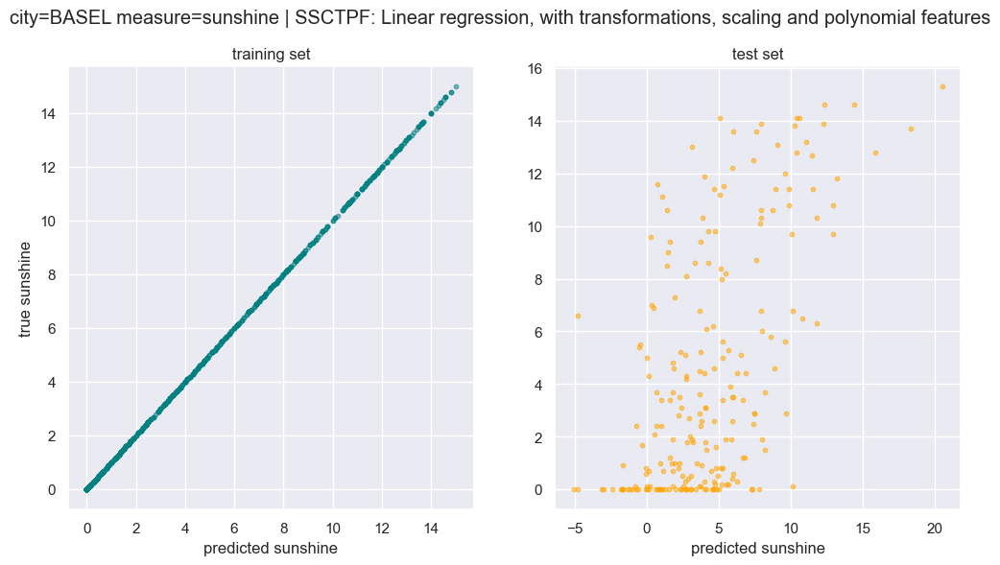

In [87]:
from sklearn.preprocessing import PolynomialFeatures
est_name = 'CTSSPF_LR'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

poly_degree = 2
PF = PolynomialFeatures(degree=poly_degree, include_bias=False)
#to see all the additional columns:
#X_train_pf = PF.fit_transform(X_train)
#pd.DataFrame(X_train_pf, columns = PF.get_feature_names_out())

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", StandardScaler()),
    ("polynomial_features", PF),
    ("regression", LinearRegression())
])

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test)

plot_title="city={} measure={} | SSCTPF: Linear regression, with transformations, scaling and polynomial features".format(city4prediction, measure4prediction)
plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_,
                columns =  estimator.named_steps["polynomial_features"].get_feature_names_out(input_features=X_train.columns))

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(4), 4)

## Regularisation
[back to ToC](#Contents)

### Adding regularisation 1: Lasso

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

est_name = 'Lasso'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

SS = StandardScaler()
PF = PolynomialFeatures(degree=1, include_bias=False)
LA = Lasso(max_iter=10000)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", LA)
])

params = {
    #'regression__alpha': np.geomspace(1e-3, 1e0, num=5)
    'regression__alpha': [0.03]
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads)
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=grid)

plot_title="city={} measure={} | Lasso regression α={:0.2f}".format(
    city4prediction, measure4prediction,
    grid.best_params_['regression__alpha'],
)
#plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_,
#               columns =  estimator.named_steps["polynomial_features"].get_feature_names_out(input_features=X_train.columns))

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(5), 4)

In [ ]:
est_name = 'LassoPF'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)
LA = Lasso(max_iter=10000)
poly_degrees = [2]

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", LA)
])
                      
params = {
    'polynomial_features__degree': poly_degrees,
    #'regression__alpha': np.geomspace(1e-2, 1e0, num=5)
    'regression__alpha': [0.1]
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs = threads)

grid.fit(X_train, y_train)
print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=grid)

plot_title = "city={} measure={} | Lasso regression α={:0.2f}, PF degree={}".format(
    city4prediction, measure4prediction,
    grid.best_params_['regression__alpha'],
    grid.best_params_['polynomial_features__degree']
)
#plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_,
#               columns =  estimator.named_steps["polynomial_features"].get_feature_names_out(input_features=X_train.columns))

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(4), 4)

### Adding regularisation 2: Ridge

In [ ]:
from sklearn.linear_model import Ridge

est_name = 'Ridge'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)
RI = Ridge()

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", RI)
])
alphas = np.geomspace(1e-1, 1e3, num=10) 

poly_degrees = [1]
params = {
    'polynomial_features__degree': poly_degrees,
    'regression__alpha': alphas
}

grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs = threads)

grid.fit(X_train, y_train)
print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=grid)

plot_title = "city={} measure={} | Ridge regression α={:0.2f}, PF degree={}".format(
    city4prediction, measure4prediction,
    grid.best_params_['regression__alpha'],
    grid.best_params_['polynomial_features__degree']
)
#plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_,
#               columns =  estimator.named_steps["polynomial_features"].get_feature_names_out(input_features=X_train.columns))

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(3), 4)

In [ ]:
est_name = 'RidgePF'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)
RI = Ridge()

estimator = Pipeline([
    ("transformer", col_transformer(X_train, (measure_columns))),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", RI)
])
#alphas = np.geomspace(1e1, 1e6, num=10) 
alphas = [8294]

poly_degrees = [2]
params = {
    'polynomial_features__degree': poly_degrees,
    'regression__alpha': alphas
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=1, n_jobs=threads)

grid.fit(X_train, y_train)
print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=grid)

plot_title = "city={} measure={} | Ridge regression α={:0.2f}, PF degree={}".format(
    city4prediction, measure4prediction,
    grid.best_params_['regression__alpha'],
    grid.best_params_['polynomial_features__degree']
)

#plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_,
#               columns =  estimator.named_steps["polynomial_features"].get_feature_names_out(input_features=X_train.columns))

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(4), 4)

## ElasticNet
[back to ToC](#Contents)

Fitting 2 folds for each of 1 candidates, totalling 2 fits
0.2979898058930294 {'polynomial_features__degree': 2, 'regression__alpha': 0.1, 'regression__l1_ratio': 0.88}
** Coefficient analysis
   Sum of coefficients: 19.69
   Coefficients set to zero: 13392/13694 (97.79%)
   Highest (absolute) coefficients:
                                         feat      coef
86                        MAASTRICHT_sunshine  0.741264
160                       TOURS_precipitation  0.575821
113                         MUENCHEN_temp_max  0.372775
11                          BUDAPEST_humidity -0.368631
12                          BUDAPEST_pressure -0.333280
55                          HEATHROW_sunshine  0.328562
24                      DE_BILT_precipitation -0.269457
3933   DE_BILT_precipitation ROMA_cloud_cover  0.249408
14                     BUDAPEST_precipitation -0.240264
13369                         ROMA_temp_min^2 -0.227393


,trainMSE,testMSE,trainR2,testR2
Lasso,10.9758,10.8874,0.4259,0.4827
LassoPF,13.0622,10.9146,0.3182,0.4814
Ridge,10.7589,11.0217,0.4373,0.4763
RidgePF,12.9207,11.9385,0.3255,0.4328
Elastic,13.4460,11.0428,0.2980,0.4753


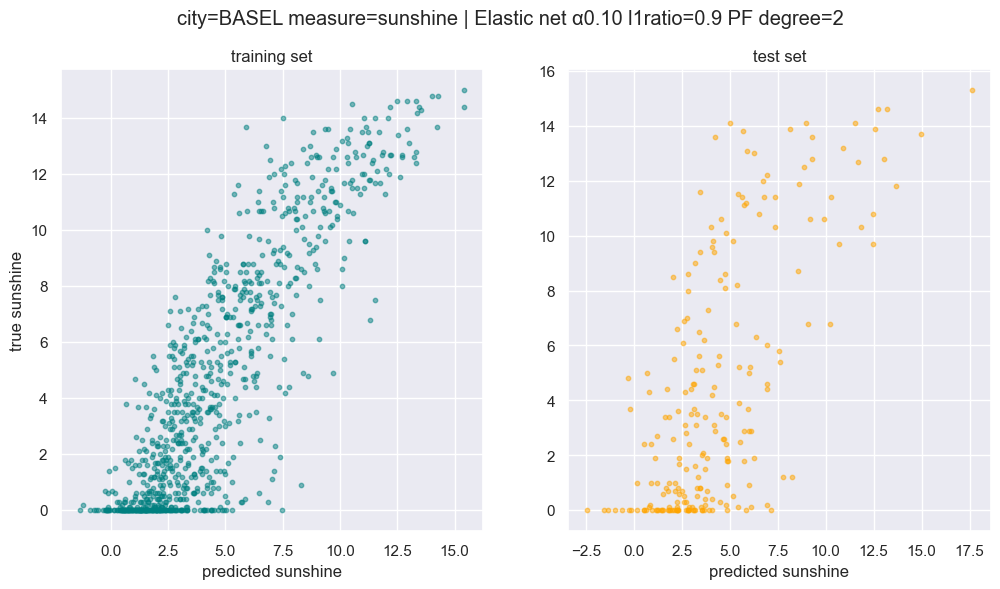

In [92]:
from sklearn.linear_model import ElasticNet

est_name = 'Elastic'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

SS = StandardScaler()
EL = ElasticNet(alpha=1, l1_ratio=0.1)
PF = PolynomialFeatures(include_bias=False)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", EL)
])
#l1_ratios = np.linspace(0.1, 0.9, num=5)
#alphas = np.geomspace(1e-2, 1e2, num=5) 
l1_ratios = [0.88]
alphas = [0.1]

#poly_degrees = [1, 2]
poly_degrees = [2]
params = {
    'polynomial_features__degree': poly_degrees,
    'regression__alpha': alphas,
    'regression__l1_ratio': l1_ratios
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=1, n_jobs=threads)

grid.fit(X_train, y_train)
print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=grid)

plot_title = "city={} measure={} | Elastic net α{:0.2f} l1ratio={:0.1f} PF degree={}".format(
    city4prediction, measure4prediction,
    grid.best_params_['regression__alpha'],
    grid.best_params_['regression__l1_ratio'],
    grid.best_params_['polynomial_features__degree']
)

plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_,
                columns =  estimator.named_steps["polynomial_features"].get_feature_names_out(input_features=X_train.columns))

errors_df = pd.concat([errors_df, error_df])
round(errors_df.tail(5), 4)

# Classification
[back to ToC](#Contents)
## Supervised Machine Learning: Classification

Please refer to the <a href='03.supMLclass_courseproject_report_GiuseppeInsana.pdf'>project report</a>

## Objective:
Main objective of the analysis that specifies whether your model will be focused on prediction or interpretation and the benefits that your analysis provides to the business or stakeholders of this data.

Brief description of the data set you chose, a summary of its attributes, and an outline of what you are trying to accomplish with this analysis.

Brief summary of data exploration and actions taken for data cleaning and feature engineering.

Summary of training at least three different classifier models, preferably of different nature in explainability and predictability. For example, you can start with a simple logistic regression as a baseline, adding other models or ensemble models. Preferably, all your models use the same training and test splits, or the same cross-validation method.

A paragraph explaining which of your classifier models you recommend as a final model that best fits your needs in terms of accuracy and explainability.

Summary Key Findings and Insights, which walks your reader through the main drivers of your model and insights from your data derived from your classifier model.

Suggestions for next steps in analyzing this data, which may include suggesting revisiting this model after adding specific data features that may help you achieve a better explanation or a better prediction.

In [93]:
city4prediction = "BASEL"
measure4prediction = "sunshine"
col4prediction = city4prediction + "_" + measure4prediction
reduced_data = True
includeMonth = True
X_data, y_data, X_data_ori, untilindex = initialize_data(cleandata, city4prediction, measure4prediction,
                                                         reduced_data=reduced_data, includeMonth=includeMonth)

*** We aim to predict tomorrow's 'sunshine' measure in 'BASEL' based on today's weather data for all locations and month information
Data size: X=(1096, 164) Y=(1096,)
   MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure  \
0      1                  8            0.89          1.0286   
1      1                  8            0.87          1.0318   
2      1                  5            0.81          1.0314   
3      1                  7            0.79          1.0262   
4      1                  5            0.90          1.0246   

   BASEL_global_radiation  BASEL_precipitation  BASEL_sunshine  
0                    0.20                 0.03             0.0  
1                    0.25                 0.00             0.0  
2                    0.50                 0.00             3.7  
3                    0.63                 0.35             6.9  
4                    0.51                 0.07             3.7  
      MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure 

## Create class(es) for classification

In [94]:
#if multiclass by bins:
#col4prediction_labels = ["no rain", "some rain", "heavy rain"]
#col4prediction_bins = [-1, 0.1, 0.5, 100]
#pd.cut(X_data[col4prediction], bins = bins, labels=col4prediction_labels).value_counts(normalize=True)

#if binary classification:
if measure4prediction == "precipitation":
    col4prediction_labels = ["Dry", "Rain"] #for precipitation
elif measure4prediction == "sunshine":
    col4prediction_labels = ["Cloudy", "Sunny"] #for sunshine
else:
    eprint("PLEASE SETUP LABELS for '{}''".format(measure4prediction))
print("We will classify {} as: {}".format(col4prediction, col4prediction_labels))

We will classify BASEL_sunshine as: ['Cloudy', 'Sunny']


2542

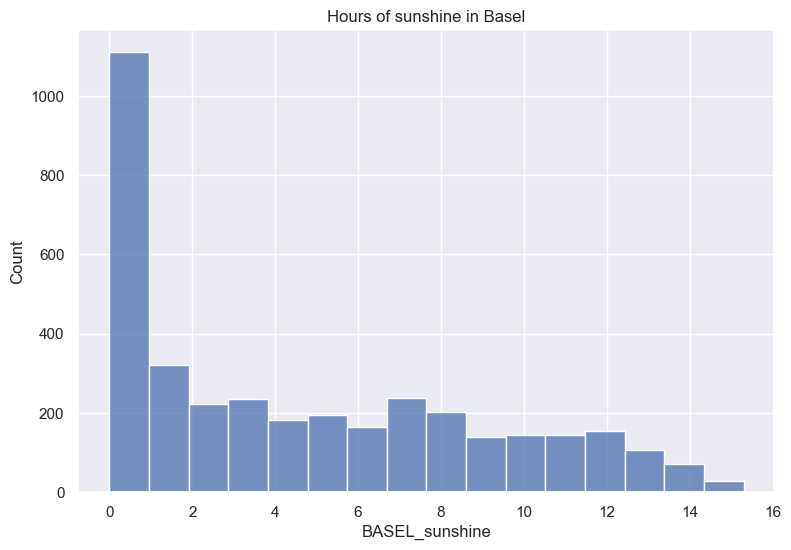

In [95]:
#for sunshine: peak of 0 sunshine hours, completely overcast
#for precipitation: peak of 0 mm, dry day
sns.histplot(data=cleandata, x=col4prediction).set_title("Hours of sunshine in Basel")
(cleandata[col4prediction] >= 1).sum()

In [96]:
#In winter months sunshine ranges from 0 to about 6 (depending on year, some have max of december as low as 4)
traces, layout=cmplot(cleandata, orientation="v", xcol='MONTH', ycol=col4prediction, showpoints=False, side='both', spanmode="hard", ycolorgroups=False)
layout.showlegend=False
layout.margin={'b': 40, 'l': 80, 'r': 10, 't': 40}
fig = go.Figure(traces, layout)
#fig.show()
print('uncomment previous line to show interactive plot (like following static image)')

uncomment previous line to show interactive plot (like following static image)


/Users/insana/miniconda3/envs/tensorflow_env/lib/python3.10/site-packages/cmplot.py:340: FutureWarning:

In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.



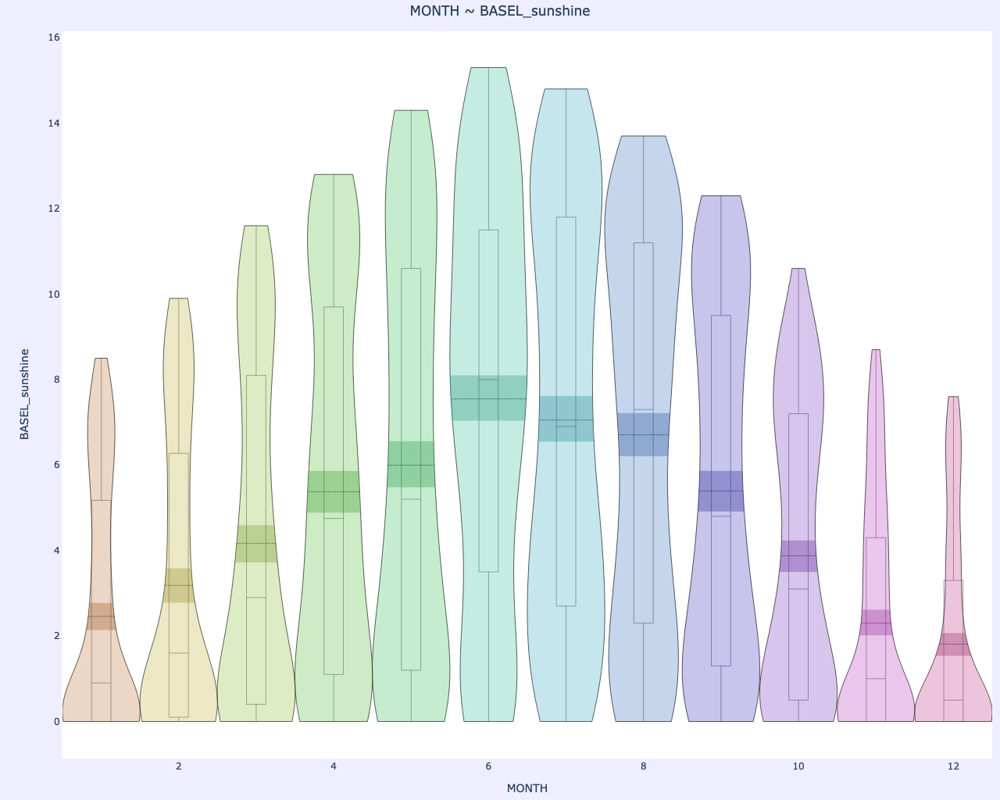

### Choosing measure threshold and setting label

In [97]:
#we set the threshold to 1h sunshine
if measure4prediction == "sunshine":
    col4prediction_threshold = 1 #for sunshine
elif measure4prediction == "precipitation":
    col4prediction_threshold = 0.1 #for precipitation (i.e ≥ 1.0 mm) #see https://en.wikipedia.org/wiki/Basel#Geography_and_climate
else:
    eprint("PLEASE DECIDE ON THRESHOLD for '{}''".format(measure4prediction))
print("We will classify based on the threshold {} >= {}".format(col4prediction, col4prediction_threshold))

We will classify based on the threshold BASEL_sunshine >= 1


In [98]:
#the choice of 1h of sunshine would be quite balanced for winter months and imbalanced for the rest of the year
#but at least it would make sense even for winter months
#otherwise if we choose a higher threshold, all winter months would have extremely unbalance and almost no positive class
print("Class counts for whole year:")
display((cleandata[col4prediction] >= col4prediction_threshold).value_counts())
print("Class counts for winter months:")
display((cleandata[cleandata['MONTH'].isin([1,2,11,12])][col4prediction] >= col4prediction_threshold).value_counts())

Class counts for whole year:


True     2542
False    1111
Name: BASEL_sunshine, dtype: int64

Class counts for winter months:


True     602
False    601
Name: BASEL_sunshine, dtype: int64

In [99]:
#setting the label, transforming from numerical to categorical
y_data_ori = y_data
y_data = (y_data >= col4prediction_threshold) #for binary class

In [100]:
print(X_data.shape, y_data.shape)
y_data.value_counts(normalize=True)

(1096, 164) (1096,)


True     0.67792
False    0.32208
Name: BASEL_sunshine, dtype: float64

## StratifiedCrossValidation
[back to ToC](#Contents)

### Creating Correct Test Train split (double level of stratification)

In [101]:
#we set aside 20% of the data to test the accuracy of our models
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=88, stratify=y_data)

In [102]:
#confirm stratification in the split
print("Train data class proportion:\n",y_train.value_counts(normalize=True))
print()
print("Test data class proportion:\n",y_test.value_counts(normalize=True))

Train data class proportion:
 True     0.678082
False    0.321918
Name: BASEL_sunshine, dtype: float64

Test data class proportion:
 True     0.677273
False    0.322727
Name: BASEL_sunshine, dtype: float64


In [103]:
#but if we stratify only based on y_data, then the month proportion may get skewed for test data
if includeMonth:
    print(X_test['MONTH'].value_counts(normalize=True))
    print(X_train['MONTH'].value_counts(normalize=True))

4     0.095455
9     0.086364
2     0.086364
8     0.086364
12    0.086364
3     0.086364
6     0.086364
10    0.081818
1     0.081818
11    0.081818
5     0.072727
7     0.068182
Name: MONTH, dtype: float64
7     0.089041
5     0.087900
1     0.085616
10    0.085616
12    0.084475
3     0.084475
8     0.084475
11    0.082192
6     0.081050
9     0.081050
4     0.078767
2     0.075342
Name: MONTH, dtype: float64


In [104]:
#to fix that, we do a stratification on two factors: the class we want to predict and also the month
if includeMonth:
    y_data = X_data_ori.loc[1:(untilindex+1),[col4prediction, 'MONTH']]
    #for binary class:
    y_data[col4prediction] = (y_data[col4prediction] >= col4prediction_threshold)
    #for multiple binned classes:
    #y_data[col4prediction] = pd.cut(y_data[col4prediction], bins = bins, labels=col4prediction_labels)
    X_train, X_test, y_train, y_test = train_test_split(X_data, y_data,
                                                        test_size=0.2, random_state=80, stratify=y_data)
    #Now the months are not as unbalanced as before (a part from the fact that Feb has 28 days, some have 30 and other 31)
    print(X_test['MONTH'].value_counts(normalize=True))
    print(X_train['MONTH'].value_counts(normalize=True))

10    0.090909
7     0.086364
1     0.086364
5     0.086364
12    0.086364
3     0.086364
2     0.081818
6     0.081818
8     0.081818
4     0.077273
9     0.077273
11    0.077273
Name: MONTH, dtype: float64
8     0.085616
3     0.084475
5     0.084475
12    0.084475
7     0.084475
1     0.084475
9     0.083333
4     0.083333
10    0.083333
11    0.083333
6     0.082192
2     0.076484
Name: MONTH, dtype: float64


In [105]:
#And the prediction class has kept the original proportion
print(y_train[col4prediction].value_counts(normalize=True))
print(y_test[col4prediction].value_counts(normalize=True))

True     0.676941
False    0.323059
Name: BASEL_sunshine, dtype: float64
True     0.681818
False    0.318182
Name: BASEL_sunshine, dtype: float64


In [106]:
#now then only keep the col4prediction, dropping the MONTH (which was used only for the double level stratified)
y_test = y_test[col4prediction]
y_train = y_train[col4prediction]

<Axes: xlabel='MONTH', ylabel='BASEL_sunshine'>

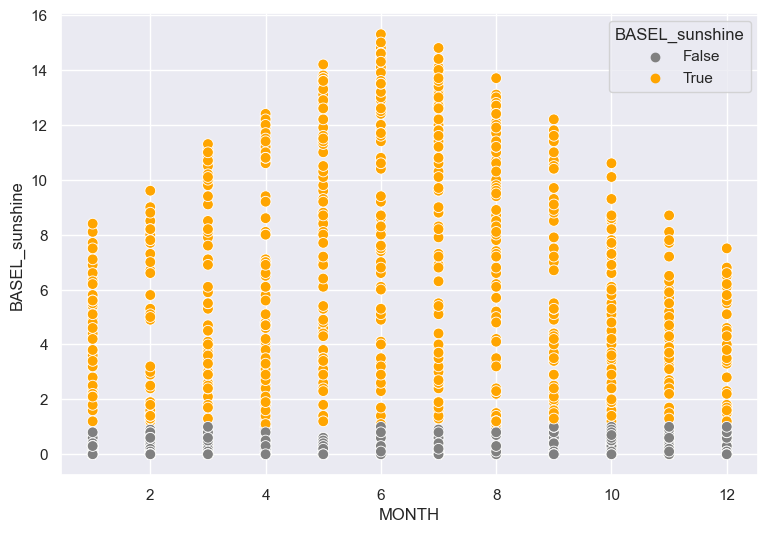

In [107]:
#for binary class:
sns.scatterplot(data=X_data, x='MONTH', y=col4prediction, hue=(X_data[col4prediction] > col4prediction_threshold), alpha=1, palette=["gray", "orange"], s=60)
#for binned multi class:
#sns.scatterplot(data=X_data, x='MONTH', y=col4prediction, hue=pd.cut(X_data[col4prediction], bins = bins, labels=col4prediction_labels), alpha=1, palette=["orange", "cyan", "blue"], s=60)

[Text(0.5, 1.0, 'Test data')]

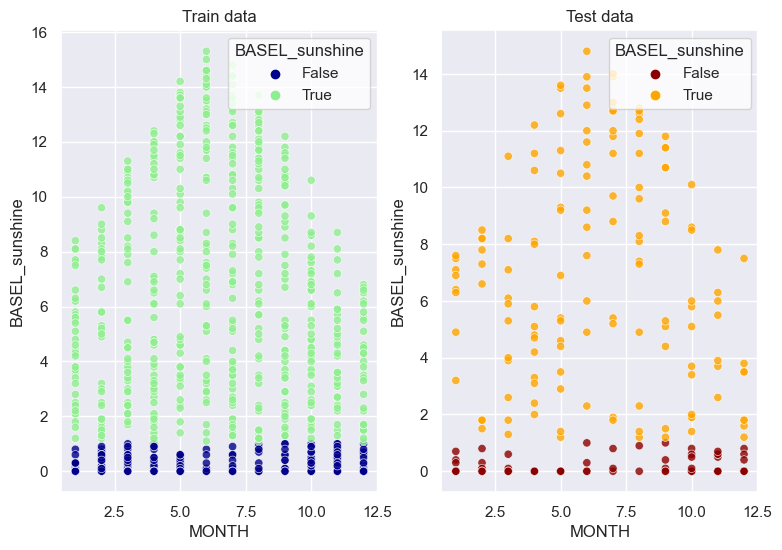

In [108]:
#visually confirm appropriate split
fig, axes = plt.subplots(1, 2)

sns.set(rc={"figure.figsize":(12, 6)}) #width=8, height=4
sns.set_theme(context='notebook', style='white', font_scale=1)

ax = axes[0]
sns.scatterplot(ax=ax, data=X_train, x='MONTH', y=col4prediction, hue=X_train[col4prediction] > col4prediction_threshold, alpha=0.8, palette=["darkblue", "#90ee90"])
ax.set(title="Train data")

ax = axes[1]
sns.scatterplot(ax=ax,data=X_test, x='MONTH', y=col4prediction, hue=X_test[col4prediction] > col4prediction_threshold, alpha=0.8, palette=["darkred", "orange"])
ax.set(title="Test data")

In [109]:
if reduced_data:
    folds = 2 #for KFold
else:
    #folds = 5
    folds = 3 #note, for course projects used 5
from sklearn.model_selection import StratifiedKFold
KF = StratifiedKFold(shuffle=True, random_state=42, n_splits=folds)

## Metrics functions

In [110]:
#reset metrics df
metrics_df = pd.DataFrame()

from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix

def print_metrics(y_test, y_pred, name="estimator"):

    score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, y_pred),
                         'precision': precision_score(y_test, y_pred),
                         'recall': recall_score(y_test, y_pred),
                         'f1': f1_score(y_test, y_pred),
                         'auc': roc_auc_score(y_test, y_pred)},
                         index=pd.Index([name]))
    print("Report of TestData: \n",classification_report(y_test, y_pred))
    return score_df

def score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=False, name="estimator"):
    if fitted:
        y_test_pred = fitted.predict(X_test)
        y_train_pred = fitted.predict(X_train)
    if not fitted:
        estimator.fit(X_train, y_train)
        y_train_pred = estimator.predict(X_train)
        y_test_pred = estimator.predict(X_test)
    print("Report of TrainData: \n",classification_report(y_train, y_train_pred))
    estimator.columns = X_train.columns
    estimator.y_train = y_train
    estimator.y_test = y_test
    estimator.y_train_pred = y_train_pred
    estimator.y_test_pred = y_test_pred
    score_df = print_metrics(y_test, y_test_pred, name=name)
    return estimator, score_df

def display_confusion_matrix(cm, ax, title='', labels=[]):
    
    #tn, fp, fn, tp = cm.ravel()
    #title = "{} TP: {}, FP: {}, TN: {}, FN: {}".format(title, tp, fp, tn, fn)
    sns.heatmap(cm/cm.sum(), ax=ax, annot=True, fmt='.1%', annot_kws={"size": 30, "weight": "bold"})
    ax.set_title(title, fontsize=20)
    ax.set_xticklabels(labels, fontsize=20);
    ax.set_yticklabels(labels, fontsize=20);
    return ax
    
def plot_test(y_test, y_test_pred, title="", labels=col4prediction_labels):
    cm_test = confusion_matrix(y_test, y_test_pred)
    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    fig.suptitle(title, fontsize=25)
    display_confusion_matrix(cm_test, ax, title="", labels=labels)
    ax.set_xlabel("Prediction", fontsize=20)
    ax.set_ylabel("Ground truth", fontsize=20)
    return ax

def plot_train_test(estimator, title="", labels=col4prediction_labels, coef = [], columns = [], feat_importance=False):
    cm_train = confusion_matrix(estimator.y_train, estimator.y_train_pred)
    cm_test = confusion_matrix(estimator.y_test, estimator.y_test_pred)
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(title, fontsize=25)
    axes[0] = display_confusion_matrix(cm_train, axes[0], title="training set", labels=labels)
    axes[0].set_xlabel("Prediction", fontsize=20)
    axes[0].set_ylabel("Ground truth", fontsize=20)

    axes[1] = display_confusion_matrix(cm_test, axes[1], title="test set", labels=labels)
    axes[1].set_xlabel("Prediction", fontsize=20)
    
    # Checking feature importance
    if len(coef):
        if len(coef.shape) > 1:
            coef = coef[0]
        print('** Coefficient analysis')
        print('   Sum of coefficients: {:0.2f}'.format(abs(coef).sum()))
        zero_coef = (coef==0).sum()
        tot_coef = len(coef)
        print('   Coefficients set to zero: {}/{} ({:0.2f}%)'.format(zero_coef, tot_coef, 100 * zero_coef / tot_coef))
        print("   Highest (absolute) coefficients:")
        
        if len(columns) == 0:
            columns = estimator.feature_names_in_
        pandas_version = str(pd.__version__)
        if pandas_version.find("0.25") != -1: #back compatible with old pandas
            df_importances = pd.DataFrame(zip(columns, abs(coef), coef))
            df_importances.columns=['feat', '(abs_coef)', 'coef']
            print(df_importances.sort_values(by='(abs_coef)', ascending=False).head(10))
            all_nz_coefs = df_importances.query('coef != 0').sort_values(by='(abs_coef)', ascending=False).coef.tolist()
            all_nz_cols = df_importances.query('coef != 0').sort_values(by='(abs_coef)', ascending=False).feat.tolist()
        else:
            df_importances = pd.DataFrame(zip(columns, coef))
            df_importances.columns=['feat','coef']
            print(df_importances.sort_values(by='coef', ascending=False, key=abs).head(10))
            all_nz_coefs = df_importances.query('coef != 0').sort_values(by='coef', ascending=False, key=abs).coef.tolist()
            all_nz_cols = df_importances.query('coef != 0').sort_values(by='coef', ascending=False, key=abs).feat.tolist()
        if feat_importance: #for full printout of feature importance
            print(' full feature importance list:')
            for nz_coef,nz_col in zip(all_nz_coefs, all_nz_cols):
                print('{}\t{}'.format(nz_coef, nz_col))

## Baseline models

Report of TestData: 
               precision    recall  f1-score   support

       False       0.25      0.20      0.22        70
        True       0.66      0.71      0.68       150

    accuracy                           0.55       220
   macro avg       0.45      0.46      0.45       220
weighted avg       0.53      0.55      0.54       220



,accuracy,precision,recall,f1,auc
Dummy,0.55,0.6564,0.7133,0.6837,0.4567


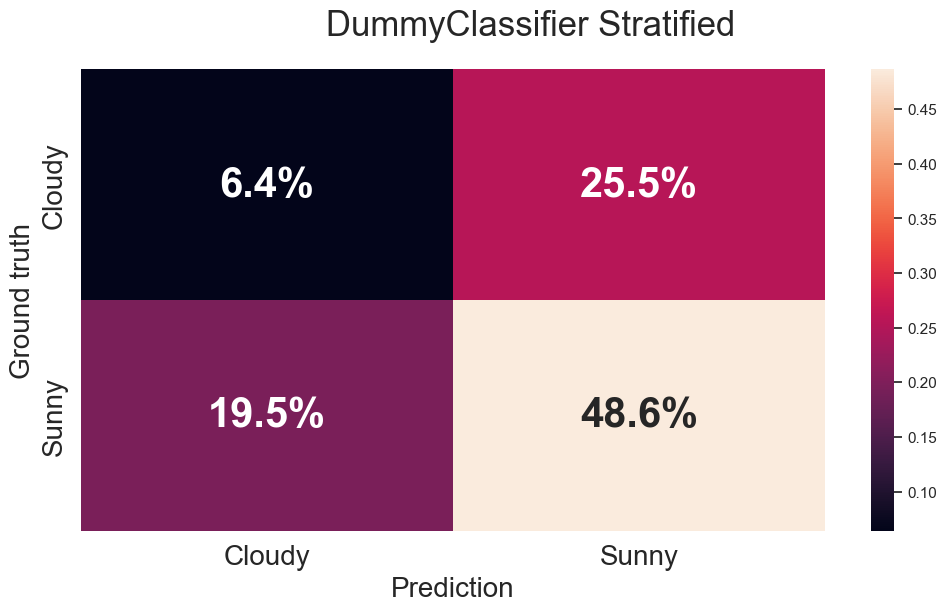

In [111]:
from sklearn.dummy import DummyClassifier
dummy_mean = DummyClassifier(strategy="stratified")
dummy_mean.fit(X_train, y_train)
y_dummy_train_pred = dummy_mean.predict(X_train)
y_dummy_test_pred = dummy_mean.predict(X_test)

est_title = "DummyClassifier Stratified"
est_name = "Dummy"
score_df = print_metrics(y_test, y_dummy_test_pred, name=est_name)
plot_test(y_test, y_dummy_test_pred, title=est_title)
if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df,4)

Report of TestData: 
               precision    recall  f1-score   support

       False       0.57      0.61      0.59        70
        True       0.81      0.79      0.80       150

    accuracy                           0.73       220
   macro avg       0.69      0.70      0.70       220
weighted avg       0.74      0.73      0.73       220



,accuracy,precision,recall,f1,auc
Dummy,0.5500,0.6564,0.7133,0.6837,0.4567
same_as_today,0.7318,0.8138,0.7867,0.8000,0.7005


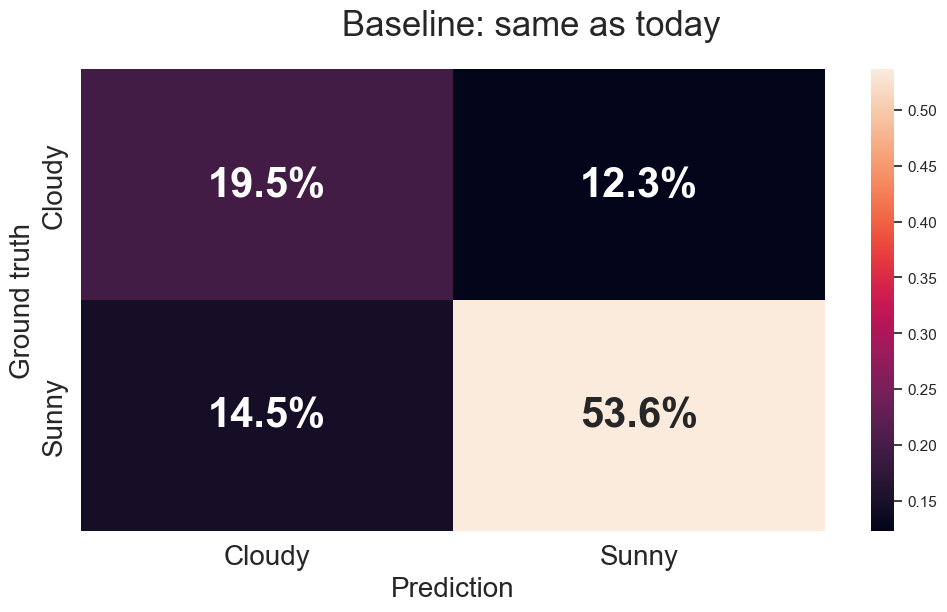

In [112]:
#as better baseline we can take today's weather in the city
y_baseline_train_pred = X_train[col4prediction] >= col4prediction_threshold #'same as today'
y_baseline_test_pred = X_test[col4prediction] >= col4prediction_threshold

est_title = "Baseline: same as today"
est_name = "same_as_today"
score_df = print_metrics(y_test, y_baseline_test_pred, name=est_name)
plot_test(y_test, y_baseline_test_pred, title=est_title)
if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df,4)

## ClassificationPipelines
[back to ToC](#Contents)

Report of TrainData: 
               precision    recall  f1-score   support

       False       0.74      0.64      0.68       283
        True       0.84      0.89      0.86       593

    accuracy                           0.81       876
   macro avg       0.79      0.76      0.77       876
weighted avg       0.81      0.81      0.81       876

Report of TestData: 
               precision    recall  f1-score   support

       False       0.57      0.50      0.53        70
        True       0.78      0.83      0.80       150

    accuracy                           0.72       220
   macro avg       0.68      0.66      0.67       220
weighted avg       0.71      0.72      0.72       220

** Coefficient analysis
   Sum of coefficients: 25.53
   Coefficients set to zero: 0/164 (0.00%)
   Highest (absolute) coefficients:
                       feat      coef
159  TOURS_global_radiation  1.005319
136   ROMA_global_radiation -0.827013
11        BUDAPEST_humidity -0.760047
126      PERPIGN

,accuracy,precision,recall,f1,auc
Dummy,0.5500,0.6564,0.7133,0.6837,0.4567
same_as_today,0.7318,0.8138,0.7867,0.8000,0.7005
LR,0.7227,0.7799,0.8267,0.8026,0.6633


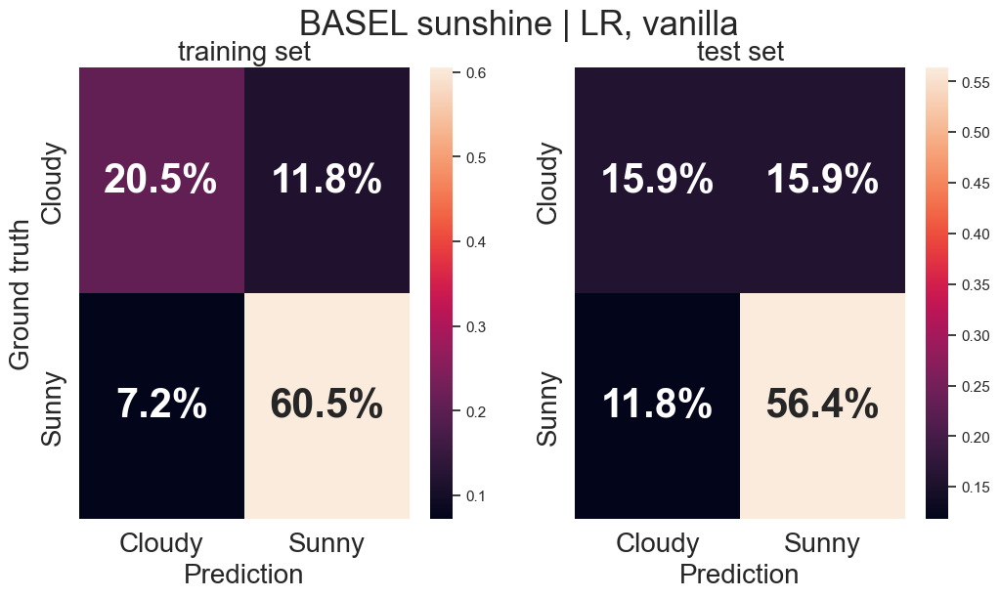

In [113]:
from sklearn.linear_model import LogisticRegression
est_name = 'LR'
est_parameters = ", vanilla"

estimator = Pipeline([
    ("regression", LogisticRegression(solver='liblinear'))
])
estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name)

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)

plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["regression"].coef_, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df, 4)

### Adding scaling

In [ ]:
est_name = 'SS_LR'
est_parameters = ''

estimator = Pipeline([
    ("scaler", StandardScaler()),
    ("regression", LogisticRegression(solver="liblinear"))
])
estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name)

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
#plot_train_test(estimator, title=plot_title,  columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df, 4)

### Adding column transformations

In [ ]:
est_name = 'CTSS_LR'
est_parameters = ''

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", StandardScaler()),
    ("regression", LogisticRegression(solver="liblinear"))
])
estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name)

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
#plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["regression"].coef_, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df, 4)

### Adding polynomial features

Report of TrainData: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00       283
        True       1.00      1.00      1.00       593

    accuracy                           1.00       876
   macro avg       1.00      1.00      1.00       876
weighted avg       1.00      1.00      1.00       876

Report of TestData: 
               precision    recall  f1-score   support

       False       0.57      0.49      0.52        70
        True       0.78      0.83      0.80       150

    accuracy                           0.72       220
   macro avg       0.67      0.66      0.66       220
weighted avg       0.71      0.72      0.71       220

** Coefficient analysis
   Sum of coefficients: 274.96
   Coefficients set to zero: 0/13694 (0.00%)
   Highest (absolute) coefficients:
                            feat      coef
26             DE_BILT_temp_mean -0.115490
162               TOURS_temp_min  0.108467
160          TOURS_precipitation  0.

,accuracy,precision,recall,f1,auc
LR,0.7227,0.7799,0.8267,0.8026,0.6633
SS_LR,0.7273,0.7812,0.8333,0.8065,0.6667
CTSS_LR,0.7273,0.7778,0.8400,0.8077,0.6629
CTSSPF_LR,0.7182,0.7750,0.8267,0.8000,0.6562


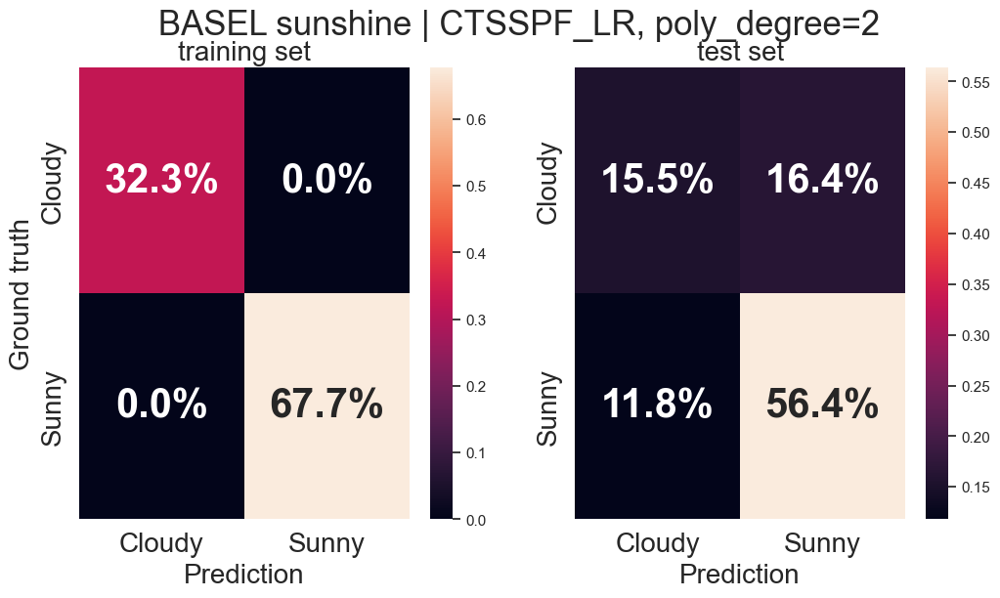

In [116]:
est_name = 'CTSSPF_LR'
est_parameters = ', poly_degree=2'

poly_degree = 2
PF = PolynomialFeatures(degree=poly_degree, include_bias=False)
#to see all the additional columns:
#X_train_pf = PF.fit_transform(X_train)
#pd.DataFrame(X_train_pf, columns = PF.get_feature_names_out())

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", StandardScaler()),
    ("polynomial_features", PF),
    ("regression", LogisticRegression(solver="liblinear"))
])
estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name)

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["regression"].coef_, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

### Adding regularisation L1 (Lasso)

In [ ]:
est_name = 'LRL1'

SS = StandardScaler()
PF = PolynomialFeatures(degree=1, include_bias=False)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("regression", LogisticRegression(solver="liblinear", max_iter=10000, penalty='l1'))
])

params = {
    #"regression__C": np.geomspace(0.01,100, num=9)
    "regression__C": [0.03]
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads, scoring="f1")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

est_parameters = ", α={:0.2f}".format(grid.best_params_['regression__C'])

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
#plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["regression"].coef_, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

### Adding regularisation L2 (Ridge)

In [ ]:
est_name = 'LRL2'

SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", LogisticRegression(solver="liblinear", max_iter=10000, penalty='l2'))
])

poly_degrees = [1]
params = {
    'polynomial_features__degree': poly_degrees,
    "regression__C": np.geomspace(0.01,3, num=12)
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads, scoring="f1")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

est_parameters = ", α={:0.2f}".format(grid.best_params_['regression__C'])

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
#plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["regression"].coef_, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

In [ ]:
est_name = 'LRelastic'

SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ("regression", LogisticRegression(solver="saga", max_iter=10000, penalty='elasticnet'))
])

poly_degrees = [1]
params = {
    'polynomial_features__degree': poly_degrees,
    #"regression__C": np.geomspace(0.001,3, num=5),
    "regression__C": [0.007],
    #"regression__l1_ratio": np.linspace(0.1, 0.9, num=5)
    "regression__l1_ratio": [0.3]
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads, scoring="f1")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

est_parameters = ", L1ratio={:0.1f} C={:0.2f}".format(grid.best_params_['regression__l1_ratio'], grid.best_params_['regression__C'])

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
#plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["regression"].coef_, columns=X_train.columns, feat_importance=True)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

## SVM
[back to ToC](#Contents)

### SVM, linear

Fitting 2 folds for each of 1 candidates, totalling 2 fits
0.7509908086685217 {}
Report of TrainData: 
               precision    recall  f1-score   support

       False       0.75      0.66      0.70       283
        True       0.85      0.90      0.87       593

    accuracy                           0.82       876
   macro avg       0.80      0.78      0.79       876
weighted avg       0.82      0.82      0.82       876

Report of TestData: 
               precision    recall  f1-score   support

       False       0.52      0.49      0.50        70
        True       0.77      0.79      0.78       150

    accuracy                           0.69       220
   macro avg       0.64      0.64      0.64       220
weighted avg       0.69      0.69      0.69       220

** Coefficient analysis
   Sum of coefficients: 27.82
   Coefficients set to zero: 0/164 (0.00%)
   Highest (absolute) coefficients:
                        feat      coef
51         HEATHROW_humidity  0.957583
71       

,accuracy,precision,recall,f1,auc
LRL1,0.7455,0.7701,0.8933,0.8272,0.6610
LRL2,0.7500,0.8065,0.8333,0.8197,0.7024
LRelastic,0.7273,0.7206,0.9800,0.8305,0.5829
SVC,0.6909,0.7662,0.7867,0.7763,0.6362


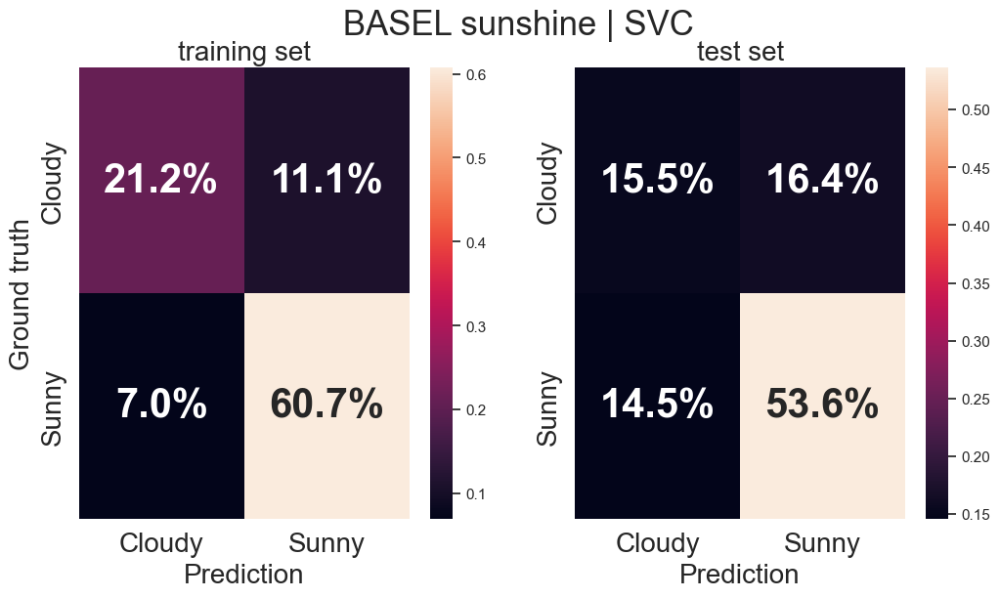

In [120]:
from sklearn.svm import LinearSVC

est_name = 'SVC'

LSVC = LinearSVC(max_iter=100000)
SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS), #note that for SVM scaling is critical
    #("polynomial_features", PF),
    ("svc", LSVC)
])

#poly_degrees = [1]
params = {
    #'polynomial_features__degree': poly_degrees,
    #"regression__l1_ratio": np.linspace(0.1, 0.9, num=5)
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads, scoring="f1")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

#est_parameters = ", α={:0.2f}".format(grid.best_params_['regression__C'])
est_parameters = ""

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
plot_train_test(estimator, title=plot_title, coef=estimator.named_steps["svc"].coef_, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

### SVC, kernels

Fitting 2 folds for each of 2 candidates, totalling 4 fits
0.8096682178391323 {'svc__C': 1.28, 'svc__gamma': 'scale'}
Report of TrainData: 
               precision    recall  f1-score   support

       False       0.87      0.66      0.75       283
        True       0.85      0.95      0.90       593

    accuracy                           0.86       876
   macro avg       0.86      0.81      0.82       876
weighted avg       0.86      0.86      0.85       876

Report of TestData: 
               precision    recall  f1-score   support

       False       0.67      0.53      0.59        70
        True       0.80      0.88      0.84       150

    accuracy                           0.77       220
   macro avg       0.74      0.70      0.72       220
weighted avg       0.76      0.77      0.76       220



,accuracy,precision,recall,f1,auc
LRL2,0.7500,0.8065,0.8333,0.8197,0.7024
LRelastic,0.7273,0.7206,0.9800,0.8305,0.5829
SVC,0.6909,0.7662,0.7867,0.7763,0.6362
CTSVCrbf,0.7682,0.8000,0.8800,0.8381,0.7043


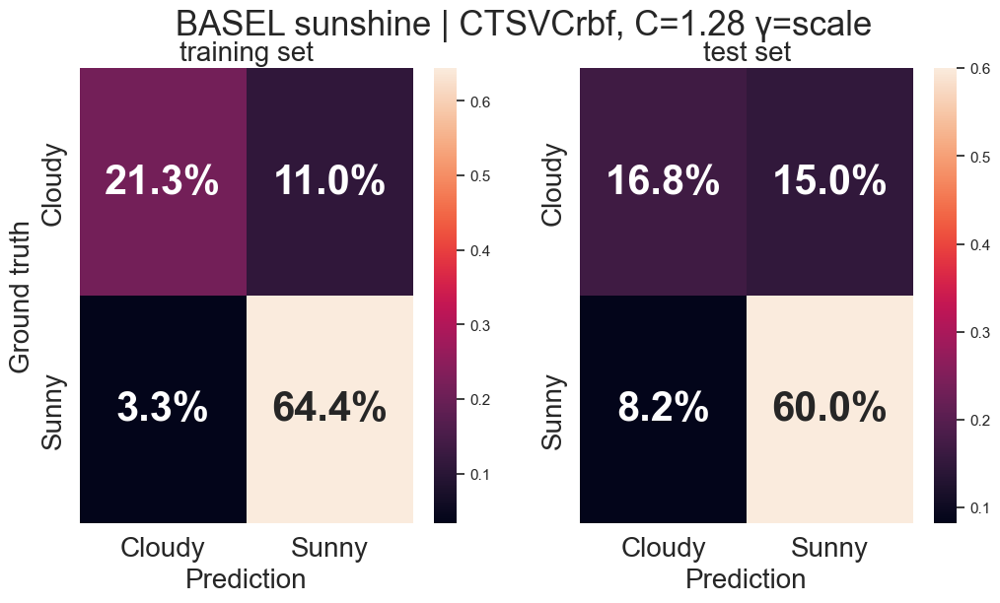

In [121]:
from sklearn.svm import SVC

est_name = 'CTSVCrbf'

SVC = SVC(max_iter=100000, kernel='rbf')
SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS), #note that for SVM scaling is critical
    #("polynomial_features", PF),
    ("svc", SVC)
])

#poly_degrees = [2]
params = {
    #'polynomial_features__degree': poly_degrees,
     #"svc__C": np.geomspace(1, 10, num=5),
    "svc__C": [1.28],
    "svc__gamma": ["scale", "auto"]
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads, scoring="f1")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

est_parameters = ", C={:0.2f} γ={}".format(grid.best_params_['svc__C'], grid.best_params_['svc__gamma'])

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
plot_train_test(estimator, title=plot_title, columns=X_train.columns)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

## DecisionTrees
[back to ToC](#Contents)

Fitting 2 folds for each of 4 candidates, totalling 8 fits
[CV 1/2] END dt__max_depth=4, dt__max_features=31;, score=0.795 total time=   0.0s
[CV 2/2] END dt__max_depth=4, dt__max_features=31;, score=0.766 total time=   0.0s
[CV 1/2] END dt__max_depth=4, dt__max_features=32;, score=0.780 total time=   0.0s
[CV 2/2] END dt__max_depth=4, dt__max_features=32;, score=0.782 total time=   0.0s
[CV 1/2] END dt__max_depth=4, dt__max_features=33;, score=0.761 total time=   0.0s
[CV 2/2] END dt__max_depth=4, dt__max_features=33;, score=0.795 total time=   0.0s
[CV 1/2] END dt__max_depth=4, dt__max_features=35;, score=0.765 total time=   0.0s
[CV 2/2] END dt__max_depth=4, dt__max_features=35;, score=0.771 total time=   0.0s
0.7812158771461097 {'dt__max_depth': 4, 'dt__max_features': 32}
Report of TrainData: 
               precision    recall  f1-score   support

       False       0.71      0.57      0.63       283
        True       0.81      0.89      0.85       593

    accuracy              

,accuracy,precision,recall,f1,auc
LRelastic,0.7273,0.7206,0.9800,0.8305,0.5829
SVC,0.6909,0.7662,0.7867,0.7763,0.6362
CTSVCrbf,0.7682,0.8000,0.8800,0.8381,0.7043
DT,0.7273,0.7744,0.8467,0.8089,0.6590


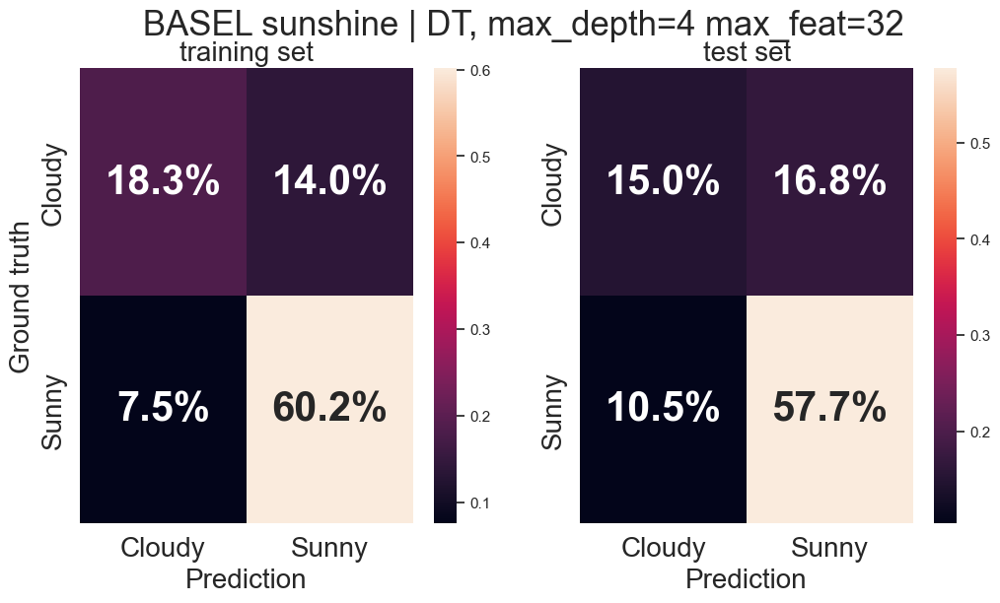

In [122]:
from sklearn.tree import DecisionTreeClassifier

est_name = 'DT'

SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False, degree=2)
DT = DecisionTreeClassifier(random_state=42)
DT.fit(X_train, y_train)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS), #note that for SVM scaling is critical
    #("polynomial_features", PF),
    ("dt", DT)
])

params = {'dt__max_depth':[4],
          'dt__max_features': [31, 32, 33, 35]}

                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=1, scoring="f1")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

est_parameters = ", max_depth={} max_feat={}".format(grid.best_params_['dt__max_depth'], grid.best_params_['dt__max_features'])

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
plot_train_test(estimator, title=plot_title)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

In [123]:
grid.best_estimator_.fit(X_train, y_train)
dt = estimator.named_steps['dt']
#y_pred = dt.predict(X_test)

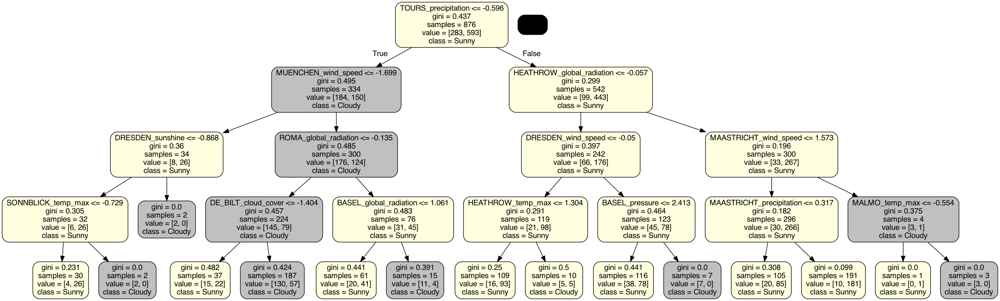

In [124]:
#Optional: visualise decision tree
from io import StringIO #to dump file as string
from IPython.display import Image #to show an image in jupyter
from sklearn.tree import export_graphviz #to take the tree and render into graph
import pydotplus #to render image
# Create an output destination for the file
dot_data = StringIO()

export_graphviz(dt, out_file=dot_data, label='all', rounded=True, filled=True,
                class_names=col4prediction_labels, feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

colors=["gray", "lightyellow"]

nodes = graph.get_node_list()
for node in nodes:
    if node.get_label():
        if node.get_label().find('value =') != -1:
            values = [int(ii) for ii in node.get_label().split('value = [')[1].split(']')[0].split(',')]
            values = [int(255 * v / sum(values)) for v in values]
            if values[0] > values[1]:
                node.set_fillcolor(colors[0])
            else:
                node.set_fillcolor(colors[1])


# View the tree image
filename = 'sunny_tree.png'
graph.write_png(filename)
Image(filename=filename) 

## RandomForest
[back to ToC](#Contents)

Fitting 2 folds for each of 2 candidates, totalling 4 fits
0.7414439417907478 {'rf__max_features': 132, 'rf__n_estimators': 800}
Report of TrainData: 
               precision    recall  f1-score   support

       False       1.00      1.00      1.00       283
        True       1.00      1.00      1.00       593

    accuracy                           1.00       876
   macro avg       1.00      1.00      1.00       876
weighted avg       1.00      1.00      1.00       876

Report of TestData: 
               precision    recall  f1-score   support

       False       0.70      0.50      0.58        70
        True       0.79      0.90      0.84       150

    accuracy                           0.77       220
   macro avg       0.75      0.70      0.71       220
weighted avg       0.76      0.77      0.76       220



,accuracy,precision,recall,f1,auc
SVC,0.6909,0.7662,0.7867,0.7763,0.6362
CTSVCrbf,0.7682,0.8000,0.8800,0.8381,0.7043
DT,0.7273,0.7744,0.8467,0.8089,0.6590
RF,0.7727,0.7941,0.9000,0.8438,0.7000


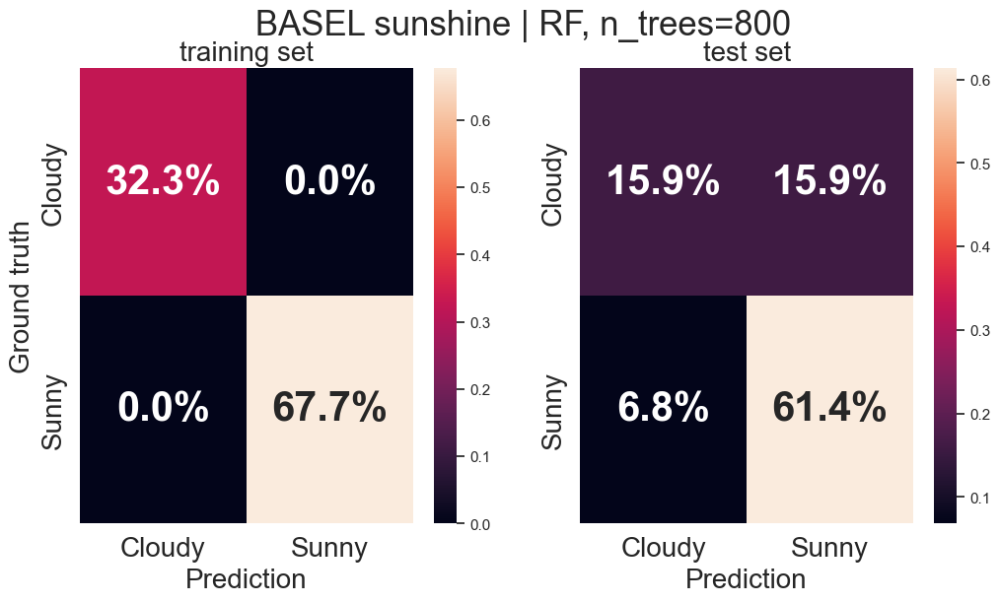

In [125]:
from sklearn.ensemble import RandomForestClassifier

est_name = 'RF'
SS = StandardScaler()
PF = PolynomialFeatures(include_bias=False, degree=2)

# Initialize the random forest estimator
RF = RandomForestClassifier(oob_score=True, 
                            random_state=42, 
                            warm_start=True,
                            n_jobs=-1)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS), #note that for SVM scaling is critical
    ("polynomial_features", PF),
    ("rf", RF)
])

#poly_degrees = [2]
params = {'rf__n_estimators':[200, 800],
          #'rf__max_features': range(2, len(DT.feature_importances_)+1, 10)
          'rf__max_features': [132]
         }
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=threads, scoring="roc_auc")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, score_df = score_estimator(estimator, X_train, y_train, X_test, y_test, name=est_name, fitted=grid)

est_parameters =", n_trees={}".format(grid.best_params_['rf__n_estimators'])

plot_title = "{} {} | {}{}".format(city4prediction, measure4prediction, est_name, est_parameters)
plot_train_test(estimator, title=plot_title)

if est_name in metrics_df.index:
    metrics_df.drop([est_name], inplace=True)
metrics_df = pd.concat([metrics_df, score_df])
round(metrics_df.tail(4), 4)

### ROC Curve

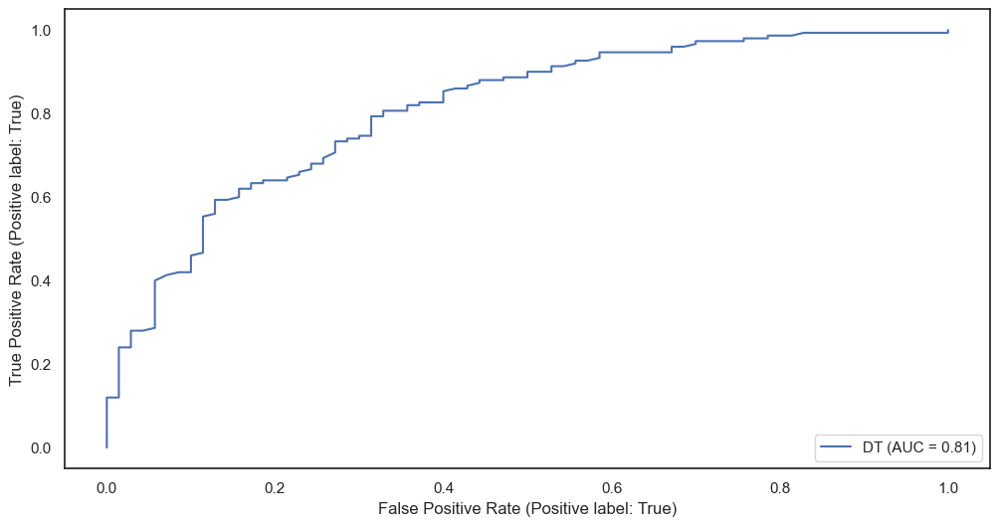

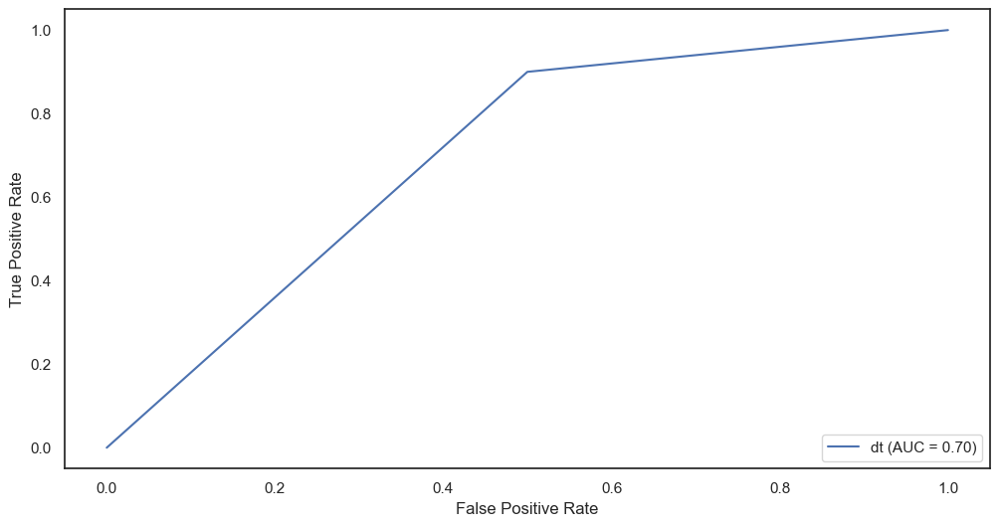

In [126]:
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_estimator(estimator, X_test, y_test, name="DT")

from sklearn.metrics import auc, roc_curve
y_pred = estimator.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred, drop_intermediate=False)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='dt')
display.plot()

In [127]:
roc_auc = auc(fpr, tpr)
roc_auc

0.7

### OOB plot

In [128]:
RF = RandomForestClassifier(oob_score=True, 
                            random_state=42, 
                            warm_start=True,
                            n_jobs=-1)

estimator = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS), #note that for SVM scaling is critical
    ("polynomial_features", PF),
    ("rf", RF)
])

oob_list = list()

# Iterate through all of the possibilities for 
# number of trees
for n_trees in [15, 30, 50, 100, 150, 200, 300, 400, 500, 600, 800, 1000]:
    
    # Use this to set the number of trees
    estimator.set_params(rf__n_estimators=n_trees)

    # Fit the model
    estimator.fit(X_train, y_train)

    # Get the oob error
    oob_error = 1 - estimator.named_steps["rf"].oob_score_
    
    # Store it
    oob_list.append(pd.Series({'n_trees': n_trees, 'oob': oob_error}))

rf_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')

rf_oob_df

/Users/insana/miniconda3/envs/tensorflow_env/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:583: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.



,oob
n_trees,
15.0,0.335616
30.0,0.315068
50.0,0.300228
100.0,0.280822
150.0,0.281963
200.0,0.279680
300.0,0.268265
400.0,0.267123
500.0,0.267123


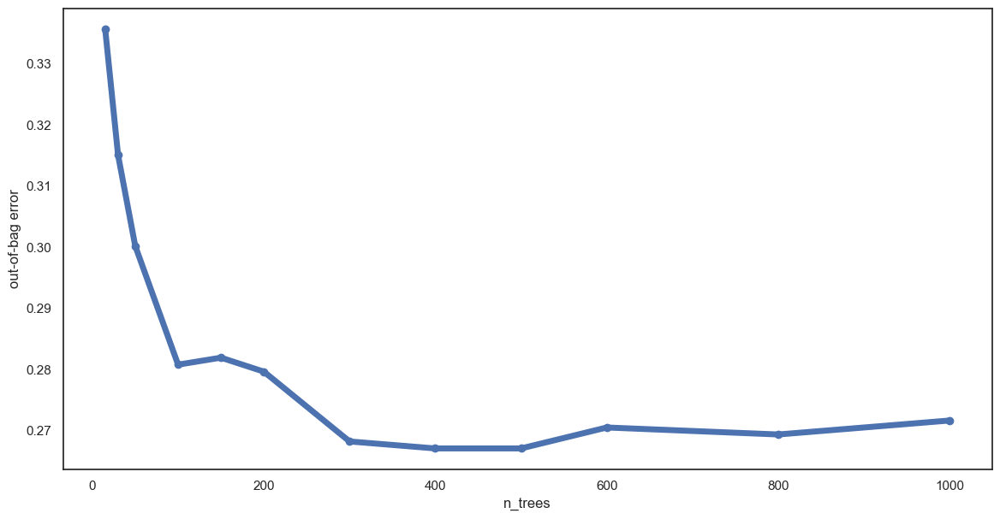

In [129]:
sns.set_style('white')

ax = rf_oob_df.plot(legend=False, marker='o', figsize=(14, 7), linewidth=5)
ax.set(ylabel='out-of-bag error');

# UnsupervisedML
[back to ToC](#Contents)
## Unsupervised Machine Learning

Please refer to the <a href='04.unsupervised_courseproject_report_Giuseppe_Insana.pdf'>project report</a>

## Objective:

Main objective of the analysis that also specifies whether your model will be focused on clustering or dimensionality reduction and the benefits that your analysis brings to the business or stakeholders of this data.

Brief description of the data set you chose, a summary of its attributes, and an outline of what you are trying to accomplish with this analysis.

Brief summary of data exploration and actions taken for data cleaning orfeature engineering.

Summary of training at least three variations of the unsupervised model you selected. For example, you can use different clustering techniques or different hyperparameters.

A paragraph explaining which of your Unsupervised Learning models you recommend as a final model that best fits your needs in terms.

Summary Key Findings and Insights, which walks your reader through the main findings of your modeling exercise.

Suggestions for next steps in analyzing this data, which may include suggesting revisiting this model or adding specific data features to achieve a better model.

In [130]:
df = cleandata.copy()

#let's remove DATE, YEAR, DAY
df.drop(['DATE','YEAR','DAY'], axis=1, inplace=True)

## Dimensionality Reduction analysis

### Checking correlations in the data

In [131]:
#let's remove the diagonal and all the top right half of the correlation matrix
#(to avoid duplications, since it's symmetrical)
corr_mat = df.corr()
for x in range(corr_mat.shape[0]):
    corr_mat.iloc[x,x] = 0.0
for x in range(corr_mat.shape[0]):
    for y in range(x, corr_mat.shape[1]):
        corr_mat.iloc[x,y] = 0.0

In [132]:
#the highest (absolute) correlations to the MONTH variable are found in temperature measures and in humidity
pd.DataFrame(corr_mat.sort_values(by='MONTH', key=abs, ascending=False)['MONTH'].head(20).round(4))
#still, maximum correlation only .29

,MONTH
MALMO_temp_min,0.2942
STOCKHOLM_temp_min,0.2891
ROMA_temp_min,0.2828
ROMA_temp_mean,0.2740
SONNBLICK_temp_min,0.2715
SONNBLICK_temp_mean,0.2651
BASEL_humidity,0.2602
MALMO_temp_mean,0.2597
SONNBLICK_temp_max,0.2517
LJUBLJANA_temp_min,0.2421


In [133]:
#very high correlations (even up to 0.99!) in general are usually with same city or same measure across nearby cities, examples:
max_corr = pd.DataFrame(corr_mat.abs().max())
max_corr.columns=['max_abs_corr']
max_corr['max_corr_with'] = pd.DataFrame(corr_mat.abs().idxmax())
max_corr[max_corr['max_abs_corr'] > 0.6].sort_values(by='max_abs_corr', ascending=False).head(20).round(4)

,max_abs_corr,max_corr_with
DUSSELDORF_pressure,0.9955,MAASTRICHT_pressure
DUSSELDORF_temp_mean,0.9941,MAASTRICHT_temp_mean
DUSSELDORF_temp_max,0.9902,MAASTRICHT_temp_max
BUDAPEST_temp_mean,0.9899,BUDAPEST_temp_max
DE_BILT_pressure,0.9892,DUSSELDORF_pressure
SONNBLICK_temp_mean,0.9888,SONNBLICK_temp_min
DRESDEN_temp_mean,0.9867,DRESDEN_temp_max
STOCKHOLM_temp_mean,0.9858,STOCKHOLM_temp_max
DE_BILT_temp_mean,0.9839,MAASTRICHT_temp_mean
MAASTRICHT_temp_mean,0.9815,MAASTRICHT_temp_max


Text(0.5, 0.98, 'Correlation among measures of humidity')

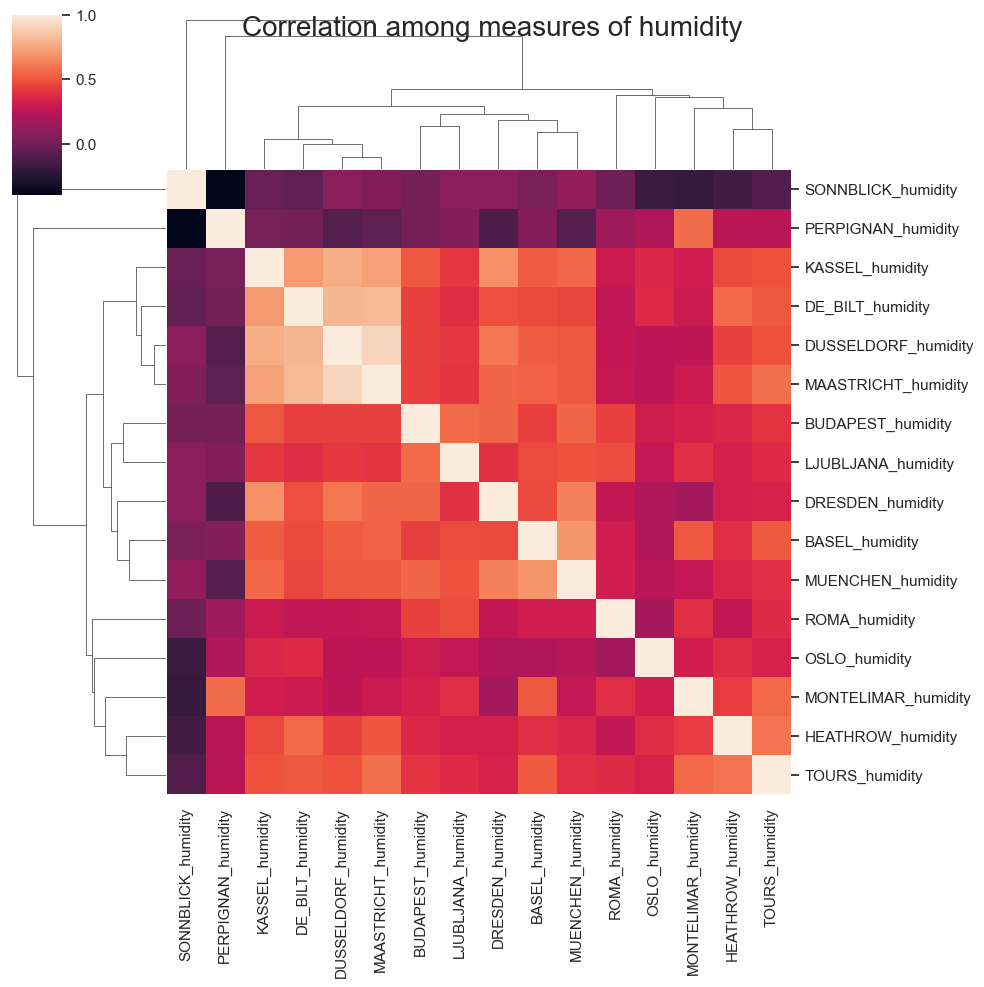

In [134]:
measure="humidity"
g = sns.clustermap(df[[x for x in df.columns if x.find("_"+measure) != -1]].corr())
g.fig.suptitle('Correlation among measures of {}'.format(measure), fontproperties={'size':20})

Text(0.5, 0.98, 'Correlation among measures of sunshine')

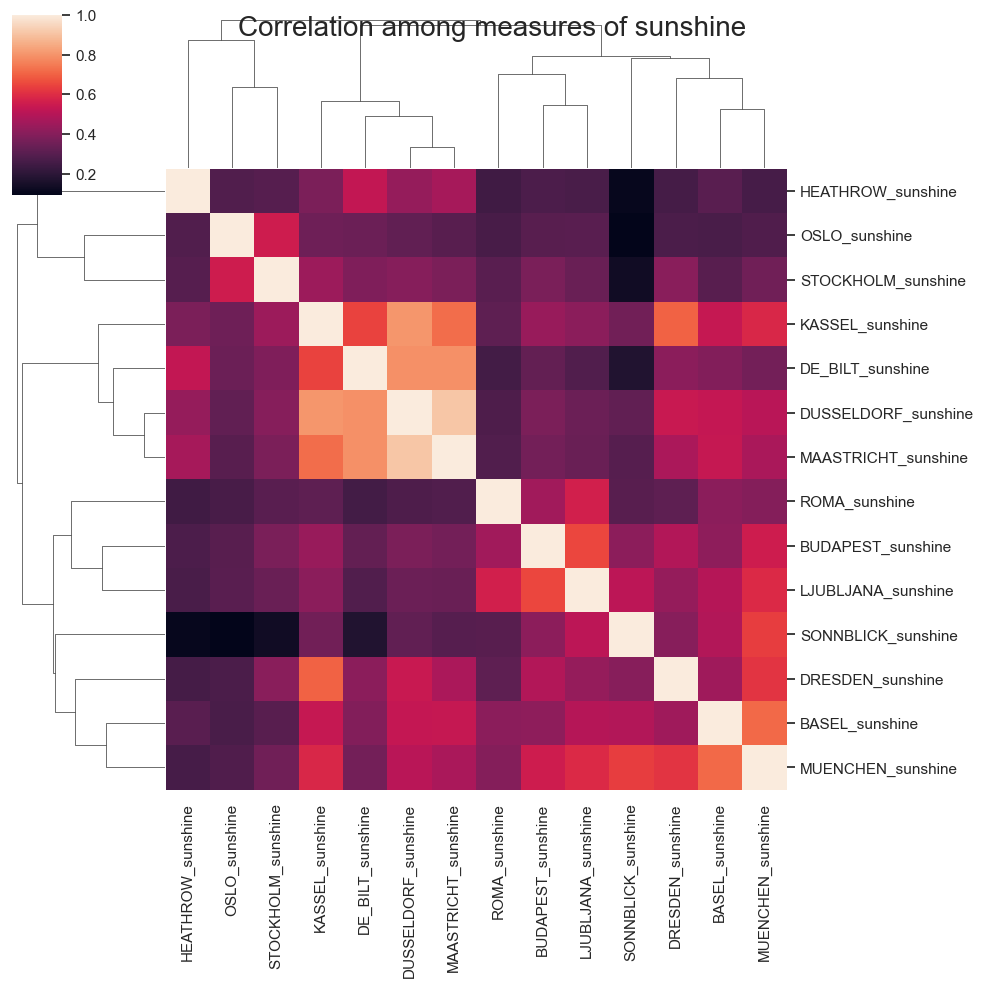

In [135]:
measure="sunshine"
g = sns.clustermap(df[[x for x in df.columns if x.find("_"+measure) != -1]].corr())
g.fig.suptitle('Correlation among measures of {}'.format(measure), fontproperties={'size':20})

Text(0.5, 0.98, 'Correlation among measures of temperature')

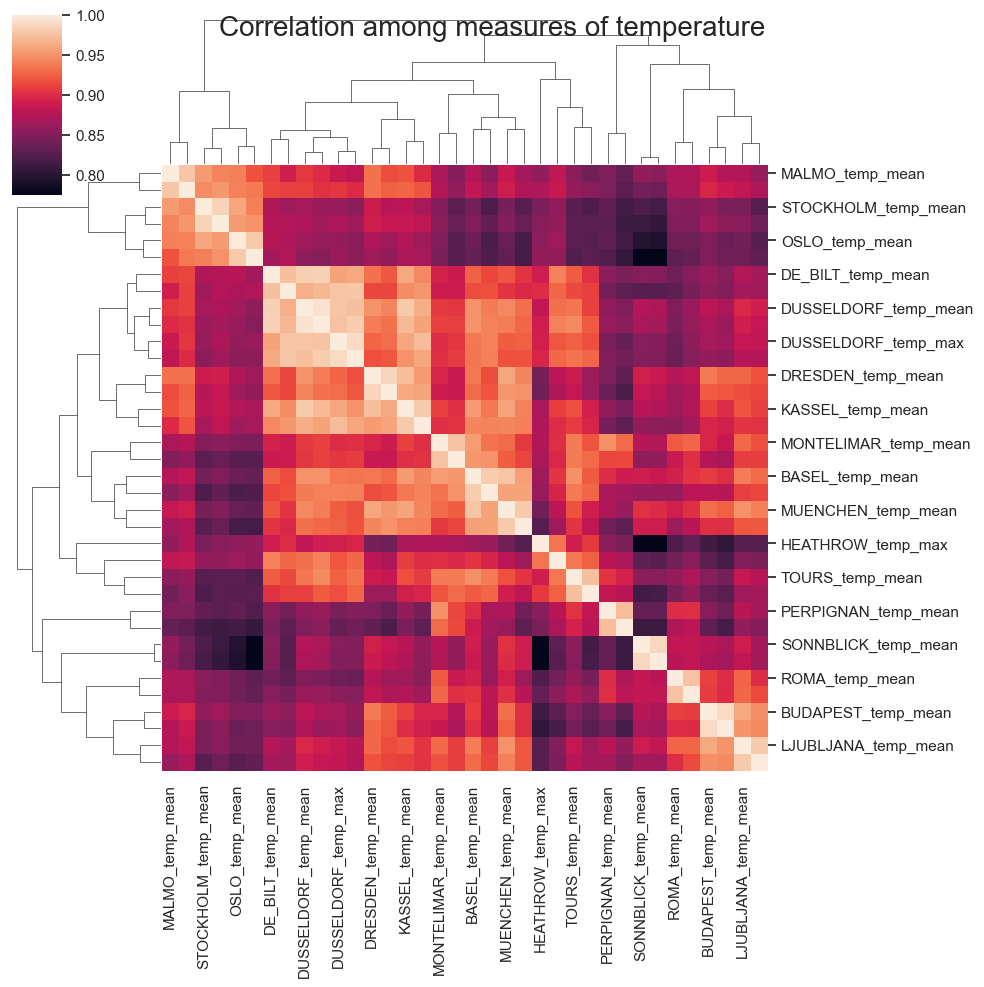

In [136]:
#temperature correlations very high:
g = sns.clustermap(df[[x for x in df.columns if (x.find("_temp_mean") != -1 or x.find("_temp_max") != -1)]].corr())
g.fig.suptitle('Correlation among measures of temperature', fontproperties={'size':20})

## PCA
[back to ToC](#Contents)

### Analysis of PCA metrics

In [137]:
pca_list = list()
feature_weight_list = list()
kernel_pca_list = list()

In [138]:
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA

def pca_explained_variance(data, n_components, model, gamma=0):
    pipeline_steps = []
        
    if model.find('CT_') != -1:
        pipeline_steps.append(('mostskewed', col_transformer(data, measure_columns)))
    elif model.find('AT_') != -1:
        pipeline_steps.append(('anyskewed', col_transformer(data, measure_columns, all=True)))
        
    if model.find('MM_') != -1:
        pipeline_steps.append(('mmscaler', MinMaxScaler()))
    elif model.find('SS_') != -1:
        pipeline_steps.append(('ssscaler', StandardScaler()))
    
    if gamma:
        pipeline_steps.append(('pca', KernelPCA(n_components=n_components,
                                                kernel='rbf', gamma=gamma, fit_inverse_transform=True)))
    else:
        pipeline_steps.append(('pca', PCA(n_components=n_components)))
    
    
    pipe = Pipeline(pipeline_steps)
    #eprint("model: {}".format(pipe.named_steps.keys())) #debug
    pipe.fit(data)
    pcamodel = pipe.named_steps['pca']
    
    #to get data from pipeline just before pca:
    x_intermediate = data
    for step in pipe.steps[:-1]:
        x_intermediate = step[1].transform(x_intermediate)
        
    #fit, transform and invert to see if we can reconstruct the original data
    data_pca = pipe.transform(data)
    data_inv = pcamodel.inverse_transform(data_pca)
    
    #compare with data before pca (transformed and scaled if applicable)
    mse = mean_squared_error(x_intermediate, data_inv)

    if gamma:
        explained_variance = 0
        feature_values = 0
    else:
        explained_variance = pcamodel.explained_variance_ratio_.sum()
        #feature importances
        feature_values = np.abs(pcamodel.components_).sum(axis=0)
    
    return explained_variance, mse, feature_values

### Comparison of different options

In [139]:
from sklearn.preprocessing import MinMaxScaler
until = df.shape[1] #to arrive until the number of columns
#until = 5 #to stop earlier
#for model in ['PCA', 'SS_PCA', 'CT_SS_PCA']:
#with and without log1p, different scaler, different amount of columns to apply log1p to
#(43 columns for CT at 0.75 skewlimit, 78 for AT using 0.4 skewlimit)
for model in ['SS_PCA', 'MM_PCA', 'CT_SS_PCA', 'CT_MM_PCA', 'AT_SS_PCA', 'AT_MM_PCA']:
    for n in range(1,until):
    #for n in range(160, until):
        explained_variance, mse, feature_values = pca_explained_variance(df, n, model)
        pca_list.append(pd.Series({'model': model,
                                   'dim':n,
                                   'var': explained_variance,
                                   'mse': mse
                                  }))
        feature_weight_list.append(pd.DataFrame({'model': model,
                                                 'dim':n, 
                                                 'features': df.columns,
                                                 'values': feature_values/feature_values.sum()}))
full_features_df = pd.concat(feature_weight_list)
pca_df = pd.concat(pca_list, axis=1).T
pca_df['dim']=pca_df['dim'].astype(int)
pca_df

,model,dim,var,mse
0,SS_PCA,1,0.383348,0.616652
1,SS_PCA,2,0.495782,0.504218
2,SS_PCA,3,0.551424,0.448576
3,SS_PCA,4,0.605471,0.394529
4,SS_PCA,5,0.649785,0.350215
...,...,...,...,...
973,AT_MM_PCA,159,0.999996,0.0
974,AT_MM_PCA,160,0.999998,0.0
975,AT_MM_PCA,161,1.0,0.0
976,AT_MM_PCA,162,1.0,0.0


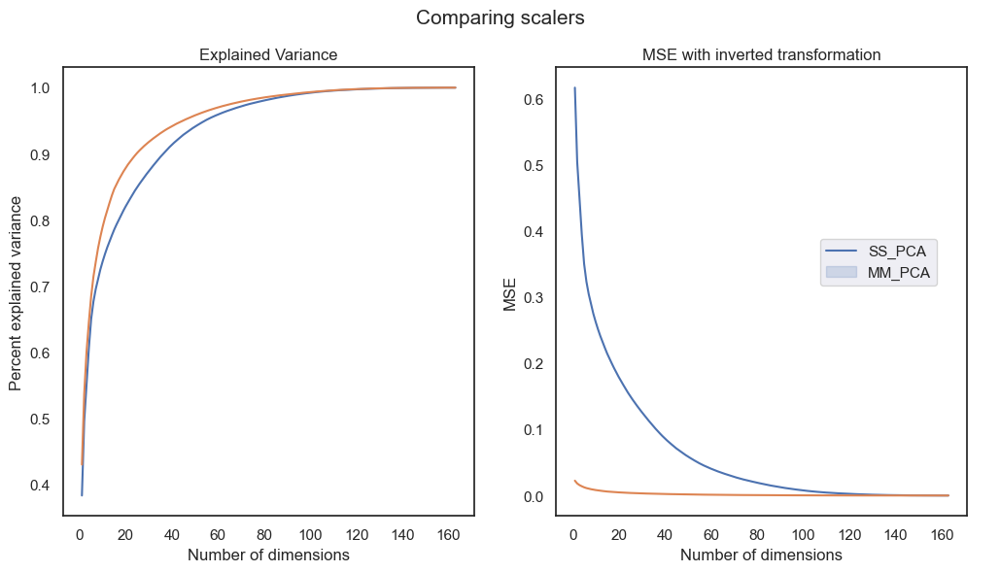

In [140]:
#Comparing scalers

labels=['SS_PCA', 'MM_PCA']
pca_df_scalers = pca_df[pca_df['model'].isin(labels)]
fig, axes = plt.subplots(1, 2)
sns.set(rc={"figure.figsize":(16,8)})

#Plot explained variance vs number of PCA components, compare scalers
ax=axes[0]
sns.lineplot(ax=ax, y=pca_df_scalers['var'], x=pca_df_scalers['dim'], hue=pca_df_scalers['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance');
ax.legend([],[], frameon=False)

#Plot MSE of data before pca and data after pca+inverse transform:
ax=axes[1]
sns.lineplot(ax=ax, y=pca_df_scalers['mse'], x=pca_df_scalers['dim'], hue=pca_df_scalers['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='MSE',
       title='MSE with inverted transformation');
ax.legend([],[], frameon=False)

fig.suptitle('Comparing scalers', fontsize=15)
fig.legend(labels=labels, loc=[0.82,0.5])



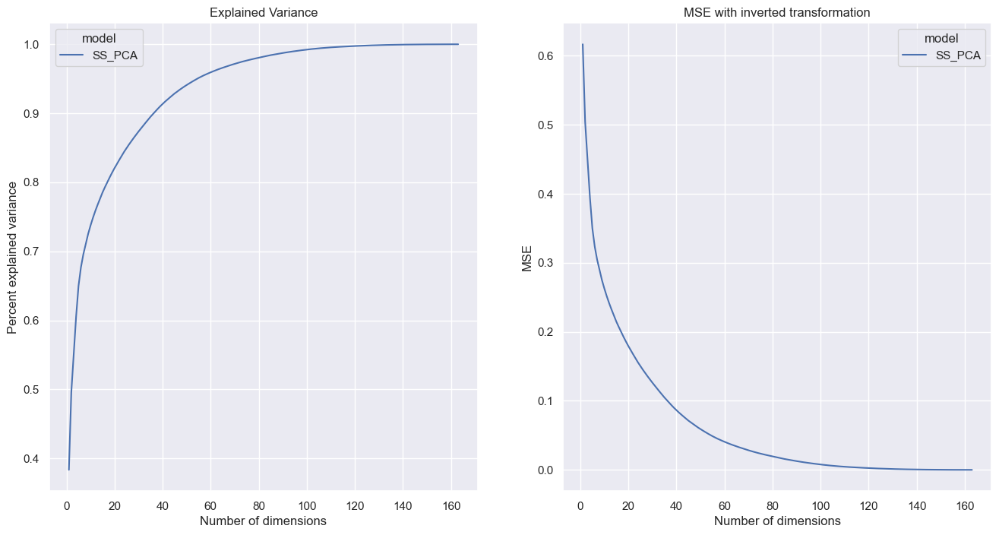

In [141]:
#Chosen SS:
labels=['SS_PCA']
pca_df_scalers = pca_df[pca_df['model'].isin(labels)]
fig, axes = plt.subplots(1, 2)
sns.set(rc={"figure.figsize":(16,8)})

#Plot explained variance vs number of PCA components, compare scalers
ax=axes[0]
sns.lineplot(ax=ax, y=pca_df_scalers['var'], x=pca_df_scalers['dim'], hue=pca_df_scalers['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance')

#Plot MSE of data before pca and data after pca+inverse transform:
ax=axes[1]
sns.lineplot(ax=ax, y=pca_df_scalers['mse'], x=pca_df_scalers['dim'], hue=pca_df_scalers['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='MSE',
       title='MSE with inverted transformation');


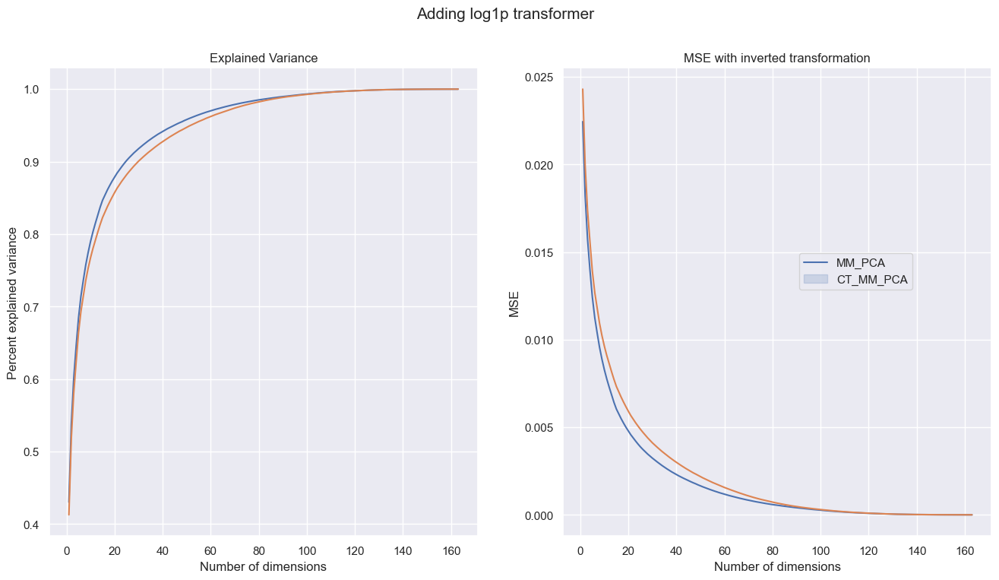

In [142]:
#Comparing transformers
#labels=['MM_PCA', 'CT_MM_PCA', 'AT_MM_PCA']
#Adding transformer:
labels=['MM_PCA', 'CT_MM_PCA']
pca_df_mm = pca_df[pca_df['model'].isin(labels)]

fig, axes = plt.subplots(1,2)
sns.set(rc={"figure.figsize":(16,8)})

#Plot explained variance vs number of PCA components, compare transformers
ax=axes[0]
sns.lineplot(ax=ax, y=pca_df_mm['var'], x=pca_df_mm['dim'], hue=pca_df_mm['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance')
ax.legend([],[], frameon=False)

#Plot MSE of data before pca and data after pca+inverse transform, compare transformers:
ax=axes[1]
sns.lineplot(ax=ax, y=pca_df_mm['mse'], x=pca_df_mm['dim'], hue=pca_df_mm['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='MSE',
       title='MSE with inverted transformation')
ax.legend([],[], frameon=False)

fig.suptitle('Adding log1p transformer', fontsize=15)
fig.legend(labels=labels, loc=[0.80,0.5])

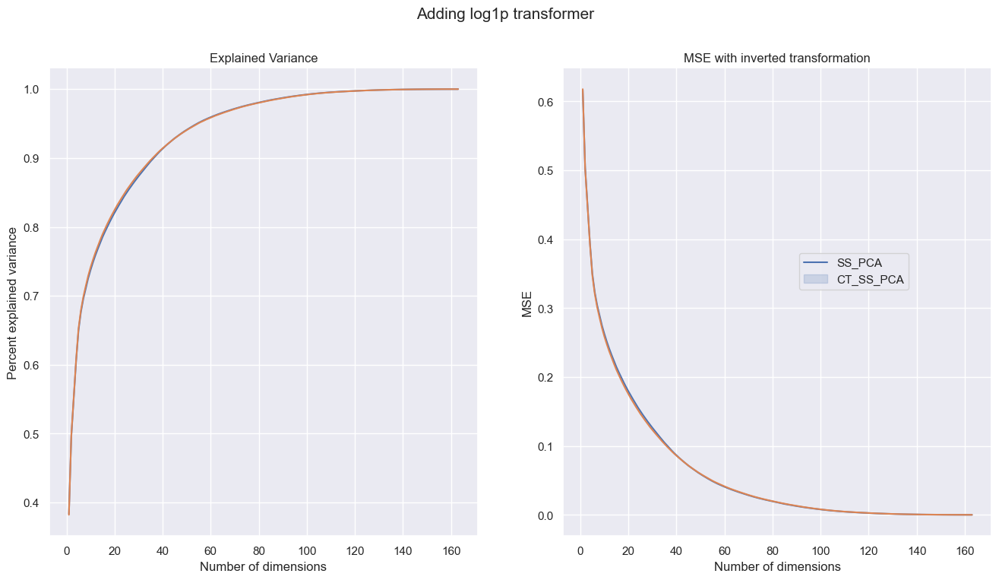

In [143]:
#Comparing transformers
labels=['SS_PCA', 'CT_SS_PCA', 'AT_SS_PCA']
#Adding transformer:
labels=['SS_PCA', 'CT_SS_PCA']
pca_df_ss = pca_df[pca_df['model'].isin(labels)]

fig, axes = plt.subplots(1,2)
sns.set(rc={"figure.figsize":(16,8)})

#Plot explained variance vs number of PCA components, compare transformers
ax=axes[0]
sns.lineplot(ax=ax, y=pca_df_ss['var'], x=pca_df_ss['dim'], hue=pca_df_ss['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance')
ax.legend([],[], frameon=False)

#Plot MSE of data before pca and data after pca+inverse transform, compare transformers:
ax=axes[1]
sns.lineplot(ax=ax, y=pca_df_ss['mse'], x=pca_df_ss['dim'], hue=pca_df_ss['model'])
ax.set(xlabel='Number of dimensions',
       ylabel='MSE',
       title='MSE with inverted transformation')
ax.legend([],[], frameon=False)

fig.suptitle('Adding log1p transformer', fontsize=15)
fig.legend(labels=labels, loc=[0.80,0.5])

### kernel PCA

In [144]:
kernelPCA = False
if kernelPCA:
    until = df.shape[1] #to arrive until the number of columns
    #step = 3
    step = 1 #to try all dimensions
    #until = 60 #to stop earlier
    #with and without log1p, different scaler, different amount of columns to apply log1p to
    #(43 columns for CT at 0.75 skewlimit, 78 for AT using 0.4 skewlimit)
    #for model in ['SS_PCA', 'MM_PCA', 'CT_SS_PCA', 'CT_MM_PCA', 'AT_SS_PCA', 'AT_MM_PCA']:
    gammas = [0.02, 0.01, 0.005]
    for gamma in gammas:
        #for model in ['SS_kPCA', 'CT_SS_kPCA']:
        for model in ['CT_SS_kPCA']:
            for n in range(1,until, step):
                _, mse, _ = pca_explained_variance(df, n, model, gamma)
                kernel_pca_list.append(pd.Series({'model': model+str(gamma),
                                           'dim': n,
                                           'var': explained_variance,
                                           'mse': mse
                                          }))
    kernel_pca_df = pd.concat(kernel_pca_list, axis=1).T
    kernel_pca_df['dim']=kernel_pca_df['dim'].astype(int)
    display(kernel_pca_df)

In [145]:
if kernelPCA:
    both_pca_df = pd.concat([pca_df, kernel_pca_df])
    labels=[]
    for gamma in gammas:
        labels.append('CT_SS_kPCA'+str(gamma))
    pca_df_scalers = both_pca_df[both_pca_df['model'].isin(labels)]
    sns.set(rc={"figure.figsize":(16,8)})

    ax = sns.lineplot(y=pca_df_scalers['mse'], x=pca_df_scalers['dim'], hue=pca_df_scalers['model'])
    ax.set(xlabel='Number of dimensions',
           ylabel='MSE',
           title='MSE with inverted transformation');

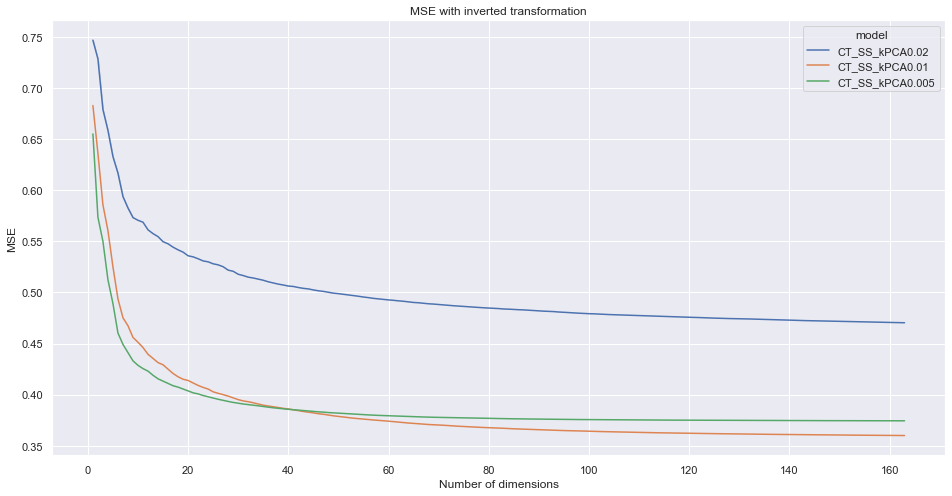

## PCA_ML
[back to ToC](#Contents)
#### Adding PCA to ML pipeline

In [146]:
city4prediction = "BASEL"
measure4prediction = "sunshine"
col4prediction = city4prediction + "_" + measure4prediction
reduced_data = True
includeMonth = True
X_data, y_data, X_data_ori, untilindex = initialize_data(cleandata, city4prediction, measure4prediction,
                                                         reduced_data=reduced_data, includeMonth=includeMonth)

*** We aim to predict tomorrow's 'sunshine' measure in 'BASEL' based on today's weather data for all locations and month information
Data size: X=(1096, 164) Y=(1096,)
   MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure  \
0      1                  8            0.89          1.0286   
1      1                  8            0.87          1.0318   
2      1                  5            0.81          1.0314   
3      1                  7            0.79          1.0262   
4      1                  5            0.90          1.0246   

   BASEL_global_radiation  BASEL_precipitation  BASEL_sunshine  
0                    0.20                 0.03             0.0  
1                    0.25                 0.00             0.0  
2                    0.50                 0.00             3.7  
3                    0.63                 0.35             6.9  
4                    0.51                 0.07             3.7  
      MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure 

In [147]:
from sklearn.model_selection import train_test_split
 
#we set aside 20% of the data to test the accuracy of our models
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=88)

In [148]:
from sklearn.model_selection import KFold
if reduced_data:
    folds = 2 #for KFold
else:
    #folds = 5
    folds = 3 #note, for course projects used 5
KF = KFold(shuffle=True, random_state=42, n_splits=folds)

In [149]:
def score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=False):
    if fitted:
        y_test_pred = fitted.predict(X_test)
        y_train_pred = fitted.predict(X_train)
    if not fitted:
        estimator.fit(X_train, y_train)
        y_train_pred = estimator.predict(X_train)
        y_test_pred = estimator.predict(X_test)
    estimator.y_train = y_train
    estimator.y_test = y_test
    estimator.y_train_pred = y_train_pred
    estimator.y_test_pred = y_test_pred
    error_df=pd.DataFrame(
    {
        'trainMSE': -cross_val_score(estimator, X_train, y_train, scoring='neg_mean_squared_error', cv=KF).mean(),
        'testMSE' : mean_squared_error(y_test,  y_test_pred),
        'trainR2' : cross_val_score(estimator, X_train, y_train, scoring='r2', cv=KF).mean(),
        'testR2' : r2_score(y_test, y_test_pred)
    }, index=[est_name])
    return estimator, error_df

def plot_train_test(estimator, prediction_label, plot_title, coef = [], columns = [], check_feat=True, feat_importance=False):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(plot_title)
    axes[0].scatter(estimator.y_train_pred, estimator.y_train, s=10, alpha=0.5, color="teal")
    axes[0].set_title("training set")
    axes[0].set_xlabel("predicted {}".format(prediction_label))
    axes[0].set_ylabel("true {}".format(prediction_label))

    axes[1].scatter(estimator.y_test_pred, estimator.y_test, s=10, alpha=0.5, color="orange")
    axes[1].set_title("test set")
    axes[1].set_xlabel("predicted {}".format(prediction_label))
    
    # Checking feature importance
    if len(coef):
        print('** Coefficient analysis')
        print('   Sum of coefficients: {:0.2f}'.format(abs(coef).sum()))
        zero_coef = (coef==0).sum()
        tot_coef = len(coef)
        print('   Coefficients set to zero: {}/{} ({:0.2f}%)'.format(zero_coef, tot_coef, 100 * zero_coef / tot_coef))
        if check_feat != False:
            print("   Highest (absolute) coefficients:")

            pandas_version = str(pd.__version__)
            if pandas_version.find("0.25") != -1: #back compatible with old pandas
                df_importances = pd.DataFrame(zip(columns, abs(coef), coef))
                df_importances.columns=['feat', '(abs_coef)', 'coef']
                print(df_importances.sort_values(by='(abs_coef)', ascending=False).head(10))
                all_nz_coefs = df_importances.query('coef != 0').sort_values(by='(abs_coef)', ascending=False).coef.tolist()
                all_nz_cols = df_importances.query('coef != 0').sort_values(by='(abs_coef)', ascending=False).feat.tolist()
            else:
                df_importances = pd.DataFrame(zip(columns, coef))
                df_importances.columns=['feat','coef']
                print(df_importances.sort_values(by='coef', ascending=False, key=abs).head(10))
                all_nz_coefs = df_importances.query('coef != 0').sort_values(by='coef', ascending=False, key=abs).coef.tolist()
                all_nz_cols = df_importances.query('coef != 0').sort_values(by='coef', ascending=False, key=abs).feat.tolist()
            if feat_importance: #for full printout of feature importance
                print(' full feature importance list:')
                for nz_coef,nz_col in zip(all_nz_coefs, all_nz_cols):
                    print('{}\t{}'.format(nz_coef, nz_col))

Fitting 2 folds for each of 1 candidates, totalling 2 fits
0.40798958644996586 {'pca__n_components': 54, 'regression__alpha': 0.023}
** Coefficient analysis
   Sum of coefficients: 8.31
   Coefficients set to zero: 6/54 (11.11%)


,accuracy,precision,recall,f1,auc
LRL2,0.7500,0.8065,0.8333,0.8197,0.7024
LRelastic,0.7273,0.7206,0.9800,0.8305,0.5829
SVC,0.6909,0.7662,0.7867,0.7763,0.6362
CTSVCrbf,0.7682,0.8000,0.8800,0.8381,0.7043
DT,0.7273,0.7744,0.8467,0.8089,0.6590
RF,0.7727,0.7941,0.9000,0.8438,0.7000


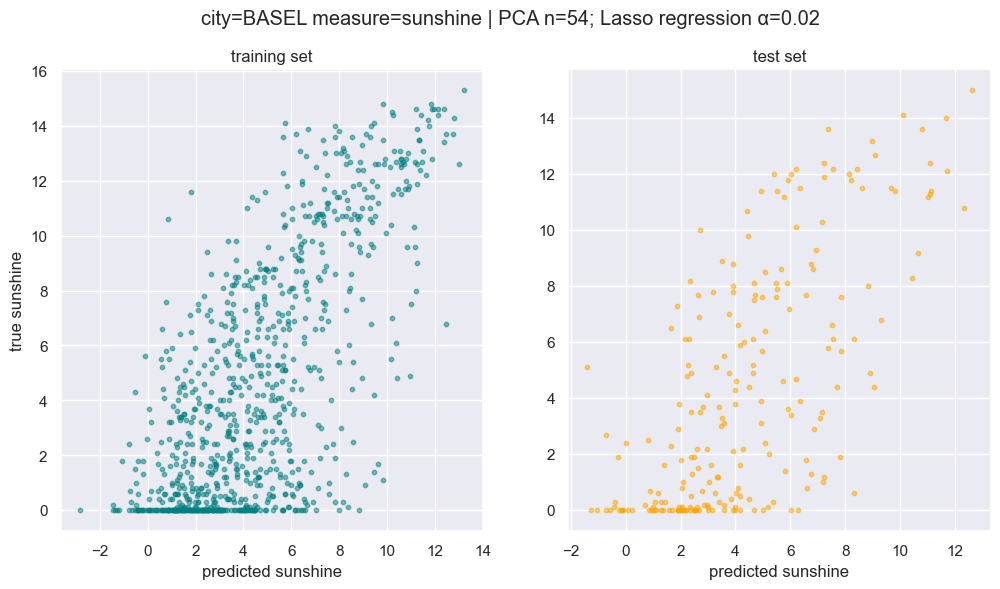

In [150]:
est_name = 'PCA_Lasso'
if est_name in errors_df.index:
    errors_df.drop([est_name], inplace=True)

SS = StandardScaler()
PF = PolynomialFeatures(degree=1, include_bias=False)
LA = Lasso(max_iter=10000)

estimator = Pipeline([
    #("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", SS),
    ("polynomial_features", PF),
    ('pca', PCA()),
    ("regression", LA)
])

params ={
    #'regression__alpha': np.geomspace(1e-3, 1e0, num=20),
    'regression__alpha': [0.023],
    'pca__n_components': [54]
}
                      
grid = GridSearchCV(estimator, params, cv=KF, verbose=3, n_jobs=-1, scoring="r2")
grid.fit(X_train, y_train)

print(grid.best_score_, grid.best_params_)

estimator = grid.best_estimator_

estimator, error_df = score_estimator(estimator, X_train, y_train, X_test, y_test, fitted=grid)

plot_title="city={} measure={} | PCA n={}; Lasso regression α={:0.2f}".format(
    city4prediction, measure4prediction,
    grid.best_params_['pca__n_components'],
    grid.best_params_['regression__alpha']
)
plot_train_test(estimator, measure4prediction, plot_title,  estimator.named_steps["regression"].coef_, check_feat=False)

errors_df = pd.concat([errors_df, error_df])
round(metrics_df.tail(6), 4)

## MDS
[back to ToC](#Contents)
### Multidimensional Scaling to recover topography of weather stations

first we create subset of cities and features for which we have complete data

In [151]:
cities_sub = sorted(['BASEL', 'BUDAPEST', 'DE_BILT', 'DUSSELDORF', 'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MONTELIMAR', 'MUENCHEN', 'OSLO', 'PERPIGNAN', 'ROMA', 'TOURS'])
measures_sub = sorted(['global_radiation', 'humidity', 'pressure', 'temp_max', 'temp_mean'])
print (len(cities_sub),"cities and",len(measures_sub),"measures")
from itertools import product
columns = [x+'_'+y for x,y in product(cities_sub, measures_sub)]
data_sub = cleandata[columns]
data_sub.head()

14 cities and 5 measures


,BASEL_global_radiation,BASEL_humidity,BASEL_pressure,BASEL_temp_max,BASEL_temp_mean,BUDAPEST_global_radiation,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_temp_max,BUDAPEST_temp_mean,...,ROMA_global_radiation,ROMA_humidity,ROMA_pressure,ROMA_temp_max,ROMA_temp_mean,TOURS_global_radiation,TOURS_humidity,TOURS_pressure,TOURS_temp_max,TOURS_temp_mean
0,0.20,0.89,1.0286,3.9,2.9,0.52,0.92,1.0268,-0.7,-4.9,...,0.92,0.72,1.0244,8.0,1.6,0.25,0.97,1.0275,9.8,8.5
1,0.25,0.87,1.0318,4.8,3.6,0.14,0.94,1.0297,-1.9,-3.6,...,0.81,0.74,1.0263,8.4,4.2,0.17,0.99,1.0293,9.2,7.9
2,0.50,0.81,1.0314,4.8,2.2,0.19,0.95,1.0295,1.1,-0.8,...,0.89,0.77,1.0288,21.1,3.8,0.27,0.91,1.0267,9.6,8.1
3,0.63,0.79,1.0262,7.5,3.9,0.21,0.94,1.0252,0.1,-1.0,...,0.89,0.85,1.0273,10.0,6.0,0.11,0.95,1.0222,10.8,8.6
4,0.51,0.90,1.0246,8.6,6.0,0.43,0.88,1.0235,3.9,0.2,...,0.74,0.92,1.0238,11.2,5.0,0.39,0.95,1.0209,9.5,8.0


In [152]:
df = data_sub
correlations = {}
for measure in measures_sub:
    correlations[measure] = df[[city+'_'+measure for city in cities_sub]].corr()
    correlations[measure].columns=cities_sub
    correlations[measure].index=cities_sub
distances = {}

In [153]:
#check the ranges of correlations, to see if there are negative correlations
for measure in measures_sub:
    print(measure, correlations[measure].min().min(), correlations[measure].max().max())
#as there can be negative correlations we can decide to treat them as even more distant
#we may instead decide to use abs() and treat a negative correlation as sign that they are close..

global_radiation 0.5922931075027971 1.0
humidity -0.09223085177293879 1.0
pressure 0.04436827633177728 1.0
temp_max 0.8042933288388112 1.0
temp_mean 0.8283651157291388 1.0


In [154]:
#e.g. negative humidity between DUSSELDORF and PERPIGNAN:
correlations['humidity']['DUSSELDORF']

BASEL         0.519806
BUDAPEST      0.442128
DE_BILT       0.807326
DUSSELDORF    1.000000
HEATHROW      0.446354
KASSEL        0.777690
LJUBLJANA     0.416608
MAASTRICHT    0.912604
MONTELIMAR    0.260352
MUENCHEN      0.509347
OSLO          0.248372
PERPIGNAN    -0.091394
ROMA          0.268279
TOURS         0.494838
Name: DUSSELDORF, dtype: float64

In [155]:
treat_negative_as_more_distant = True
for measure in measures_sub:
    if treat_negative_as_more_distant:
        #if we want to treat negative correlations as more far away:
        distances[measure] = correlations[measure] + 1 #we add 1 to all values 
    else:
        #if instead we prefer to treat positive and negative correlation as both indicative of closeness
        distances[measure] = abs(correlations[measure]) + 1
    #we then invert correlation to get "distance"
    distances[measure] = 1./distances[measure]
    distances[measure] -= 0.5 #we subtract 0.5 to get back 0 for the diagonals  

/Users/insana/miniconda3/envs/tensorflow_env/lib/python3.10/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



Text(0.5, 0.98, 'Dissimilarity matrix for pressure')

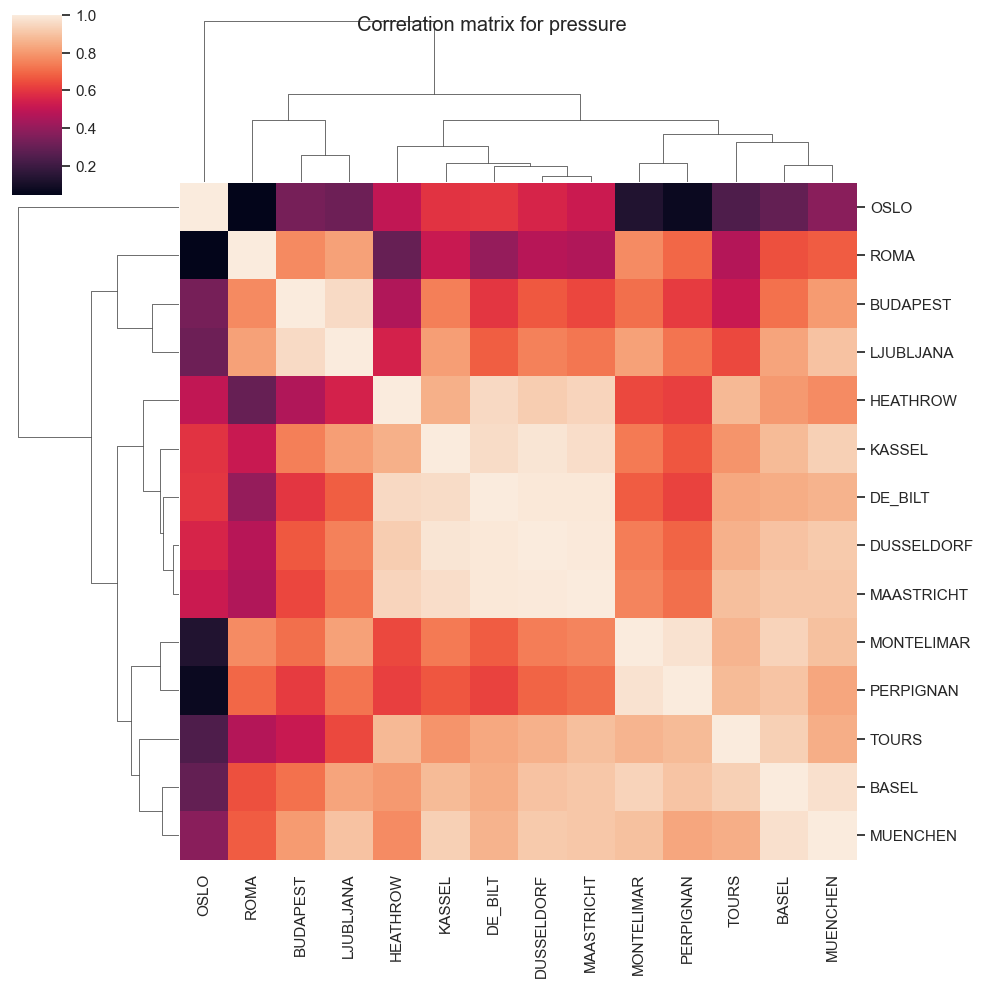

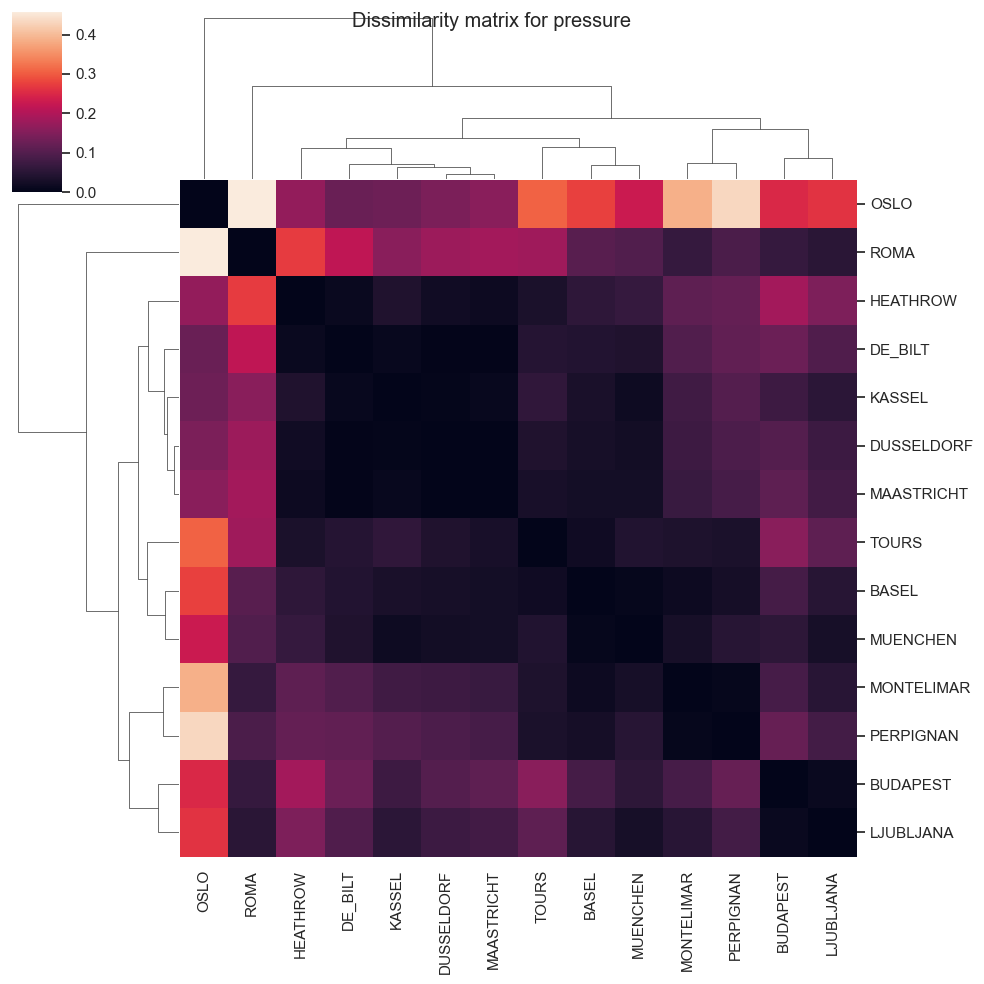

In [156]:
measure = 'pressure'
g = sns.clustermap(correlations[measure])
g.fig.suptitle("Correlation matrix for {}".format(measure))
g = sns.clustermap(distances[measure])
g.fig.suptitle("Dissimilarity matrix for {}".format(measure))

In [157]:
#check the ranges of distances
distances_max = {}
for measure in measures_sub:
    maxvalue = distances[measure].max().max()
    distances_max[measure] = maxvalue
    print(measure, distances[measure].min().min(), maxvalue)

global_radiation 0.0 0.1280250760918673
humidity 0.0 0.6016016593569766
pressure 0.0 0.4575166372463786
temp_max 0.0 0.054233607150545704
temp_mean 0.0 0.0469367094116796


In [158]:
#scale all in range 0-1: we are only interested in relative distances,
#and don't know which measure is more relevant compared to the others
for measure in measures_sub:
    distances[measure] /= distances_max[measure]

Preparing 5 plots arranged in 2 rows and 3 columns


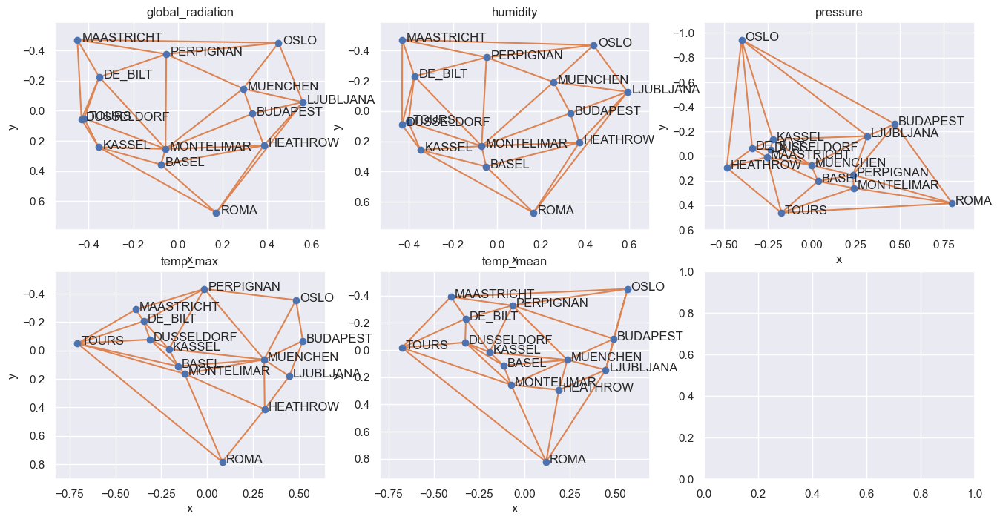

In [159]:
#Multidimensional scaling given a dissimilarity matrix
#One for each measure:
from sklearn.manifold import MDS
from scipy.spatial import Delaunay, delaunay_plot_2d
invert_axis = True
plot_columns = 3
plot_count = len(measures_sub)
plot_rows = math.ceil(plot_count / plot_columns)
print("Preparing {} plots arranged in {} rows and {} columns".format(plot_count, plot_rows, plot_columns))
fig, axes = plt.subplots(plot_rows, plot_columns)
sns.set(rc={"figure.figsize":(20,15)})
for plotid, measure in enumerate(measures_sub):
    mds = MDS(metric=False, dissimilarity='precomputed', random_state=42, normalized_stress=False)
    points = mds.fit_transform(distances[measure])
    a=pd.DataFrame(points)
    a.columns=['x', 'y']
    a['label']=cities_sub
    ax=axes[plotid//3,plotid % 3]
    sns.scatterplot(data=a, x='x', y='y', ax=ax)
    ax.set(title=measure)
    for i, point in a.iterrows():
        ax.text(point['x']+.02, point['y']+.01, str(point['label']))
    tri = Delaunay(points)
    _ = delaunay_plot_2d(tri, ax)
    if invert_axis:
        ax.invert_yaxis()

In [160]:
#simple aggregation: adding them up and dividing by the number of measures (assuming equal weight among measures)
combined_ones = measures_sub

#if we want to preselect which one to combine:
combined_ones = ['temp_max', 'pressure', 'temp_mean']

combined_distances = distances[combined_ones[0]]
for measure in combined_ones[1:]:
    combined_distances += distances[measure]
combined_distances /= len(combined_ones)

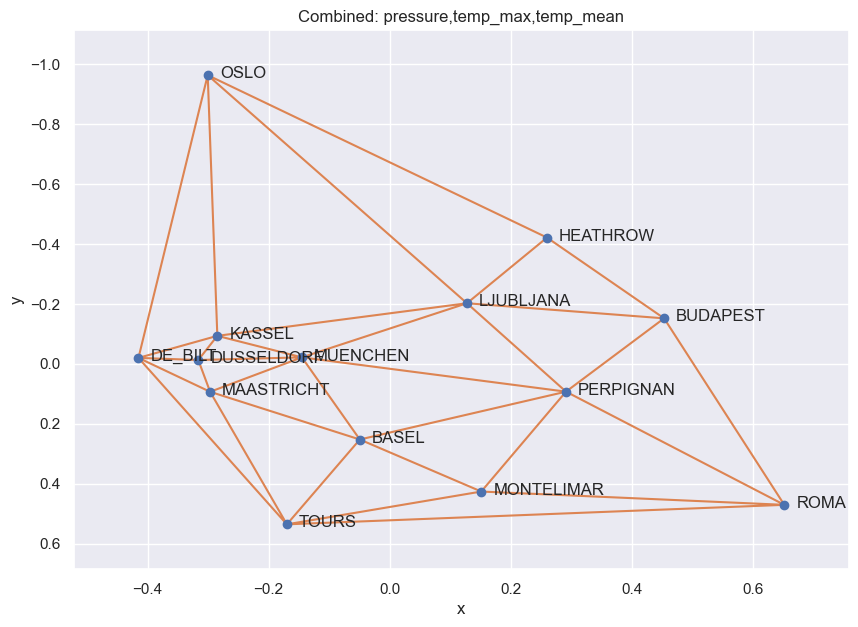

In [161]:
#single plot for combined distances
sns.set(rc={"figure.figsize":(10,7)})
mds = MDS(metric=False, dissimilarity='precomputed', random_state=42, normalized_stress=False)
points = mds.fit_transform(combined_distances)
a=pd.DataFrame(points)
a.columns=['x', 'y']
a['label']=cities_sub
ax = sns.scatterplot(data=a, x='x', y='y')
ax.set(title="Combined: "+",".join(sorted(combined_ones)))
for i, point in a.iterrows():
    ax.text(point['x']+.02, point['y']+.01, str(point['label']))
tri = Delaunay(points)
_ = delaunay_plot_2d(tri, ax)
ax.invert_yaxis()
plt.savefig("mva_map.png", transparent=True)

# DeepLearning
[back to ToC](#Contents)
## Deep Learning and Reinforcement Learning

Please refer to the <a href='05.DLcourseproject_report_Giuseppe_Insana.pdf'>project report</a>

## Objective:

Main objective of the analysis that also specifies whether your model will be focused on a specific type of Deep Learning or Reinforcement Learning algorithm and the benefits that your analysis brings to the business or stakeholders of this data.

Brief description of the data set you chose, a summary of its attributes, and an outline of what you are trying to accomplish with this analysis.

Brief summary of data exploration and actions taken for data cleaning or feature engineering.

Summary of training at least three variations of the Deep Learning model you selected. For example, you can use different clustering techniques or different hyperparameters.

A paragraph explaining which of your Deep Learning models you recommend as a final model that best fits your needs in terms of accuracy or explainability.

Summary Key Findings and Insights, which walks your reader through the main findings of your modeling exercise.

Suggestions for next steps in analyzing this data, which may include suggesting revisiting this model or adding specific data features to achieve a better model.


In [135]:
city4prediction = "BASEL"
measure4prediction = "sunshine"
col4prediction = city4prediction + "_" + measure4prediction
reduced_data = True
includeMonth = True
X_data, y_data, X_data_ori, untilindex = initialize_data(cleandata, city4prediction, measure4prediction,
                                                         reduced_data=reduced_data, includeMonth=includeMonth)

*** We aim to predict tomorrow's 'sunshine' measure in 'BASEL' based on today's weather data for all locations and month information
Data size: X=(1096, 164) Y=(1096,)
   MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure  \
0      1                  8            0.89          1.0286   
1      1                  8            0.87          1.0318   
2      1                  5            0.81          1.0314   
3      1                  7            0.79          1.0262   
4      1                  5            0.90          1.0246   

   BASEL_global_radiation  BASEL_precipitation  BASEL_sunshine  
0                    0.20                 0.03             0.0  
1                    0.25                 0.00             0.0  
2                    0.50                 0.00             3.7  
3                    0.63                 0.35             6.9  
4                    0.51                 0.07             3.7  
      MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure 

In [136]:
#we set aside 20% of the data to test the accuracy of our models
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=88)

In [137]:
#as baseline we can take today's weather in the city
y_baseline_train_pred = X_train[col4prediction] #'same as today'
y_baseline_test_pred = X_test[col4prediction]

#we can also use a dummy regressor which always uses the mean for the measure as the prediction
from sklearn.dummy import DummyRegressor
dummy_mean = DummyRegressor(strategy="mean")
dummy_mean.fit(X_train, y_train)
y_dummy_train_pred = dummy_mean.predict(X_train)
y_dummy_test_pred = dummy_mean.predict(X_test)

In [138]:
#reset metrics df
errors_df = pd.DataFrame()

error_df = pd.DataFrame([
{ # dummy: predict tomorrow weather as mean of all observed measures
    'trainMSE' : mean_squared_error(y_train,  y_dummy_train_pred),
    'testMSE' : mean_squared_error(y_test,  y_dummy_test_pred),
    'trainR2' : r2_score(y_train, y_dummy_train_pred),
    'testR2' : r2_score(y_test, y_dummy_test_pred)
},
{ #baseline: predict tomorrow weather as equal to today
    'trainMSE': mean_squared_error(y_train, y_baseline_train_pred),
    'testMSE' : mean_squared_error(y_test,  y_baseline_test_pred),
    'trainR2' : r2_score(y_train, y_baseline_train_pred),
    'testR2' : r2_score(y_test, y_baseline_test_pred)
}
],
    index=['dummy_mean', 'same_as_today'])#, 'LR'])
errors_df = pd.concat([errors_df, error_df])
errors_df

,trainMSE,testMSE,trainR2,testR2
dummy_mean,19.786516,18.547844,0.000000,-0.003400
same_as_today,18.742112,17.707455,0.052784,0.042063


In [139]:
#important settings and hyper parameters

SEED = 88
batch_size = 256

CTskew_limit = 0.75 #41 cols
#CTskew_limit = 0.5 #70 cols

In [140]:
def create_dense(input_size=0, output_size=0, hidden_layers_sizes=[],
                 model_name=None, output_activation=None, hidden_activation="relu", verbose=False):
    if not hidden_layers_sizes:
        print("No hidden layers' sizes specified, cannot build network")
        return None
    # Input layer
    inputs = keras.Input(shape=(input_size,), name='input')
    
    # Dense hidden layers
    hidden_layers = [None]*len(hidden_layers_sizes)
    for layer_id, layer_size in enumerate(hidden_layers_sizes):
        if layer_size == 'n': #create a batchnormalization layer
            if layer_id == 0:
                hidden_layers[layer_id] = keras.layers.BatchNormalization()(inputs)
            else:
                hidden_layers[layer_id] = keras.layers.BatchNormalization()(hidden_layers[layer_id - 1])
        elif str(layer_size).find('d') != -1: #create a dropout layer 
            dropout_amount = float(layer_size[1:])/100
            if layer_id == 0:
                hidden_layers[layer_id] = keras.layers.Dropout(dropout_amount)(inputs)
            else:
                hidden_layers[layer_id] = keras.layers.Dropout(dropout_amount)(hidden_layers[layer_id - 1])
        elif str(layer_size).find('R') != -1: #create a rnn layer 
            if layer_id == 0:
                _, layer_size = str(layer_size).split('R')
                layer_size = int(layer_size)
                if verbose: eprint("Adding RNN with {} units".format(layer_size))
                hidden_layers[layer_id] = keras.layers.SimpleRNN(layer_size)(inputs)
            else:
                hidden_layers[layer_id] = keras.layers.SimpleRNN(layer_size)(hidden_layers[layer_id - 1])
        else:
            keras.layers.Dense(3, kernel_regularizer='l1')
            if str(layer_size).find('r') != -1:
                layer_size, regularization = str(layer_size).split('r')
                layer_size = int(layer_size)
                if verbose: eprint("Adding layer size {} with regularization {}".format(layer_size, regularization))
                if regularization == 'l3':
                    regularization = tf.keras.regularizers.l1_l2(l1=0.01, l2=0.01)
                if layer_id == 0:
                    hidden_layers[layer_id] = keras.layers.Dense(layer_size, kernel_regularizer=regularization, activation=hidden_activation)(inputs)
                else:
                    hidden_layers[layer_id] = keras.layers.Dense(layer_size, kernel_regularizer=regularization, activation=hidden_activation)(hidden_layers[layer_id - 1])
            else:
                if layer_id == 0:
                    hidden_layers[layer_id] = keras.layers.Dense(layer_size, activation=hidden_activation)(inputs)
                else:
                    hidden_layers[layer_id] = keras.layers.Dense(layer_size, activation=hidden_activation)(hidden_layers[layer_id - 1])

    # Output layer
    if output_activation is None:
        outputs = keras.layers.Dense(output_size)(hidden_layers[-1])
    else:
        outputs = keras.layers.Dense(output_size, activation=output_activation)(hidden_layers[-1])

    return keras.Model(inputs=inputs, outputs=outputs, name=model_name)


In [141]:
def score_model(model, model_name, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    error_df=pd.DataFrame(
    {
        'trainMSE': mean_squared_error(y_train,  y_train_pred),
        'testMSE' : mean_squared_error(y_test,  y_test_pred),
        'trainR2' : r2_score(y_train, y_train_pred),
        'testR2' : r2_score(y_test, y_test_pred)
    }, index=[model_name])
    return error_df, y_train_pred, y_test_pred

def plot_train_test(y_train, y_train_pred, y_test, y_test_pred, prediction_label, plot_title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(plot_title)
    axes[0].scatter(y_train_pred, y_train, s=10, alpha=0.5, color="teal")
    axes[0].set_title("training set")
    axes[0].set_xlabel("predicted {}".format(prediction_label))
    axes[0].set_ylabel("true {}".format(prediction_label))

    axes[1].scatter(y_test_pred, y_test, s=10, alpha=0.5, color="orange")
    axes[1].set_title("test set")
    axes[1].set_xlabel("predicted {}".format(prediction_label))

In [142]:
from tensorflow.keras.callbacks import EarlyStopping

#to load previous dump of history data
class Historyobj:
    def __init__(self, history):
        self.history = history
        
earlystopper = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    verbose=1
)

def train_and_score(model, model_name, X_train, y_train, X_test, y_test, verbose=0,
                    batch_size=batch_size, epochs=200, earlystop=True,
                    plot_regression=False, plot_model=False, plot_history=False,
                    multiple=False, model_cache=True):
    """
    function to train and score a newly created model
    when called with multiple=True, it will train a variety of models
    on different transformed sets and return the best one
    """
    global errors_df
    if plot_model:
        plt.imshow(visualkeras.layered_view(model, legend=True, min_xy=80, min_z=2, spacing=30))
        plt.figure()
        #plot_model(model, show_shapes=True, show_layer_names=False)#, to_file='model.png')

    if multiple:
        models_names = []
        models = {}
        models_set = {}
        models_histories = {}
        models_y_train_pred = {}
        models_y_test_pred = {}
        for transformed_set in transformed_sets:
            trainX = X_train_sets[transformed_set].reshape(X_train.shape)
            testX = X_test_sets[transformed_set].reshape(X_test.shape)
            model_copy = keras.models.clone_model(model)
            new_model_name = transformed_set + model_name
            models_names.append(new_model_name)
            models_set[new_model_name] = transformed_set
            models[new_model_name] = model_copy
            eprint("Training model {}".format(new_model_name))
            error_df, _, model_history, y_train_pred, y_test_pred = train_and_score(model_copy, new_model_name,
                                                      trainX, y_train, testX, y_test,
                                                      verbose=verbose, batch_size=batch_size, epochs=epochs,
                                                      earlystop=earlystop, plot_regression=False,
                                                      plot_model=False, plot_history=False, multiple=False,
                                                      model_cache=model_cache)
            models_y_train_pred[new_model_name] = y_train_pred
            models_y_test_pred[new_model_name] = y_test_pred
            models_histories[new_model_name] = model_history
            
        best_model_name = errors_df.loc[models_names]['testR2'].idxmax()
        best_model_score = errors_df.loc[models_names]['testR2'].max()
        history = models_histories[best_model_name]
        y_train_pred = models_y_train_pred[best_model_name]
        y_test_pred = models_y_test_pred[best_model_name]
        model = models[best_model_name]
        eprint("Best result is for {} with testR2 {:.4f}".format(best_model_name, best_model_score))
        trainX = X_train_sets[models_set[best_model_name]].reshape(X_train.shape)
        testX = X_test_sets[models_set[best_model_name]].reshape(X_test.shape)
        model_name = best_model_name
    else:
        model.compile(optimizer='adam', loss='mae', metrics=['mse', 'mae'])
        model_file = model_name + ".h5"
        model_hist = model_name + ".pkl"
        if model_cache and path.exists(model_file):
            print("Loading previously trained model {}".format(model_file))
            model = keras.models.load_model(model_file)
            with open(model_hist, 'rb') as fh:
                history = Historyobj(pickle.load(fh))
        else:
            np.random.seed(SEED)
            tf.random.set_seed(SEED)
            callback = None
            if earlystop:
                callback = [earlystopper]

            history = model.fit(X_train, y_train,
                                batch_size=batch_size,
                                validation_data=(X_test, y_test),
                                verbose=verbose,
                                use_multiprocessing=True,
                                callbacks=callback,
                                epochs=epochs,
                                shuffle=True
                               )
        if model_cache:
            model.save(model_file)
            with open(model_hist, "wb") as fh:
                pickle.dump(history.history, fh)
                
        error_df, y_train_pred, y_test_pred = score_model(model, model_name, X_train, y_train, X_test, y_test)
        
    if plot_history:
        plt.figure()
        history_df = pd.DataFrame.from_dict(history.history)
        sns.lineplot(data=history_df['mse'])
        sns.lineplot(data=history_df['val_mse'])
        plt.title(model_name)
        plt.xlabel("epochs")
        plt.ylabel("MSE")
        
    if plot_regression:
        plot_train_test(y_train, y_train_pred, y_test, y_test_pred, prediction_label=measure4prediction, plot_title=model_name)
        
    if multiple:
        return errors_df.loc[models_names], model, history, y_train_pred, y_test_pred
    else:
        #update global metrics df
        if model_name in errors_df.index:
            errors_df.drop([model_name], inplace=True)
        errors_df = pd.concat([errors_df, error_df])
        return error_df, model, history, y_train_pred, y_test_pred


In [147]:
X_train_sets = {}
X_test_sets = {}

"""
ss_transf = Pipeline([
    ("scaler", StandardScaler()),
])
X_train_sets['ss'] = ss_transf.fit_transform(X_train)
X_test_sets['ss'] = ss_transf.transform(X_test)
"""

ctss_transf = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", StandardScaler()),
])
X_train_sets['ctss'] = ctss_transf.fit_transform(X_train)
X_test_sets['ctss'] = ctss_transf.transform(X_test)


#Note: also tried MM instead of SS but results were consistently worse than SS, e.g.:
# 	trainMSE 	testMSE 	trainR2 	testR2
#ss100-50-10es 	4.6834 	11.3955 	0.7473 	0.4156
#mm100-50-10es 	9.7035 	12.0225 	0.4765 	0.3834
#ctss100-50-10es 	4.6198 	10.9975 	0.7508 	0.4360
#ctmm100-50-10es 	9.3729 	11.8606 	0.4943 	0.3917
#ssbn100-50-10es 	4.3736 	11.0360 	0.7640 	0.4340
#mmbn100-50-10es 	9.9793 	14.0524 	0.4616 	0.2793
#ctssbn100-50-10es 	4.6012 	10.9343 	0.7518 	0.4392
#ctmmbn100-50-10es 	8.9287 	13.2924 	0.5183 	0.3183

"""
mm_transf = Pipeline([
    ("scaler", MinMaxScaler()),
])
X_train_sets['mm'] = mm_transf.fit_transform(X_train)
X_test_sets['mm'] = mm_transf.transform(X_test)

ctmm_transf = Pipeline([
    ("transformer", col_transformer(X_train, measure_columns)),
    ("scaler", MinMaxScaler()),
])
X_train_sets['ctmm'] = ctmm_transf.fit_transform(X_train)
X_test_sets['ctmm'] = ctmm_transf.transform(X_test)
"""

transformed_sets = list(X_train_sets.keys())
print("transformed data sets: {}".format(transformed_sets))

transformed data sets: ['ctss']


## DLpipelines
[back to ToC](#Contents)

Training model ctss100


Loading previously trained model ctss100.h5
7/7 [==============================] - 0s 1ms/step


Best result is for ctss100 with testR2 0.3679


,trainMSE,testMSE,trainR2,testR2
ctss100,1.6416,11.6846,0.917,0.3679


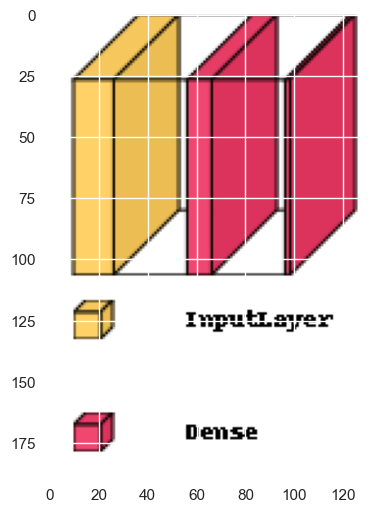

<Figure size 900x600 with 0 Axes>

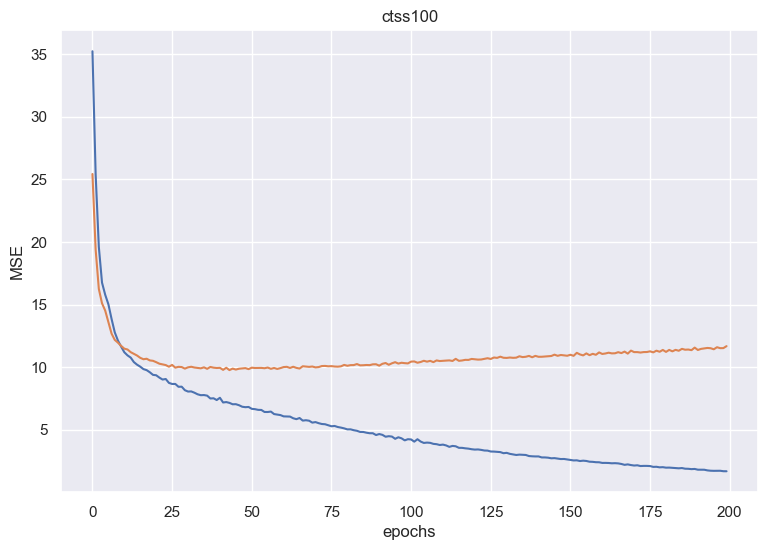

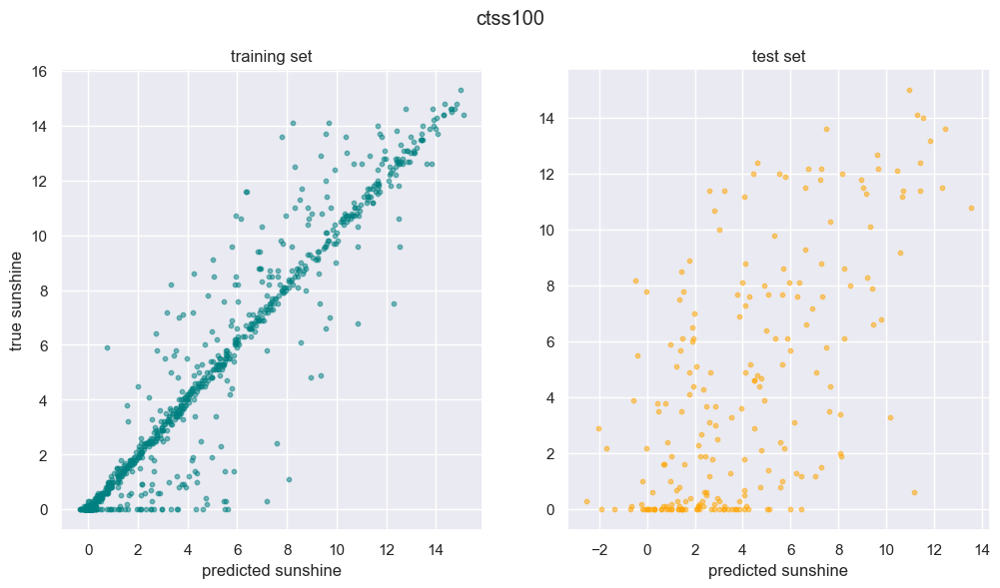

In [148]:
model_name = "100"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=[100],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, epochs=200, earlystop=False,
                               multiple=True, plot_history=True, plot_regression=True, plot_model=True)
round(error_df, 4)

Loading previously trained model ctss100-50.h5
28/28 [==============================] - 0s 859us/step


Training model ctss100-50


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100-50-10.h5


Best result is for ctss100-50 with testR2 0.3970
Training model ctss100-50-10


7/7 [==============================] - 0s 1ms/step


Best result is for ctss100-50-10 with testR2 0.3625


,trainMSE,testMSE,trainR2,testR2
ctss100-50,0.0631,11.1465,0.9968,0.3970
ctss100-50-10,0.2266,11.7842,0.9885,0.3625


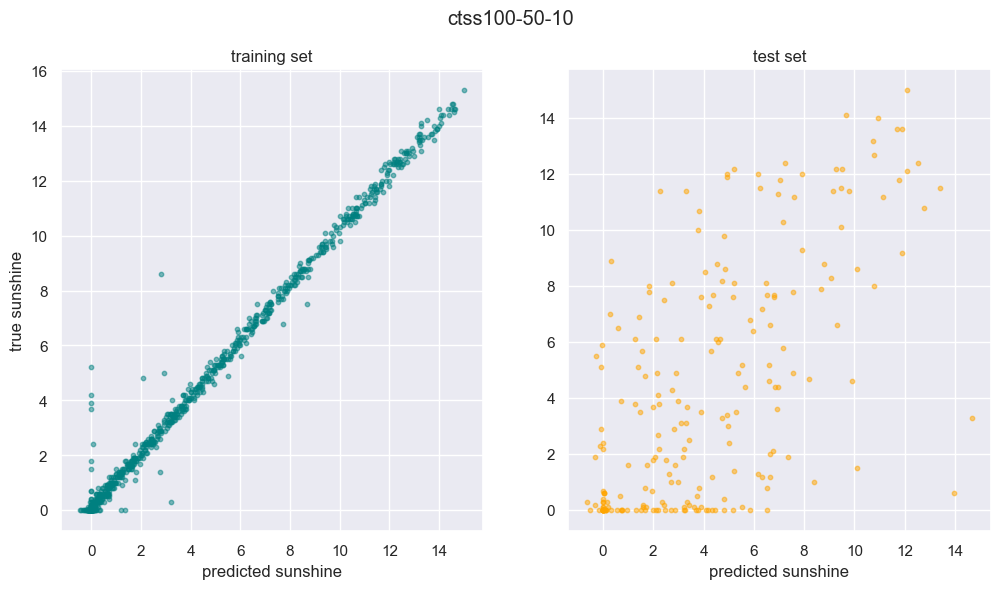

In [149]:
model_name = "100-50"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=[100, 50],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, earlystop=False, multiple=True)

model_name = "100-50-10"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=[100, 50, 10],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, earlystop=False, multiple=True, plot_regression=True)
round(errors_df.tail(2), 4)

### Adding early stopping to avoid overfitting

In [151]:
model_name = "100es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=[100],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100-50es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=[100, 50],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100-50-10es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=[100, 50, 10],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(errors_df.tail(3), 4)

Loading previously trained model ctss100es.h5
28/28 [==============================] - 0s 800us/step


Training model ctss100es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100-50es.h5
 1/28 [>.............................] - ETA: 1s

Best result is for ctss100es with testR2 0.4615
Training model ctss100-50es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100-50-10es.h5


Best result is for ctss100-50es with testR2 0.4834
Training model ctss100-50-10es


7/7 [==============================] - 0s 1ms/step


Best result is for ctss100-50-10es with testR2 0.5019


,trainMSE,testMSE,trainR2,testR2
ctss100es,6.6627,9.9546,0.6633,0.4615
ctss100-50es,5.4971,9.5499,0.7222,0.4834
ctss100-50-10es,5.5362,9.2072,0.7202,0.5019


### Adding batch normalisation

In [174]:
from tensorflow.keras.layers import BatchNormalization

In [152]:
model_name = "bn100es"
batch_size
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', 100],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "bn100-50es"
batch_size
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', 100, 50],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "bn100-50-10es"
batch_size
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', 100, 50, 10],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

round(errors_df.tail(3), 4)

Loading previously trained model ctssbn100es.h5
28/28 [==============================] - 0s 823us/step


Training model ctssbn100es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctssbn100-50es.h5


Best result is for ctssbn100es with testR2 0.4751
Training model ctssbn100-50es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctssbn100-50-10es.h5


Best result is for ctssbn100-50es with testR2 0.4993
Training model ctssbn100-50-10es


7/7 [==============================] - 0s 1ms/step


Best result is for ctssbn100-50-10es with testR2 0.4927


,trainMSE,testMSE,trainR2,testR2
ctssbn100es,7.1600,9.7019,0.6381,0.4751
ctssbn100-50es,5.9262,9.2559,0.7005,0.4993
ctssbn100-50-10es,6.3825,9.3781,0.6774,0.4927


## DLRegularisation
[back to ToC](#Contents)

### Adding L1 regularisation

In [176]:
model_name = "100l1-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl1'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l1-50l1-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl1', '50rl1'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l1-50l1-10l1-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl1', '50rl1', '10rl1'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "bn100l1-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', '100rl1'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "bn100l1-50l1-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', '100rl1', '50rl1'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "bn100l1-50l1-10l1-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', '100rl1', '50rl1', '10rl1'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(errors_df.tail(6), 4)

Loading previously trained model ctss100l1-es.h5
 1/28 [>.............................] - ETA: 1s

Training model ctss100l1-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l1-50l1-es.h5


Best result is for ctss100l1-es with testR2 0.5144
Training model ctss100l1-50l1-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l1-50l1-10l1-es.h5


Best result is for ctss100l1-50l1-es with testR2 0.4794
Training model ctss100l1-50l1-10l1-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctssbn100l1-es.h5


Best result is for ctss100l1-50l1-10l1-es with testR2 0.4862
Training model ctssbn100l1-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctssbn100l1-50l1-es.h5


Best result is for ctssbn100l1-es with testR2 0.5060
Training model ctssbn100l1-50l1-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctssbn100l1-50l1-10l1-es.h5


Best result is for ctssbn100l1-50l1-es with testR2 0.4807
Training model ctssbn100l1-50l1-10l1-es


7/7 [==============================] - 0s 1ms/step


Best result is for ctssbn100l1-50l1-10l1-es with testR2 0.4784


,trainMSE,testMSE,trainR2,testR2
ctss100l1-es,8.8455,8.9759,0.5530,0.5144
ctss100l1-50l1-es,7.6382,9.6231,0.6140,0.4794
ctss100l1-50l1-10l1-es,8.1869,9.4979,0.5862,0.4862
ctssbn100l1-es,9.0152,9.1314,0.5444,0.5060
ctssbn100l1-50l1-es,7.6983,9.5986,0.6109,0.4807
ctssbn100l1-50l1-10l1-es,8.3709,9.6415,0.5769,0.4784


### L1 regularisation and dropout

In [177]:
model_name = "100l1d40-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl1', 'd40'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l1d40-50l1d10-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl1', 'd40', '50rl1', 'd10'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l1d40-50l1d10-10l1d10-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl1', 'd40', '50rl1', 'd10', '10rl1', 'd10'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(errors_df.tail(3), 4)


Loading previously trained model ctss100l1d40-es.h5
 1/28 [>.............................] - ETA: 1s

Training model ctss100l1d40-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l1d40-50l1d10-es.h5


Best result is for ctss100l1d40-es with testR2 0.5031
Training model ctss100l1d40-50l1d10-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l1d40-50l1d10-10l1d10-es.h5


Best result is for ctss100l1d40-50l1d10-es with testR2 0.5058
Training model ctss100l1d40-50l1d10-10l1d10-es


7/7 [==============================] - 0s 970us/step


Best result is for ctss100l1d40-50l1d10-10l1d10-es with testR2 0.4846


,trainMSE,testMSE,trainR2,testR2
ctss100l1d40-es,9.2602,9.1853,0.5320,0.5031
ctss100l1d40-50l1d10-es,9.1309,9.1358,0.5385,0.5058
ctss100l1d40-50l1d10-10l1d10-es,8.9690,9.5264,0.5467,0.4846


### L2 regularisation without and with dropout

In [178]:
model_name = "100l2-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl2'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)


model_name = "100l2-50l2-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl2', '50rl2'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)


model_name = "100l2-50l2-10l2-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl2', '50rl2', '10rl2'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l2d40-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl2', 'd40'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l2d40-50l2d10-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl2', 'd40', '50rl2', 'd10'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l2d40-50l2d10-10l2-d10-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl2', 'd40', '50rl2', 'd10', '10rl2', 'd10'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(errors_df.tail(6), 4)

Loading previously trained model ctss100l2-es.h5
 1/28 [>.............................] - ETA: 1s

Training model ctss100l2-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l2-50l2-es.h5


Best result is for ctss100l2-es with testR2 0.4680
Training model ctss100l2-50l2-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l2-50l2-10l2-es.h5


Best result is for ctss100l2-50l2-es with testR2 0.4691
Training model ctss100l2-50l2-10l2-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l2d40-es.h5
 1/28 [>.............................] - ETA: 1s

Best result is for ctss100l2-50l2-10l2-es with testR2 0.4119
Training model ctss100l2d40-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l2d40-50l2d10-es.h5


Best result is for ctss100l2d40-es with testR2 0.4792
Training model ctss100l2d40-50l2d10-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l2d40-50l2d10-10l2-d10-es.h5


Best result is for ctss100l2d40-50l2d10-es with testR2 0.4645
Training model ctss100l2d40-50l2d10-10l2-d10-es


7/7 [==============================] - 0s 1ms/step


Best result is for ctss100l2d40-50l2d10-10l2-d10-es with testR2 0.4495


,trainMSE,testMSE,trainR2,testR2
ctss100l2-es,5.1553,9.8344,0.7395,0.4680
ctss100l2-50l2-es,2.9572,9.8138,0.8505,0.4691
ctss100l2-50l2-10l2-es,3.5921,10.8707,0.8185,0.4119
ctss100l2d40-es,6.0001,9.6261,0.6968,0.4792
ctss100l2d40-50l2d10-es,3.2336,9.8991,0.8366,0.4645
ctss100l2d40-50l2d10-10l2-d10-es,4.3188,10.1757,0.7817,0.4495


### L1_L2 regularisation

In [179]:
model_name = "100l3-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl3'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l3-50l3-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl3', '50rl3'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l3-50l3-10l3-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl3', '50rl3', '10rl3'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l3d40-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl3', 'd40'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l3d40-50l3d10-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl3', 'd40', '50rl3', 'd10'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "100l3d40-50l3d10-10l3-d10-es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['100rl3', 'd40', '50rl3', 'd10', '10rl3', 'd10'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(errors_df.tail(6), 4)

Loading previously trained model ctss100l3-es.h5
 1/28 [>.............................] - ETA: 1s

Training model ctss100l3-es


7/7 [==============================] - 0s 951us/step
Loading previously trained model ctss100l3-50l3-es.h5


Best result is for ctss100l3-es with testR2 0.5140
Training model ctss100l3-50l3-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l3-50l3-10l3-es.h5


Best result is for ctss100l3-50l3-es with testR2 0.4813
Training model ctss100l3-50l3-10l3-es


7/7 [==============================] - 0s 992us/step
Loading previously trained model ctss100l3d40-es.h5
 1/28 [>.............................] - ETA: 1s

Best result is for ctss100l3-50l3-10l3-es with testR2 0.4708
Training model ctss100l3d40-es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss100l3d40-50l3d10-es.h5


Best result is for ctss100l3d40-es with testR2 0.5158
Training model ctss100l3d40-50l3d10-es


7/7 [==============================] - 0s 949us/step
Loading previously trained model ctss100l3d40-50l3d10-10l3-d10-es.h5


Best result is for ctss100l3d40-50l3d10-es with testR2 0.4863
Training model ctss100l3d40-50l3d10-10l3-d10-es


7/7 [==============================] - 0s 1ms/step


Best result is for ctss100l3d40-50l3d10-10l3-d10-es with testR2 0.4954


,trainMSE,testMSE,trainR2,testR2
ctss100l3-es,9.0406,8.9845,0.5431,0.5140
ctss100l3-50l3-es,8.1907,9.5889,0.5860,0.4813
ctss100l3-50l3-10l3-es,8.4090,9.7817,0.5750,0.4708
ctss100l3d40-es,9.2234,8.9500,0.5339,0.5158
ctss100l3d40-50l3d10-es,8.9537,9.4950,0.5475,0.4863
ctss100l3d40-50l3d10-10l3-d10-es,9.1868,9.3275,0.5357,0.4954


## DeeperWider
[back to ToC](#Contents)

### Going deeper (interleaving 2 more hidden layers)

In [180]:
model_name = "bn100l2-d40-75l2-d30-50l2-d20-25l2-d10-10l2-d10es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['n', '100rl2', 'd40', '75rl2', 'd30', '50rl2', 'd20', '25rl2', 'd10', '10rl2', 'd10'],
                  model_name=model_name, output_activation=None)
#model.summary()
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(error_df, 4)

Loading previously trained model ctssbn100l2-d40-75l2-d30-50l2-d20-25l2-d10-10l2-d10es.h5


Training model ctssbn100l2-d40-75l2-d30-50l2-d20-25l2-d10-10l2-d10es


7/7 [==============================] - 0s 1ms/step


Best result is for ctssbn100l2-d40-75l2-d30-50l2-d20-25l2-d10-10l2-d10es with testR2 0.4504


,trainMSE,testMSE,trainR2,testR2
ctssbn100l2-d40-75l2-d30-50l2-d20-25l2-d10-10l2-d10es,3.8368,10.1591,0.8061,0.4504


### Going wider (x2 layer sizes)

In [181]:
model_name = "200l2d40es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['200rl2', 'd40'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "300l2d40es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['300rl2', 'd40'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)

model_name = "400l2d40es"
model = create_dense(input_size=X_train.shape[1], output_size=1,
                  hidden_layers_sizes=['400rl2', 'd40'],
                  model_name=model_name, output_activation=None)
error_df, *_ = train_and_score(model, model_name, X_train, y_train, X_test, y_test, multiple=True, plot_regression=False)
round(errors_df.tail(3), 4)

Loading previously trained model ctss200l2d40es.h5


Training model ctss200l2d40es


7/7 [==============================] - 0s 981us/step
Loading previously trained model ctss300l2d40es.h5


Best result is for ctss200l2d40es with testR2 0.4854
Training model ctss300l2d40es


7/7 [==============================] - 0s 1ms/step
Loading previously trained model ctss400l2d40es.h5


Best result is for ctss300l2d40es with testR2 0.4858
Training model ctss400l2d40es


7/7 [==============================] - 0s 1ms/step


Best result is for ctss400l2d40es with testR2 0.4814


,trainMSE,testMSE,trainR2,testR2
ctss200l2d40es,5.2426,9.5121,0.7350,0.4854
ctss300l2d40es,4.8713,9.5055,0.7538,0.4858
ctss400l2d40es,4.9301,9.5869,0.7508,0.4814


### Training RNN

In [182]:
from keras import Sequential
trainX = X_train.values.reshape(X_train.shape[0],1,X_train.shape[1])
testX = X_test.values.reshape(X_test.shape[0],1,X_test.shape[1])

model_name = "R100es"
rnn_hidden_dim = 100

model = Sequential(name=model_name)
model.add(keras.layers.SimpleRNN(rnn_hidden_dim, input_shape=(trainX.shape[1:]), dropout=0,
                                kernel_initializer=keras.initializers.RandomNormal(stddev=0.001),
                                recurrent_initializer=keras.initializers.Identity(gain=1.0),
                                activation='relu'))
model.add(keras.layers.Dense(1))
error_df, *_ = train_and_score(model, model_name, trainX, y_train, testX, y_test, multiple=True, plot_regression=False)
round(error_df, 4)

Loading previously trained model ctssR100es.h5


Training model ctssR100es


7/7 [==============================] - 0s 1ms/step


Best result is for ctssR100es with testR2 0.4545


,trainMSE,testMSE,trainR2,testR2
ctssR100es,7.2385,10.0839,0.6342,0.4545


In [183]:
model_name = "R200es"
rnn_hidden_dim = 200

model = Sequential(name=model_name)
model.add(keras.layers.SimpleRNN(rnn_hidden_dim, input_shape=(trainX.shape[1:]), dropout=0,
                                kernel_initializer=keras.initializers.RandomNormal(stddev=0.001),
                                recurrent_initializer=keras.initializers.Identity(gain=1.0),
                                activation='relu'))
model.add(keras.layers.Dense(1))
error_df, *_ = train_and_score(model, model_name, trainX, y_train, testX, y_test, multiple=True, plot_regression=False)
round(error_df, 4)

Loading previously trained model ctssR200es.h5


Training model ctssR200es


7/7 [==============================] - 0s 1ms/step


Best result is for ctssR200es with testR2 0.4626


,trainMSE,testMSE,trainR2,testR2
ctssR200es,6.66,9.9331,0.6634,0.4626


# TimeSeries
[back to ToC](#Contents)
## Specialized Models: Time Series and Survival Analysis

Please refer to the  <a href='06.TimeSeries_courseproject_report_Giuseppe_Insana.pdf'>project report</a>

## Objective:
Main objective of the analysis that also specifies whether your model will be focused on a specific type of Time Series, Survival Analysis, or Deep Learning and the benefits that your analysis brings to the business or stakeholders of this data.

Brief description of the data set you chose, a summary of its attributes, and an outline of what you are trying to accomplish with this analysis.

Brief summary of data exploration and actions taken for data cleaning or feature engineering.

Summary of training at least three variations of the Time Series, Survival Analysis, or Deep Learning model you selected. For example, you can use different models or different hyperparameters.

A paragraph explaining which of your models you recommend as a final model that best fits your needs in terms of accuracy or explainability.

Summary Key Findings and Insights, which walks your reader through the main findings of your modeling exercise.

Suggestions for next steps in analyzing this data, which may include suggesting revisiting this model or adding specific data features to achieve a better model.

In [153]:
plt.rcParams['figure.figsize'] = [14, 4]
sns.set_style("whitegrid")

In [154]:
df = cleandata.copy()
df.set_index(pd.date_range('2000-01-01', '2009-12-31', freq='D'), inplace=True)
firstindex = df.head(1).index.values[0]
lastindex = df.tail(1).index.values[0]

In [155]:
#creation of columns for YEAR and DAY
df['YEAR']=df.index.year
df['DAY']=df.index.day
df['DOW']=df.index.dayofweek

### upsampling to week and month

In [156]:
df_yearly_sum = df[:-1].resample('A').sum()
df_yearly_avg = df[:-1].resample('A').mean()

df_monthly_sum = df[:-1].resample('M').sum()
df_weekly_sum = df[:-1].resample('W').sum()
df_monthly_avg = df[:-1].resample('M').mean()
df_weekly_avg = df[:-1].resample('W').mean()
df_monthly_std = df[:-1].resample('M').std()

## TSvisualisations
[back to ToC](#Contents)

In [188]:
timeseries_eda = True

In [157]:
city4plots = "BASEL"
measure4plots = "sunshine"
col4plots = city4plots + "_" + measure4plots
print("Starting time series visualisations for {}".format(col4plots))

Starting time series visualisations for BASEL_sunshine


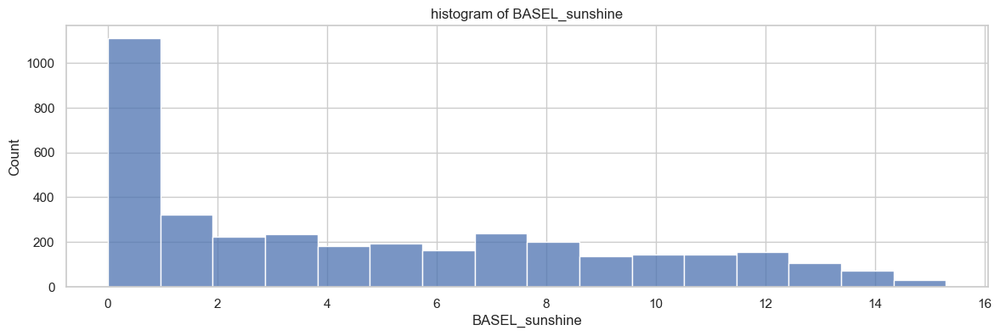

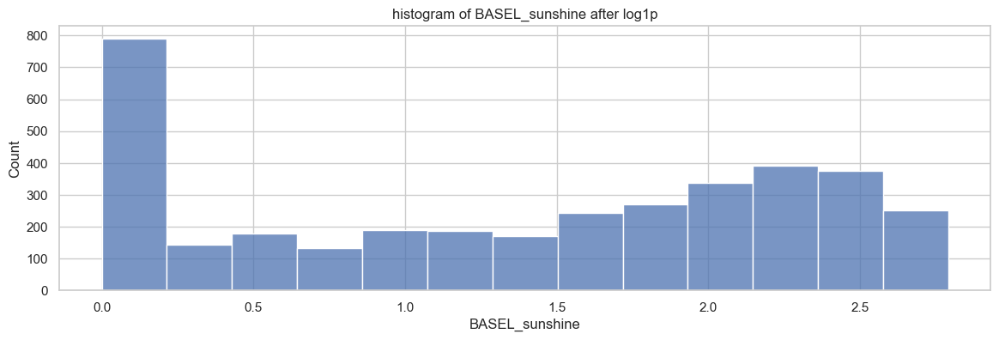

In [190]:
if timeseries_eda:
    sns.histplot(df[col4plots]).set_title("histogram of {}".format(col4plots))
    plt.show()
    sns.histplot(np.log1p(df[col4plots])).set_title("histogram of {} after log1p".format(col4plots))

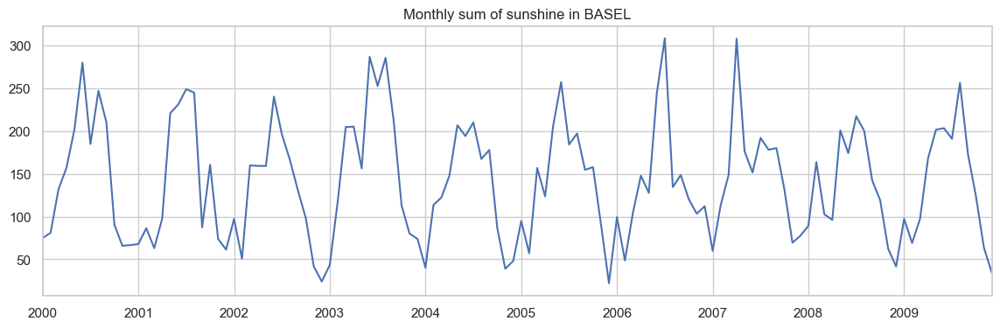

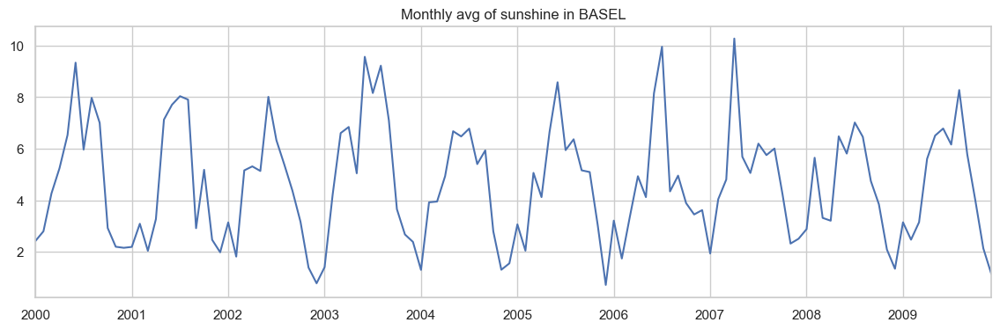

In [191]:
if timeseries_eda:
    df_monthly_sum[col4plots].plot(title='Monthly sum of {} in {}'.format(measure4plots, city4plots))
    plt.show()
    df_monthly_avg[col4plots].plot(title='Monthly avg of {} in {}'.format(measure4plots, city4plots))

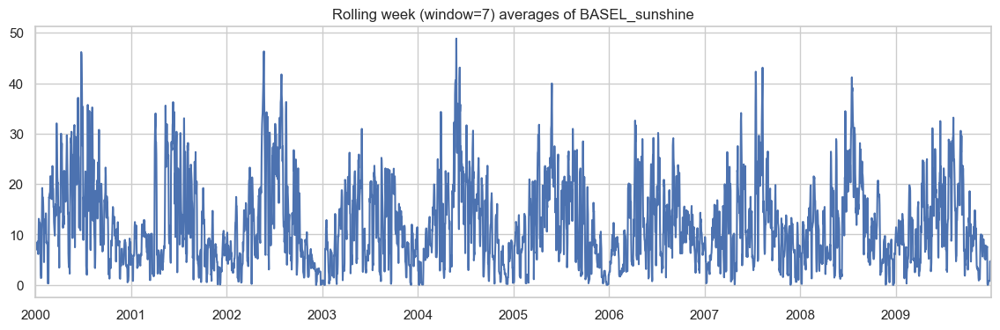

In [192]:
#rolling averages
if timeseries_eda:
    window_size = 7
    rolling_window = df.rolling(window_size)
    rolling_window[col4plots].var().plot(title='Rolling week (window=7) averages of {}'.format(col4plots))

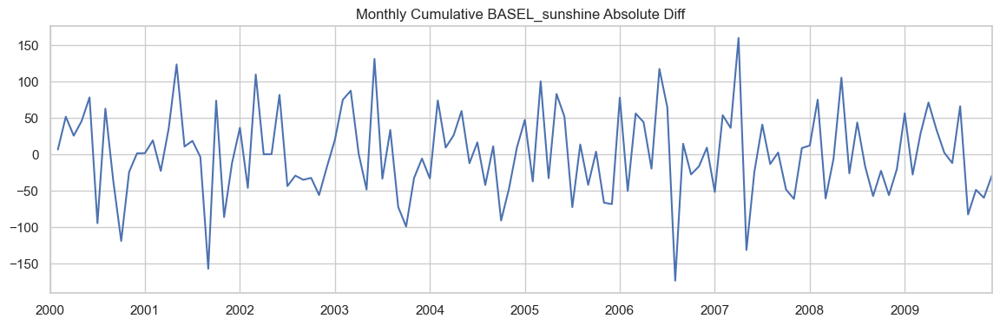

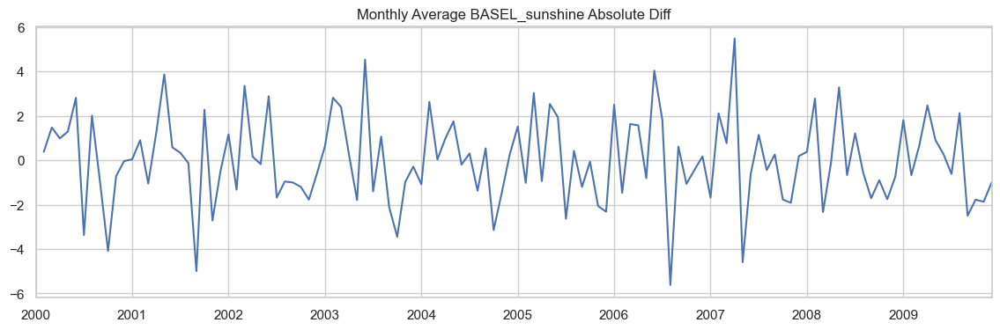

In [193]:
#aggregations
if timeseries_eda:
    df_monthly_sum[col4plots].diff().plot(title='Monthly Cumulative {} Absolute Diff'.format(col4plots))
    plt.show()
    df_monthly_avg[col4plots].diff().plot(title='Monthly Average {} Absolute Diff'.format(col4plots))


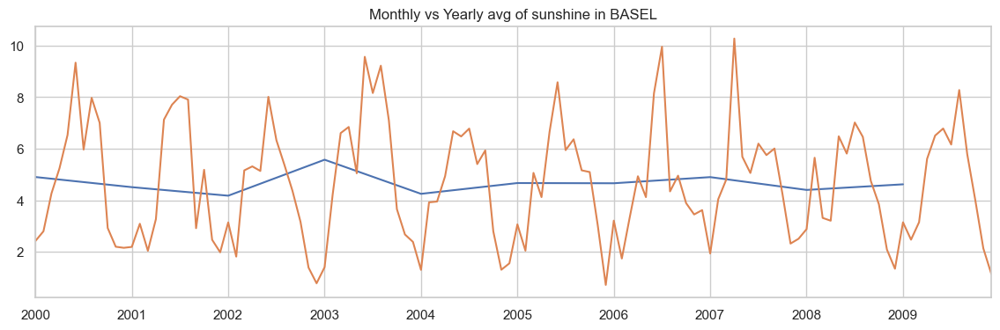

In [194]:
# Monthly vs yearly interpolation
if timeseries_eda:
    df_yearly_avg[col4plots].plot(title='Yearly avg of {} in {}'.format(measure4plots, city4plots))
    df_monthly_avg[col4plots].plot(title='Monthly vs Yearly avg of {} in {}'.format(measure4plots, city4plots))


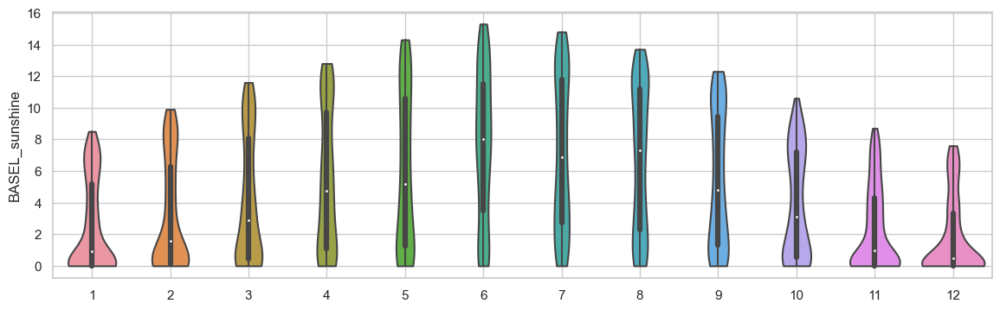

In [195]:
#Monthly variance
if timeseries_eda:
    sns.violinplot(cut=0, x=df.index.month, y=df[col4plots])
plt.grid(visible=True)

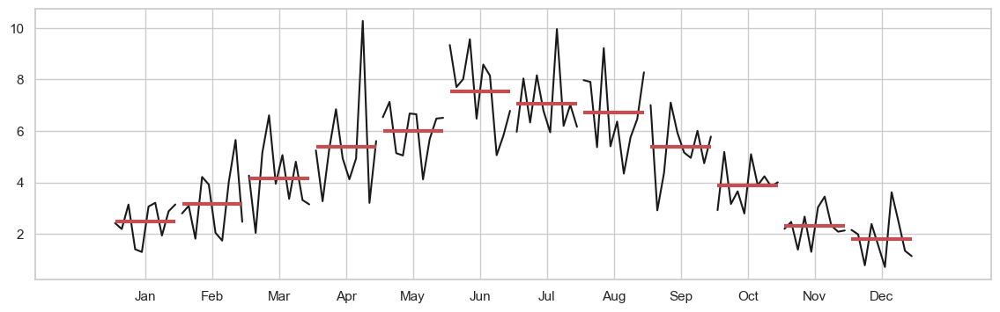

In [196]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot
#month plot
if timeseries_eda:
    m_plot = month_plot(df_monthly_avg[col4plots])

### Decomposition

In [197]:
decomposition = True
if decomposition:
    from statsmodels.tsa.seasonal import seasonal_decompose
    ss_decomposition = seasonal_decompose(x=df_monthly_avg[col4plots], model='additive', period=12)
    estimated_trend = ss_decomposition.trend
    estimated_seasonal = ss_decomposition.seasonal
    estimated_residual = ss_decomposition.resid

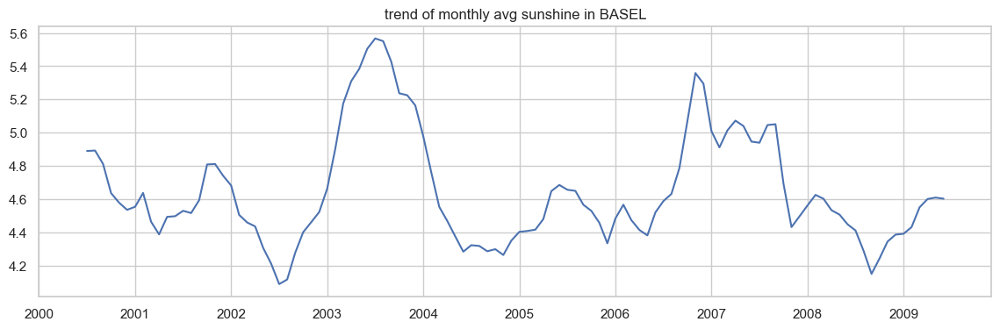

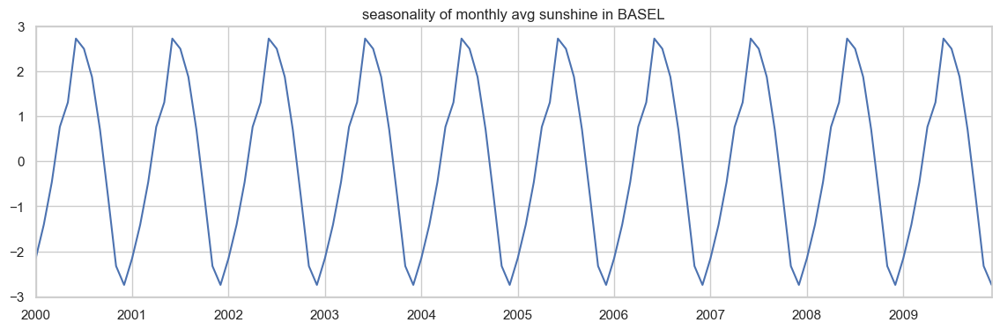

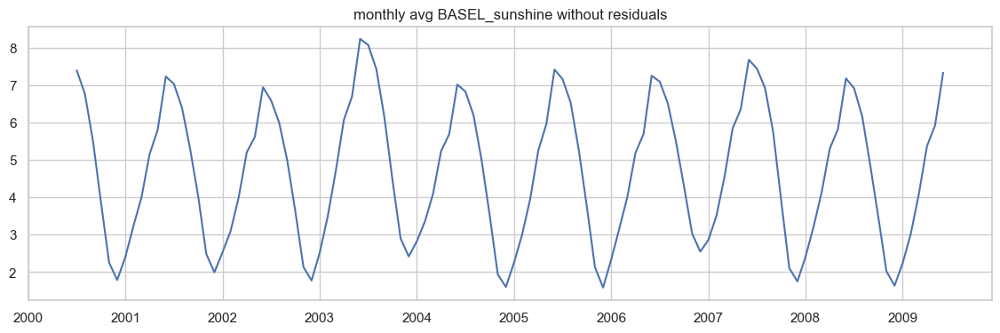

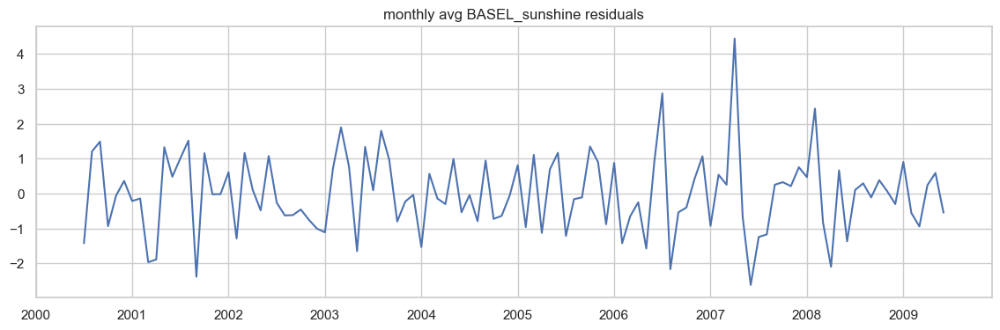

In [198]:
if decomposition:
    estimated_trend.plot(title='trend of monthly avg {} in {}'.format(measure4plots, city4plots))
    plt.show()
    estimated_seasonal.plot(title='seasonality of monthly avg {} in {}'.format(measure4plots, city4plots))
    plt.show()
    estimated_smoothed = estimated_trend + estimated_seasonal
    estimated_smoothed.plot(title='monthly avg {} without residuals'.format(col4plots))
    plt.show()
    estimated_residual.plot(title='monthly avg {} residuals'.format(col4plots))

### Correlation plots

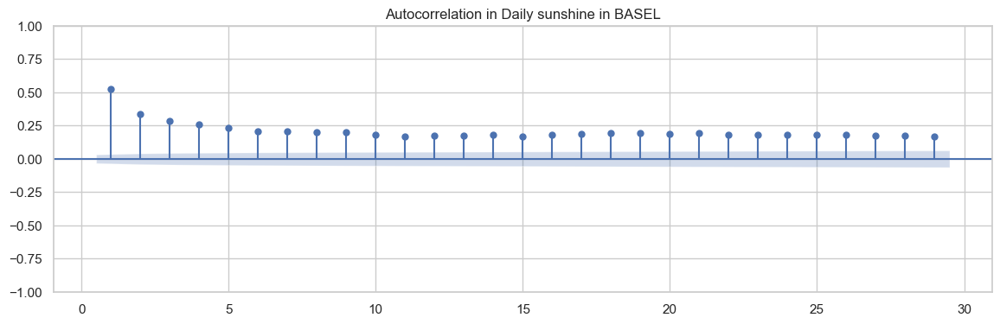

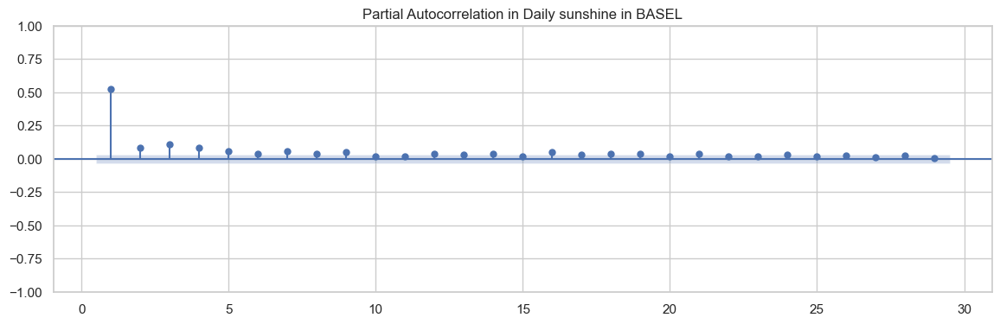

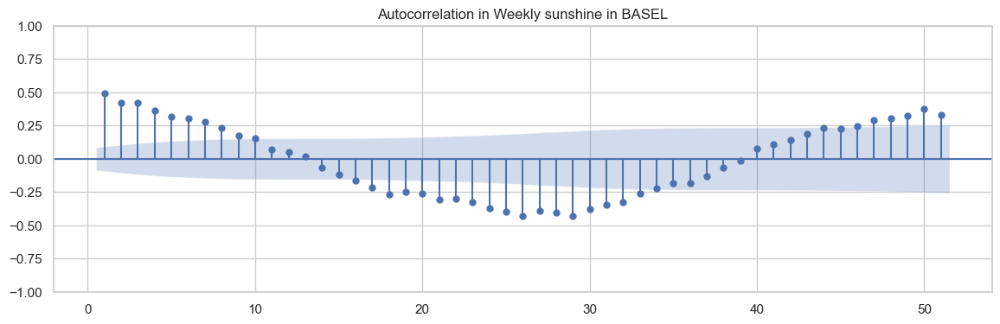

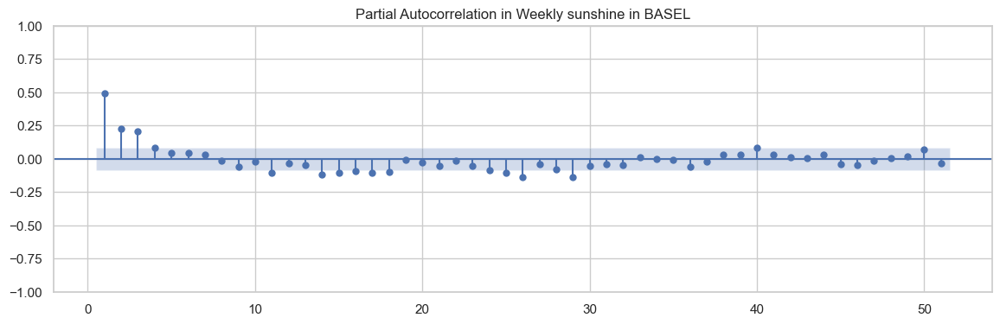

In [199]:
corr_plots = True
if corr_plots:
    acf_plot = plot_acf(df[col4plots], lags=range(1,30), alpha=0.05, title='Autocorrelation in Daily {} in {}'.format(measure4plots, city4plots))
    pacf_plot = plot_pacf(df[col4plots], lags=range(1,30), alpha=0.05, title='Partial Autocorrelation in Daily {} in {}'.format(measure4plots, city4plots), method='ywm')
    
    acf_plot = plot_acf(df_weekly_avg[col4plots], lags=range(1,52), alpha=0.05, title='Autocorrelation in Weekly {} in {}'.format(measure4plots, city4plots))
    pacf_plot = plot_pacf(df_weekly_avg[col4plots], lags=range(1,52), alpha=0.05, title='Partial Autocorrelation in Weekly {} in {}'.format(measure4plots, city4plots), method='ywm')


## Stationarity
[back to ToC](#Contents)
### Statistical test to check stationarity

In [200]:
do_test = True
if do_test:
    import statsmodels.tsa.stattools as ts
    def dftest(timeseries, title=None, window=12):
        '''
        Dickey-Fuller Test (DFT) function
        '''
        dftest = ts.adfuller(timeseries,)
        dfoutput = pd.Series(dftest[0:4], 
                             index=['Test Statistic','p-value','Lags Used','Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)
        #Determing rolling statistics
        rolmean = timeseries.rolling(window=window).mean()
        rolstd = timeseries.rolling(window=window).std()

        #Plot rolling statistics:
        orig = plt.plot(timeseries, color='blue',label='Original')
        mean = plt.plot(rolmean, color='red', label='Rolling Mean {}window'.format(window))
        std = plt.plot(rolstd, color='black', label = 'Rolling Std {}window'.format(window))
        plt.legend(loc='best')
        if title is None:
            plt.title('Rolling Mean and Standard Deviation')
        else:
            plt.title(title)
        plt.grid()
        plt.show(block=False)


Test Statistic         -6.591790e+00
p-value                 7.084465e-09
Lags Used               2.300000e+01
Observations Used       3.629000e+03
Critical Value (1%)    -3.432153e+00
Critical Value (5%)    -2.862337e+00
Critical Value (10%)   -2.567194e+00
dtype: float64


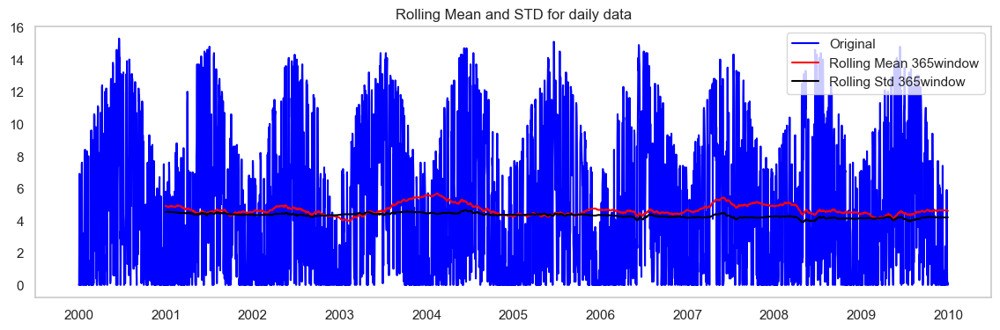

In [201]:
if do_test:
    dftest(df[col4plots], title='Rolling Mean and STD for daily data', window=365)

Test Statistic         -9.884009e+00
p-value                 3.705232e-17
Lags Used               6.000000e+00
Observations Used       1.130000e+02
Critical Value (1%)    -3.489590e+00
Critical Value (5%)    -2.887477e+00
Critical Value (10%)   -2.580604e+00
dtype: float64


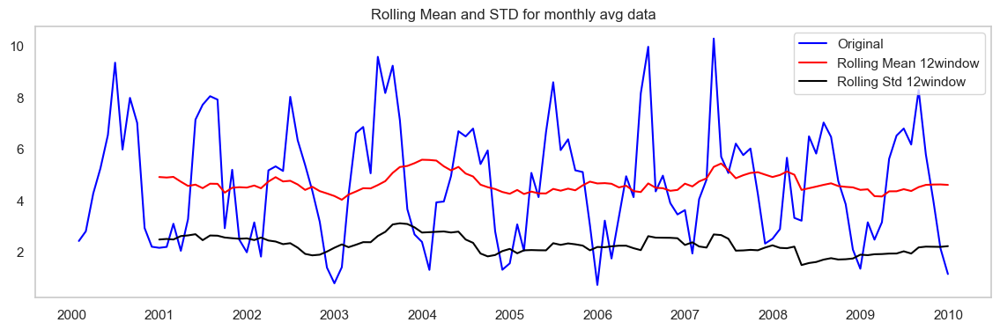

In [202]:
if do_test:
    dftest(df_monthly_avg[col4plots], title='Rolling Mean and STD for monthly avg data', window=12)

Test Statistic         -0.229529
p-value                 0.934909
Lags Used               3.000000
Observations Used       6.000000
Critical Value (1%)    -5.354256
Critical Value (5%)    -3.646238
Critical Value (10%)   -2.901198
dtype: float64


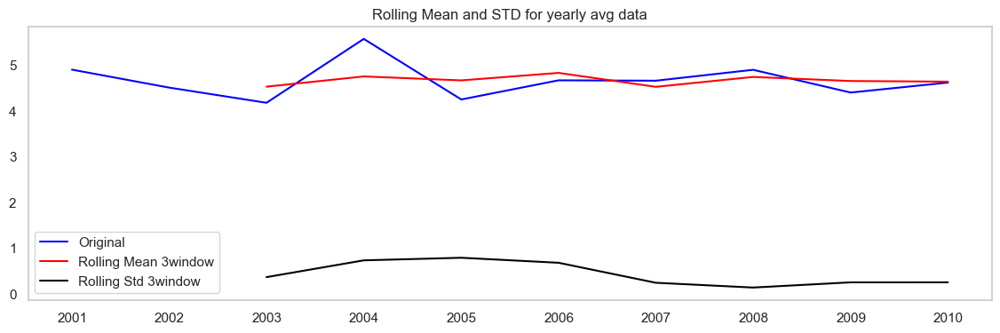

In [203]:
if do_test:
    dftest(df_yearly_avg[col4plots], title='Rolling Mean and STD for yearly avg data', window=3)

## ExponentialSmoothing
[back to ToC](#Contents)

In [204]:
from statsmodels.tsa.api import ExponentialSmoothing
exp_smoothing = True
if exp_smoothing:
    smoothed = ExponentialSmoothing(df[col4plots],damped_trend=False,
                                  trend="add",
                                  seasonal="add",
                                  seasonal_periods=365).fit(optimized=True)
    print("MSE with smoothed: ", mean_squared_error(df[col4plots], smoothed.fittedvalues))
    print("MSE with lag+1 average: ", mean_squared_error(df[col4plots][:-1], df[col4plots][1:]))
    print("MSE with lag+2 average: ", mean_squared_error(df[col4plots][:-2], df[col4plots][2:]))
    print("MSE with weekly average: ", mean_squared_error(df[col4plots], df_weekly_avg[col4plots].resample('D').interpolate()[:-2]))
    print("MSE with monthly average: ", mean_squared_error(df[col4plots][:-31], df_monthly_avg[col4plots].resample('D').interpolate()[:-1]))


MSE with smoothed:  12.984287632177733
MSE with lag+1 average:  17.783250273822564
MSE with lag+2 average:  24.87682552725281
MSE with weekly average:  11.320386083441498
MSE with monthly average:  15.037039227704332


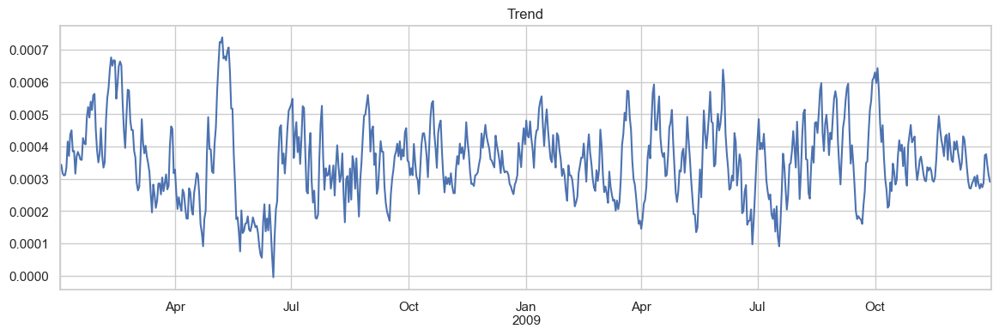

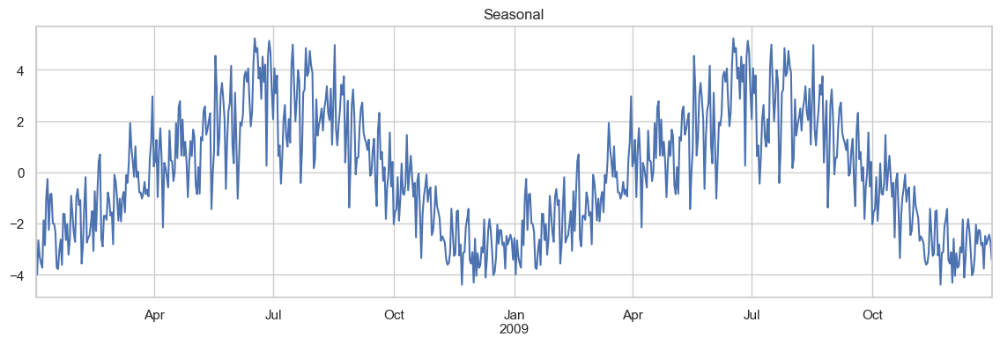

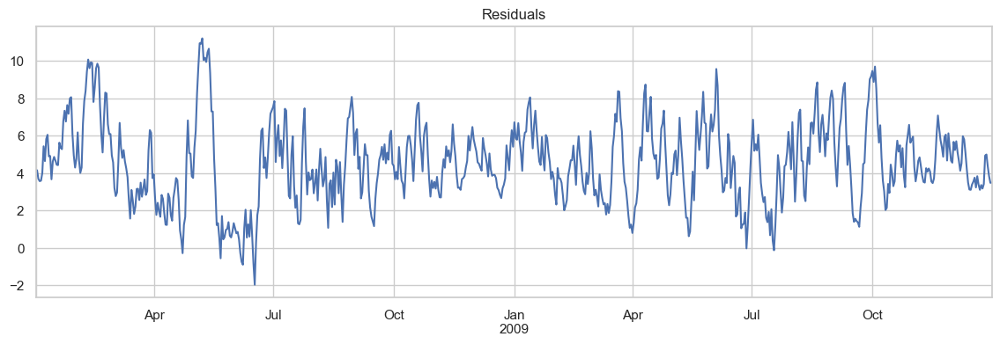

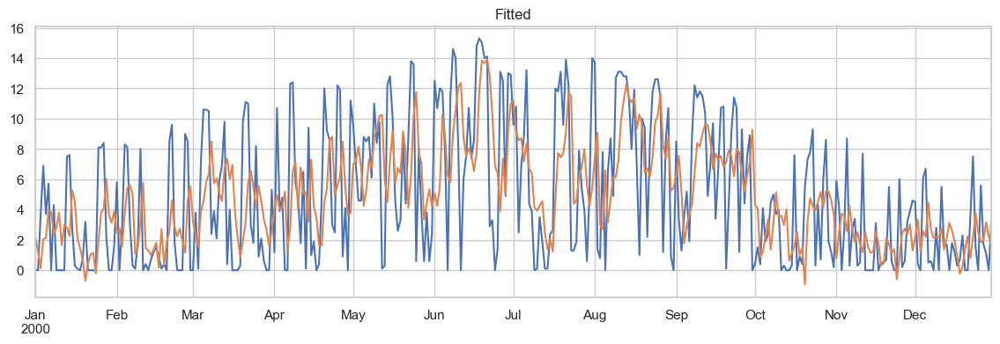

In [205]:
if exp_smoothing:
    #smoothed.fittedvalues[-365:].plot(title="Fitted")
    smoothed.trend[-730:].plot(title="Trend")
    plt.show()
    smoothed.season[-730:].plot(title="Seasonal")
    plt.show()
    smoothed.level[-730:].plot(title="Residuals")
    plt.show()
    
#additive model should match seasonal + trend + residuals:
#(smoothed.level[0:365] + smoothed.trend[0:365] + smoothed.season[0:365]).plot()
    df[col4plots][0:365].plot(title="Original")
    smoothed.fittedvalues[0:365].plot(title="Fitted")

## SARIMA
[back to ToC](#Contents)

In [206]:
sarima = True
if sarima and corr_plots:
    import statsmodels.api as sm
    def plots(data, lags=None):
        layout = (1, 3)
        raw  = plt.subplot2grid(layout, (0, 0))
        acf  = plt.subplot2grid(layout, (0, 1))
        pacf = plt.subplot2grid(layout, (0, 2))

        raw.plot(data)
        sm.tsa.graphics.plot_acf(data, lags=lags, ax=acf, zero=False)
        sm.tsa.graphics.plot_pacf(data, lags=lags, ax=pacf, zero = False, method='ywm')
        sns.despine()
        plt.tight_layout()
    # we note a 12-period cycle (yearly) with suspension bridge design, so must use SARIMA

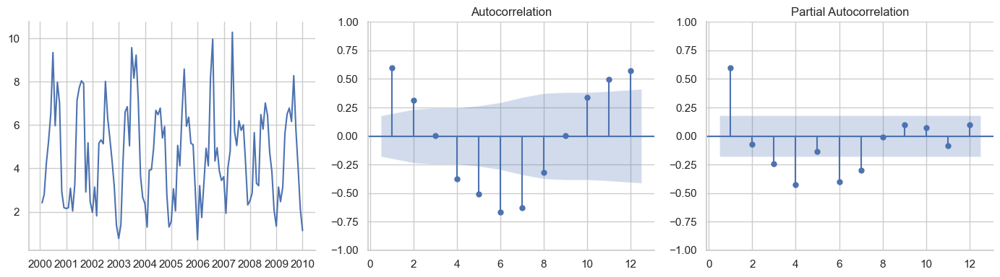

In [207]:
if sarima and corr_plots:
    plots(df_monthly_avg[col4plots], lags=12)

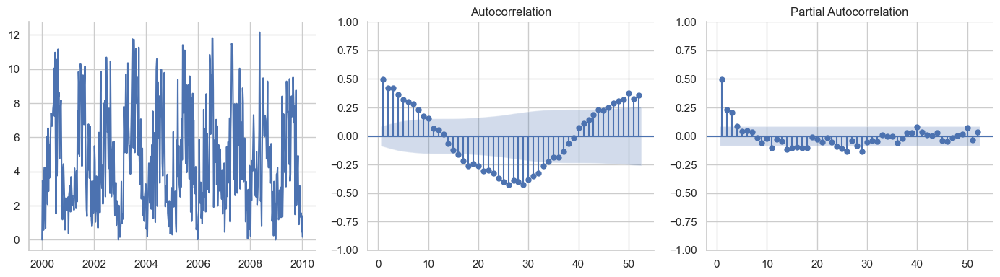

In [208]:
if sarima and corr_plots:
    plots(df_weekly_avg[col4plots], lags=52)

In [209]:
sarima = True
if sarima:
    import statsmodels.api as sm
    # fit SARIMA monthly based on helper plots
    sar = sm.tsa.statespace.SARIMAX(df_monthly_avg[col4plots],
                                    order=(0,0,0), 
                                    seasonal_order=(4,1,0,12), 
                                    trend='c').fit()
    sar.summary()

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67998D+00    |proj g|=  2.67866D-01

At iterate    5    f=  1.56044D+00    |proj g|=  4.77907D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6      9     12      1     0     0   3.226D-06   1.560D+00
  F =   1.5604296988034709     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


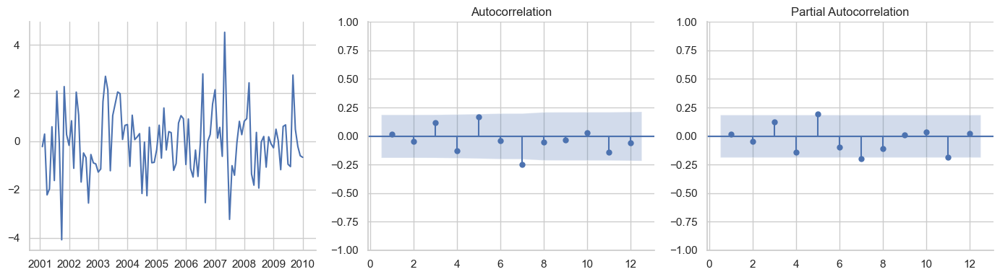

In [210]:
if sarima:
    #residuals
    plots(sar.resid[sar.loglikelihood_burn:], lags=12);

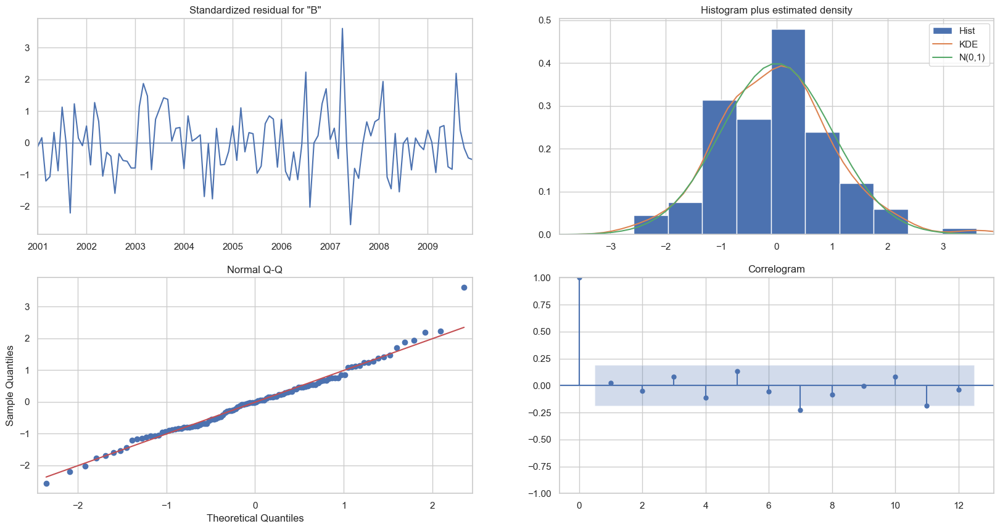

In [211]:
if sarima:
    sar.plot_diagnostics(lags=12,figsize = (20,10),);

In [212]:
if sarima:
    #statistical tests on model
    # create and run statistical tests on model
    norm_val, norm_p, skew, kurtosis = sar.test_normality('jarquebera')[0]
    lb_val, lb_p = sar.test_serial_correlation(method='ljungbox', lags=24)[0] #lags as 2 * seasonality period
    het_val, het_p = sar.test_heteroskedasticity('breakvar')[0]


    # we want to look at largest lag for Ljung-Box, so take largest number in series
    # there's intelligence in the method to determine how many lags back to calculate this stat
    lb_val = lb_val[-1]
    lb_p = lb_p[-1]
    durbin_watson = sm.stats.stattools.durbin_watson(
        sar.filter_results.standardized_forecasts_error[0, sar.loglikelihood_burn:])

    print('Normality: val={:.3f}, p={:.3f}'.format(norm_val, norm_p));
    print('Ljung-Box: val={:.3f}, p={:.3f}'.format(lb_val, lb_p));
    print('Heteroskedasticity: val={:.3f}, p={:.3f}'.format(het_val, het_p));
    print('Durbin-Watson: d={:.2f}'.format(durbin_watson))

Normality: val=5.956, p=0.051
Ljung-Box: val=24.705, p=0.422
Heteroskedasticity: val=1.250, p=0.507
Durbin-Watson: d=1.95


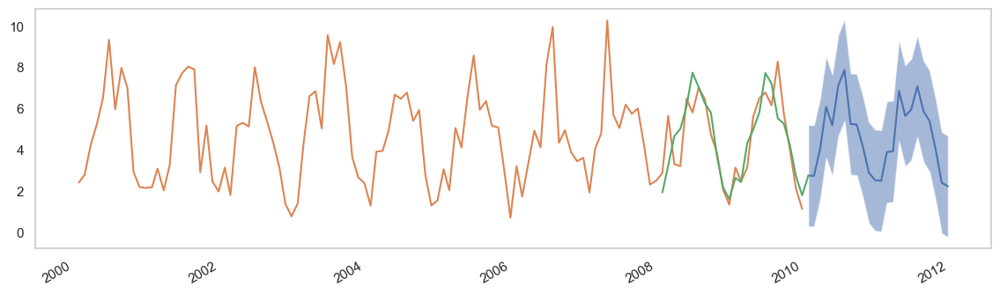

In [213]:
if sarima:
    # plot predictions and future forecast
    pd.plotting.register_matplotlib_converters()
    #use model.predict() start and end in relation to series
    future_fcst = sar.get_forecast(24) #future forecast
    confidence_int = future_fcst.conf_int(alpha = 0.05) #confidence interval
    fcst = future_fcst.predicted_mean
    plt.plot(fcst)
    plt.fill_between(confidence_int.index,confidence_int['lower '+col4plots],confidence_int['upper '+col4plots],alpha = 0.5)
    df_monthly_avg[col4plots].plot()
    sar.predict(start = 96, end= 120).plot()
    plt.grid()

### auto_arima

In [214]:
auto_arima = True
#find best parameters with gridsearch
if auto_arima:
    import pmdarima as pm
    stepwise_model = pm.auto_arima(df_monthly_avg[col4plots], start_p=1, start_q=1,
                               max_p=5, max_q=5, m=12,
                               start_P=0, seasonal=True,
                               d=0, D=1, max_P=5, max_Q=5, trace=True,
                               error_action='ignore',  
                               suppress_warnings=True, 
                               stepwise=True)
    print(stepwise_model.aic())
    stepwise_model.summary()

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=447.634, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=421.387, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=445.668, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=449.028, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=402.547, Time=0.28 sec
 ARIMA(1,0,0)(3,1,0)[12] intercept   : AIC=388.292, Time=0.56 sec
 ARIMA(1,0,0)(4,1,0)[12] intercept   : AIC=388.436, Time=1.10 sec
 ARIMA(1,0,0)(3,1,1)[12] intercept   : AIC=388.895, Time=1.19 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=390.195, Time=0.44 sec
 ARIMA(1,0,0)(4,1,1)[12] intercept   : AIC=inf, Time=4.55 sec
 ARIMA(0,0,0)(3,1,0)[12] intercept   : AIC=386.602, Time=0.42 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=400.664, Time=0.19 sec
 ARIMA(0,0,0)(4,1,0)[12] intercept   : AIC=38

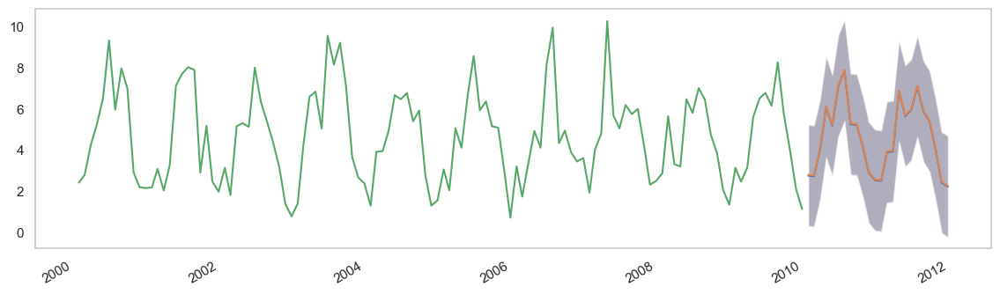

In [215]:
if auto_arima:
    #comparing predictions of the stepwise pdarima auto model with the SARIMAX model
    fcst2 = pd.DataFrame(fcst[0:24].copy())
    fcst2['mean'], fcst2[['low', 'high']] = stepwise_model.predict(n_periods=24, return_conf_int=True)
    plt.plot(fcst)
    plt.fill_between(confidence_int.index,confidence_int['lower '+col4plots],confidence_int['upper '+col4plots],alpha = 0.5)
    plt.plot(fcst2['mean'])
    plt.fill_between(fcst2.index, fcst2['low'], fcst2['high'],alpha = 0.2)
    df_monthly_avg[col4plots].plot()
    plt.grid()


## TS_DL
[back to ToC](#Contents)
### DeepLearning of TimeSeries via RNN and LSTM

In [158]:
from keras import Sequential
from keras.callbacks import EarlyStopping, Callback
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import LSTM
from keras.layers import SimpleRNN
from keras.regularizers import l1, l2
from keras.preprocessing.sequence import TimeseriesGenerator

In [159]:
#important settings and hyper parameters

SEED = 42
days_to_forecast = 1 #we will forecast one day into the future

CTskew_limit = 0.75 #43 cols (if applied before train/test split)
#CTskew_limit = 0.5 #70 cols (if applied before train/test split)

In [160]:
city4prediction = "BASEL"
measure4prediction = "sunshine"
col4prediction = city4prediction + "_" + measure4prediction
reduced_data = True
includeMonth = True
X_data, y_data, X_data_ori, untilindex = initialize_data(df, city4prediction, measure4prediction,
                                                         reduced_data=reduced_data,
                                                         includeMonth=includeMonth, timeseries=True)

*** We aim to predict tomorrow's 'sunshine' measure in 'BASEL' based on today's weather data for all locations and month information
Data size: X=(1098, 165) Y=(1098,)
            MONTH  BASEL_cloud_cover  BASEL_humidity  BASEL_pressure  \
2000-01-01      1                  8            0.89          1.0286   
2000-01-02      1                  8            0.87          1.0318   
2000-01-03      1                  5            0.81          1.0314   
2000-01-04      1                  7            0.79          1.0262   
2000-01-05      1                  5            0.90          1.0246   

            BASEL_global_radiation  BASEL_precipitation  BASEL_sunshine  
2000-01-01                    0.20                 0.03             0.0  
2000-01-02                    0.25                 0.00             0.0  
2000-01-03                    0.50                 0.00             3.7  
2000-01-04                    0.63                 0.35             6.9  
2000-01-05                   

In [161]:
scale_and_tranform = True
if scale_and_tranform:
    ctss_transf = Pipeline([
        ("transformer", col_transformer(X_data, measure_columns)),
        ("scaler", StandardScaler()),
    ])
    X_data_transformed = ctss_transf.fit_transform(X_data)
else:
    eprint("Attention, not scaling nor transforming the input data")
    if only_measure:
        X_data_transformed = X_data[col4prediction].to_numpy().reshape(-1,1)
    else:
        X_data_transformed = X_data.to_numpy()
    


In [162]:
from sklearn.model_selection import train_test_split
 
#we set aside 20% of the data to test the accuracy of our models
#NOTE: we must use Shuffle False as we need to keep the time data sequential

test_set_as_last = True
if test_set_as_last: #if last 20% of data as test:
    X_train, X_test, y_train, y_test = train_test_split(X_data_transformed, y_data,
                                                        test_size=0.2, shuffle=False)
else: #if beginning 20% as test
    X_test, X_train, y_test, y_train = train_test_split(X_data_transformed, y_data,
                                                        test_size=0.8, shuffle=False)
    
(X_train.shape, X_test.shape)

((878, 165), (220, 165))

In [163]:
### If we wanted to use Cross validation, we'd need TimeSeriesSplit
crossval = False
if crossval:
    if reduced_data:
        folds = 2
        validation_size = min(200,len(X_data)//4)
    else:
        folds = 3
        validation_size = 365
    from sklearn.model_selection import TimeSeriesSplit
    tscv = TimeSeriesSplit(n_splits=folds, test_size=validation_size)
    print("We will use the following crossvalidation folds and sizes:")
    for train, val in tscv.split(X_train):
        print("train {} val {}".format(len(train), len(val)))

In [164]:
def score_model_ts(model, model_name, X_train, y_train, X_test, y_test):
    #ensure to unshuffle the timeseries sets (in case they were generated with shuffle=True)
    train_data_generator = TimeseriesGenerator(X_train, y_train, length=lag_size, batch_size=batch_size, shuffle=False)
    test_data_generator = TimeseriesGenerator(X_test, y_test, length=lag_size, batch_size=batch_size, shuffle=False)
    
    #make predictions
    y_train_pred = model.predict(train_data_generator)
    y_test_pred = model.predict(test_data_generator)
    
    #set index copying from true data
    y_train_pred = pd.DataFrame(y_train_pred).set_index(y_train.index[lag_size:])
    y_test_pred = pd.DataFrame(y_test_pred).set_index(y_test.index[lag_size:])

    error_df=pd.DataFrame(
    {
        #note: we use tail(len..) to ensure to not consider the data that we don't have in prediction (due to lag_size)
        'trainMSE': mean_squared_error(y_train.tail(len(y_train_pred)),  y_train_pred),
        'testMSE' : mean_squared_error(y_test.tail(len(y_test_pred)),  y_test_pred),
        'trainR2' : r2_score(y_train.tail(len(y_train_pred)), y_train_pred),
        'testR2' : r2_score(y_test.tail(len(y_test_pred)), y_test_pred)
    }, index=[model_name])
    return error_df, y_train_pred, y_test_pred

def plot_train_test(y_train, y_train_pred, y_test, y_test_pred, prediction_label, plot_title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(plot_title)
    axes[0].scatter(y_train_pred, y_train, s=10, alpha=0.5, color="teal")
    axes[0].set_title("training set")
    axes[0].set_xlabel("predicted {}".format(prediction_label))
    axes[0].set_ylabel("true {}".format(prediction_label))

    axes[1].scatter(y_test_pred, y_test, s=10, alpha=0.5, color="orange")
    axes[1].set_title("test set")
    axes[1].set_xlabel("predicted {}".format(prediction_label))
    
    plt.figure()
    if len(y_test_pred.shape) > 1:
        last_year_pred = pd.DataFrame({"true": y_test[-365:], "pred" : y_test_pred[-365:][0]})
    else:
        last_year_pred = pd.DataFrame({"true": y_test[-365:], "pred" : y_test_pred[-365:]})
    last_year_plot = sns.lineplot(data=last_year_pred, palette=["teal", "darkorange"], alpha=0.66)
    last_year_plot.set_title("Predictions for one year of test data - {}".format(plot_title))

# R2 in Keras
from tensorflow_addons.metrics.r_square import RSquare
#rsquare_metric = RSquare(dtype=tf.float32, y_shape=(1,))
rsquare_metric = RSquare(dtype=tf.float32)

In [165]:
def build_recurrent_model(model_type='RNN', units=5,
                          attention=False, attention_units=32, attention_width=None, attention_l1_alpha=0.0,
                          input_dropout=0.0, recurrent_dropout=0.0, l1_alpha=0.0,
                          hidden_units=5, hidden_dropout=0.0, hidden_l1_alpha=0.0,
                          learning_rate=1e-3
                         ):
    """
    build a recurrent model (RNN or LSTM) with specified parameters and regularisations
    """
    model_name = "L{}".format(lag_size)
    if shufflegen:
        model_name += "s" 
    if model_type == 'RNN':
        model_name += "R{}".format(units) #for RNN
    else:
        model_name += "LSTM{}".format(units)
    if attention:
        model_name += "a"
    if input_dropout > 0:
        model_name += "D{}".format(input_dropout)
    if recurrent_dropout > 0:
        model_name += "d{}".format(recurrent_dropout)
    if l1_alpha > 0:
        model_name += "L{}".format(l1_alpha)
    if hidden_units > 0:
        model_name += "-{}".format(hidden_units)
        if hidden_dropout > 0:
            model_name += "d{}".format(hidden_dropout)
        if hidden_l1_alpha > 0:
            model_name += "L{}".format(hidden_l1_alpha)
    if earlystop:
        model_name += "es"

    #start model definition
    seed(SEED); np.random.seed(SEED); set_seed(SEED) #important for repeatability due to kernel initializers
    #alternatively, we can specify seed in the initializers, e.g.:
    #kernel_initializer=tf.keras.initializers.GlorotUniform(seed=SEED),
    #recurrent_initializer=tf.keras.initializers.Orthogonal(seed=SEED),
    #but still, the python and numpy seed appear also to be needed..
    model = Sequential()
    if model_type == 'RNN':
        model.add(
            SimpleRNN(
                units=units,
                activation="relu",
                input_shape=(lag_size, n_features),
                dropout=input_dropout, recurrent_dropout=recurrent_dropout,
                kernel_regularizer=(None if l1_alpha == 0.0 else l1(l1_alpha))
            )
        )
    else:
        model.add(
            LSTM(
                units=units,
                activation="relu",
                return_sequences=attention,
                input_shape=(lag_size, n_features),
                dropout=input_dropout, recurrent_dropout=recurrent_dropout,
                kernel_regularizer=(None if l1_alpha == 0.0 else l1(l1_alpha))
            )
        )
        if attention:
            #option 1:
            model.add(AttentionA(return_sequences=False)) #receive 3D and output 2D
            
            #option 2:
            #model.add(SeqSelfAttention(units=attention_units, name="Attention",
            #                           attention_width=None,
            #                           kernel_regularizer=(None if l1_alpha == 0.0 else l1(attention_l1_alpha)),
            #                           attention_activation='relu'
            #                          ))
            #NO#model.add(Flatten()) # to pass the whole 3D matrix to the next layer (batch_size, lag_size, n_features)
            #model.add(Lambda(lambda x: x[:, -1, :])) #to pass 2D: the last element only (the lstm prediction for next day)
            
            #option 3 with SeqWeighted for passing 2D:
            #model.add(SeqWeightedAttention(name="Attention"))
            
            #option 4:
            #model.add(AttentionB(units=n_features))

    if hidden_units > 0:
        model.add(Dense(hidden_units, activation="relu",
                        #kernel_initializer=tf.keras.initializers.GlorotUniform(seed=SEED),
                        kernel_regularizer=(None if hidden_l1_alpha == 0.0 else l1(hidden_l1_alpha))))
        if hidden_dropout > 0:
            model.add(Dropout(hidden_dropout))

    
    model.add(Dense(1)) #final layer
    model.compile(#optimizer="adam",
                  optimizer=keras.optimizers.Adam(learning_rate),
                  #loss="mae", #faster and more robust to outliers
                  loss="mse", #slower but closer to our objective
                  #metrics=["mse"]
                  metrics=["mse", rsquare_metric]
        )

    eprint("created model {}".format(model_name))
    model._name = model_name
    
    return model

In [166]:
#create a model from a definition string
import re
MODELRE = re.compile(r'^L(?P<lag_size>\d+)(?P<shuffle>s)?(?P<type>R|LSTM)(?P<units>\d+)(?P<attention>a)?(?P<dropout>D0\.\d)?(?P<r_dropout>d0\.\d)?(?P<l1_alpha>L0\.\d+)?(?P<hidden_units>-\d+)?(?P<hidden_dropout>d0\.\d)?(?P<hidden_l1_alpha>L0\.\d+)?(?P<earlystop>es)?$')
def build_model_from_name(model_name):
    """
    parses model_name definition to extract architecture and parameters to build a model
    returns a model
    """
    match = MODELRE.search(model_name)
    if match:
        #eprint("groups matched: {}".format(match.groups())) #debug
        if int(match.group("lag_size")) != lag_size:
            eprint("ERROR, this model is for lag_size {}, not {}".format(match.group("lag_size"), lag_size))
            return None
        model_earlystop = False
        if match.group("earlystop"):
            model_earlystop = True
        model_shuffle = False
        if match.group("shuffle"):
            model_shuffle = True
        if model_earlystop != earlystop:
            eprint("ERROR, this model is set as earlystop {}, not {}".format(model_earlystop, earlystop))
            return None
        if model_shuffle != shufflegen:
            eprint("ERROR, this model is set as shuffle {}, not {}".format(model_shuffle, shufflegen))
            return None
        model_type = 'RNN' if match.group("type") == 'R' else 'LSTM'
        attention=False
        if match.group("attention"):
            attention=True
        input_dropout = 0.0
        if match.group("dropout"):
            input_dropout = float(match.group("dropout")[1:]) #value after the D
        recurrent_dropout = 0.0
        if match.group("r_dropout"):
            recurrent_dropout = float(match.group("r_dropout")[1:]) #value after the d
        l1_alpha = 0.0
        if match.group("l1_alpha"):
            l1_alpha = float(match.group("l1_alpha")[1:]) #value after the L

        hidden_units = 0
        hidden_dropout = 0.0
        hidden_l1_alpha = 0.0
        if match.group("hidden_units") is not None:
            hidden_units = int(match.group("hidden_units")[1:]) #value after -
            if match.group("hidden_dropout"):
                hidden_dropout = float(match.group("hidden_dropout")[1:]) #value after the d
            if match.group("hidden_l1_alpha"):
                hidden_l1_alpha = float(match.group("hidden_l1_alpha")[1:]) #value after the L
        model = build_recurrent_model(model_type=model_type,
                                      units=int(match.group("units")),
                                      attention=attention,
                                      input_dropout=input_dropout,
                                      recurrent_dropout=recurrent_dropout,
                                      l1_alpha=l1_alpha,
                                      hidden_units=hidden_units,
                                      hidden_dropout=hidden_dropout,
                                      hidden_l1_alpha=hidden_l1_alpha
                                     )
        if model.name != model_name:
            eprint("ERROR: we got a different model ({}) than the one we wanted ({})".format(model.name, model_name))
            return None
        return model
    else:
        eprint("ERROR, cannot parse given model_name '{}'".format(model_name))
        return None
#example
#model_name = 'L14LSTM50-15d0.2es'
#build_model_from_name(model_name).summary()

In [167]:
#to load previous dump of history data
class Historyobj:
    def __init__(self, history):
        self.history = history
        
def train_and_score_ts(model, model_name, X_train, y_train, X_test, y_test, verbose=0,
                       batch_size=365, epochs=600, earlystop=True, reset_weights=True,
                       plot_regression=False,
                       plot_model=False, plot_history=False, lag_size=1,shufflegen=False, 
                       model_cache=True, learning_rate=1e-3):
    """
    function to train and score a newly created model
    arguments [defaults]:
        model (defined but not compiled nor fit)
        model_name (will be used in plots and for saving and retrieving trained models)
        X_train, y_train, X_test, y_test
        verbose (whether to fit the model with verbosity) [False]
        batch_size [365]
        epochs [600]
        earlystop (whether to stop earlier if val_loss does not improve) [True]
        reset_weights (whether to compile and start training from scratch) [True]
        plot_regression (if we want the plots of true vs predicted) [False]
        plot_model (if we want a visualkeras image) [True]
        plot_history (if we want to plot training history) [True]
        lag_size (aka sequence length, aka lookback) for the timeseriesgenerator [1]
        shufflegen (instruct timeseriesgenerator to output sequences in shuffled order) [False]
        model_cache (whether to cache models) [True]
    """
    global errors_df
    
    if plot_model:
        plt.imshow(visualkeras.layered_view(model, legend=True, min_xy=80, min_z=2, spacing=30))
        plt.figure()
        #plot_model(model, show_shapes=True, show_layer_names=False)#, to_file='model.png')

    if reset_weights:
        model.compile(optimizer=keras.optimizers.Adam(learning_rate),
                      loss='mse', metrics=['mse', rsquare_metric])
    
    model_file = model_name + ".h5"
    model_hist = model_name + ".pkl"
    if model_cache and path.exists(model_file):
        print("Loading previously trained model {}".format(model_file))
        #model = keras.models.load_model(model_file)
        #model = keras.models.load_model(model_file, custom_objects=SeqSelfAttention.get_custom_objects()) #if option 2
        model = keras.models.load_model(model_file, custom_objects={"AttentionA": AttentionA}) #if option 1
        with open(model_hist, 'rb') as fh:
            history = Historyobj(pickle.load(fh))
    else:
        callback = None
        if earlystop:
            callback = [earlystopper]
            
        if shufflegen:
            seed(SEED); np.random.seed(SEED); set_seed(SEED)
        train_data_generator = TimeseriesGenerator(X_train, y_train, length=lag_size, batch_size=batch_size, shuffle=shufflegen)
        test_data_generator = TimeseriesGenerator(X_test, y_test, length=lag_size, batch_size=batch_size, shuffle=shufflegen)

        history = model.fit(train_data_generator,
                            validation_data=test_data_generator,
                            #note: batch_size and shuffle parameters are in the generator
                            use_multiprocessing=False, #problematic?
                            epochs=epochs,
                            callbacks=callback, verbose=verbose)
    if model_cache:
        model.save(model_file)
        with open(model_hist, "wb") as fh:
            pickle.dump(history.history, fh)

    error_df, y_train_pred, y_test_pred = score_model_ts(model, model_name, X_train, y_train, X_test, y_test)
        
    if plot_history:
        plt.figure()
        history_df = pd.DataFrame.from_dict(history.history)
        sns.lineplot(data=history_df['mse'])
        sns.lineplot(data=history_df['val_mse'])
        plt.title(model_name)
        plt.xlabel("epochs")
        plt.ylabel("MSE")
        
    if plot_regression:
        plot_train_test(y_train.tail(len(y_train_pred)), y_train_pred, y_test.tail(len(y_test_pred)), y_test_pred, prediction_label=measure4prediction, plot_title=model_name)
        
    #update global metrics df
    if model_name in errors_df.index:
        errors_df.drop([model_name], inplace=True)
    errors_df = pd.concat([errors_df, error_df])
    return error_df, model, history, y_train_pred, y_test_pred

## Baseline

In [229]:
#1) we can predict tomorrow weather as equal to today
#2) we can also use a dummy regressor which always uses the mean for the measure as the prediction
from sklearn.dummy import DummyRegressor
dummy_mean = DummyRegressor(strategy="mean")
dummy_mean.fit(X_train, y_train)
y_dummy_train_pred = dummy_mean.predict(X_train)
y_dummy_test_pred = dummy_mean.predict(X_test)
#3) Additional baseline: Holt Winters triple exponential smoothing forecast
smoothed_8years = ExponentialSmoothing(y_train,damped_trend=False,
                              trend="add",
                              seasonal="add",
                              seasonal_periods=365).fit(optimized=True)
y_smoothing_train_pred = smoothed_8years.fittedvalues[0:len(y_train)]
y_smoothing_test_pred = smoothed_8years.forecast(len(y_test))

In [230]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

#initialise metrics df
errors_df = pd.DataFrame()

error_df = pd.DataFrame([
{ # dummy: predict tomorrow weather as mean of all observed measures
    'trainMSE' : mean_squared_error(y_train,  y_dummy_train_pred),
    'testMSE' : mean_squared_error(y_test,  y_dummy_test_pred),
    'trainR2' : r2_score(y_train, y_dummy_train_pred),
    'testR2' : r2_score(y_test, y_dummy_test_pred)
},
{ #baseline: predict tomorrow weather as equal to today
    'trainMSE': mean_squared_error(y_train[1:], y_train[:-1]),
    'testMSE' : mean_squared_error(y_test[1:],  y_test[:-1]),
    'trainR2' : r2_score(y_train[1:], y_train[:-1]),
    'testR2' : r2_score(y_test[1:], y_test[:-1])
},
{ #holt winters exponential smoothing
    'trainMSE' : mean_squared_error(y_train, y_smoothing_train_pred),
    'testMSE' : mean_squared_error(y_test,  y_smoothing_test_pred),
    'trainR2' : r2_score(y_train, y_dummy_train_pred),
    'testR2' : r2_score(y_test, y_dummy_test_pred)
}
],
    index=['dummy_mean', 'same_as_today', 'exp_smoothing'])
errors_df = pd.concat([errors_df, error_df])
round(errors_df,3)

,trainMSE,testMSE,trainR2,testR2
dummy_mean,19.217,20.841,0.000,-0.006
same_as_today,18.419,18.974,0.041,0.088
exp_smoothing,8.958,27.795,0.000,-0.006


[CV 1/2] END ............regression__alpha=0.03;, score=0.439 total time=   0.0s
[CV 1/2] END polynomial_features__degree=1, regression__alpha=0.2782559402207124;, score=0.255 total time=   0.0s
[CV 2/2] END polynomial_features__degree=1, regression__alpha=2.1544346900318834;, score=0.356 total time=   0.0s
[CV 1/2] END polynomial_features__degree=1, regression__alpha=16.68100537200059;, score=0.388 total time=   0.0s
[CV 2/2] END polynomial_features__degree=1, regression__alpha=46.41588833612777;, score=0.420 total time=   0.0s
[CV 1/2] END polynomial_features__degree=1, regression__alpha=1000.0;, score=0.442 total time=   0.0s
[CV 2/2] END polynomial_features__degree=1, regression__C=0.01;, score=0.768 total time=   0.0s
[CV 2/2] END polynomial_features__degree=1, regression__C=0.13364853627055825;, score=0.783 total time=   0.0s
[CV 1/2] END polynomial_features__degree=1, regression__C=1.0634952929398003;, score=0.768 total time=   0.1s


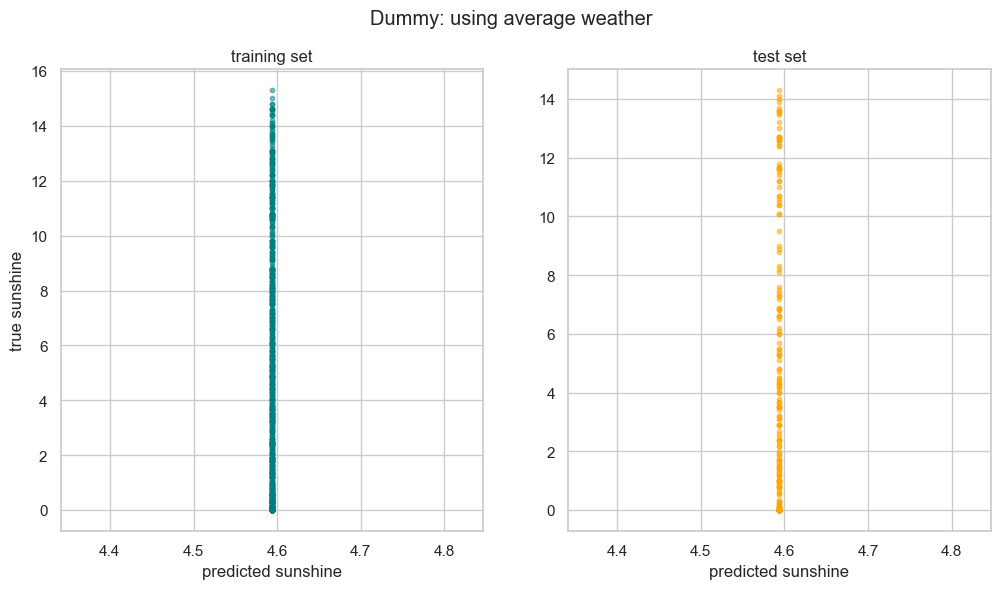

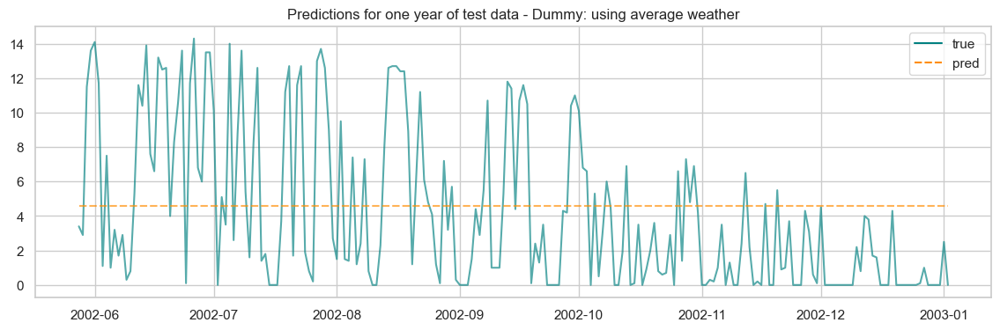

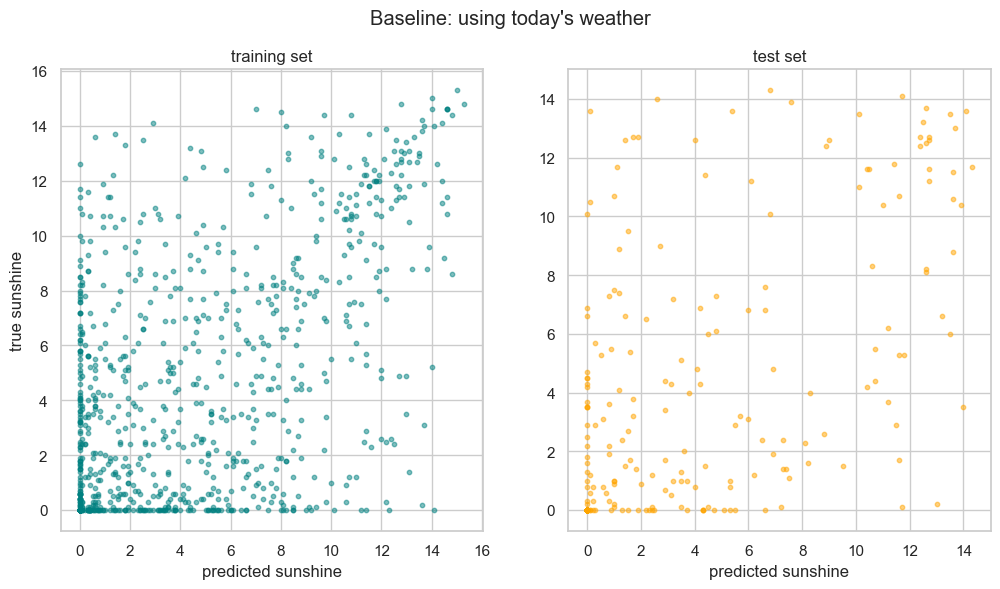

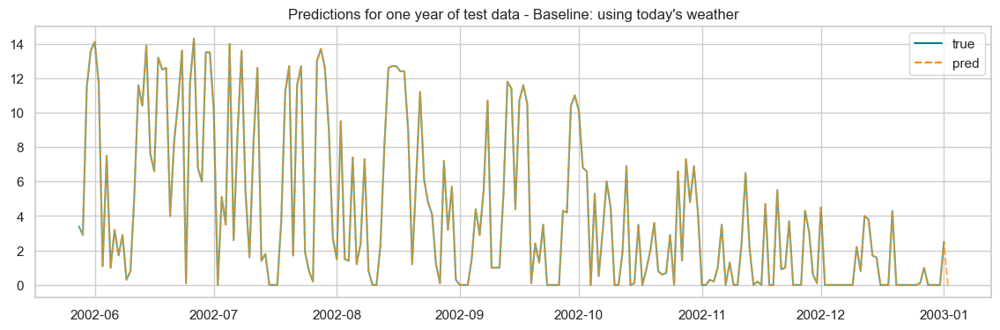

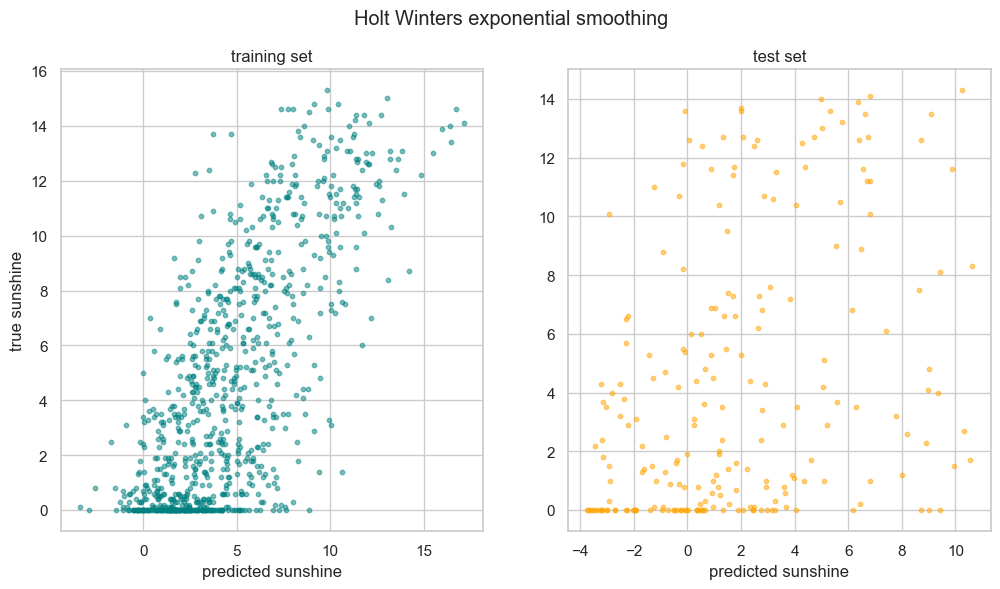

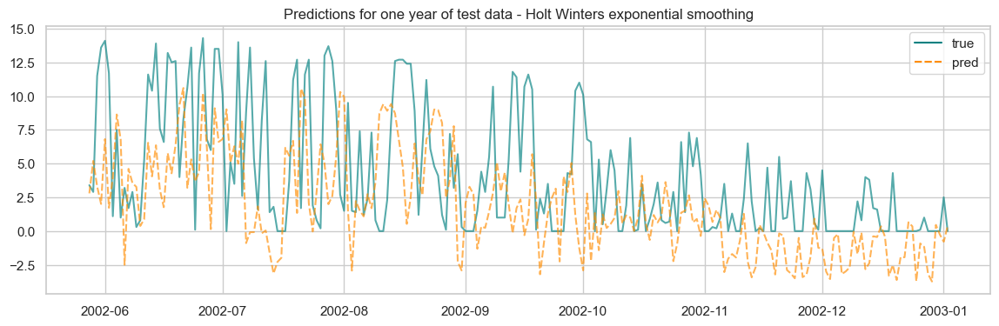

In [231]:
#plots for baseline
plot_train_test(y_train, y_dummy_train_pred, y_test, y_dummy_test_pred, measure4prediction, "Dummy: using average weather")
plot_train_test(y_train[:-1], y_train[1:], y_test[:-1], y_test[1:], measure4prediction, "Baseline: using today's weather")
plot_train_test(y_train, y_smoothing_train_pred, y_test, y_smoothing_test_pred, measure4prediction, "Holt Winters exponential smoothing")

## RNN
[back to ToC](#Contents)

### Training DL models

In [168]:
#number of lag observations that will be used as input and subsequent value in the sequence as output:
lag_size = 30 #e.g. 30=previous month measures, 7=previous week measures

#number of features we'll use to train the model
n_features = len(X_data.columns)
print("*** We'll be training our models on {} features to predict {} of the day coming after {} days of observations".format(n_features, col4prediction, lag_size))

shufflegen = False #whether we want to shuffle the order of the sequences presented to the training

batch_size = 32 #default
batch_size = 365 #one year

earlystopper = EarlyStopping(
    monitor='val_mse', mode='min',
    #monitor='val_r_square', mode='max',
    patience=20,
    restore_best_weights=True,
    verbose=1
)

verbose_level = 0
earlystop = True
plot_regression=False

*** We'll be training our models on 165 features to predict BASEL_sunshine of the day coming after 30 days of observations


In [170]:
earlystop = False

model = build_model_from_name("L{}R5".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)
round(errors_df.tail(2), 4)

created model L30R5


1/1 [==============================] - 0s 43ms/step


,trainMSE,testMSE,trainR2,testR2
ctssbn100-50-10es,6.3825,9.3781,0.6774,0.4927
L30R5,7.8576,19.1457,0.5948,-0.0721


In [171]:
earlystop = False
shufflegen = True

model = build_model_from_name("L{}sR5".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)
round(errors_df.tail(2), 4)

created model L30sR5


1/1 [==============================] - 0s 41ms/step


,trainMSE,testMSE,trainR2,testR2
L30R5,7.8576,19.1457,0.5948,-0.0721
L30sR5,7.8576,19.1457,0.5948,-0.0721


In [172]:
shufflegen = False
earlystop = True
model = build_model_from_name("L{}R10es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)

created model L30R10es


Restoring model weights from the end of the best epoch: 74.
Epoch 94: early stopping
1/1 [==============================] - 0s 40ms/step


In [173]:
#adding dropout
model = build_model_from_name("L{}R10D0.2es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)

created model L30R10D0.2es


Restoring model weights from the end of the best epoch: 66.
Epoch 86: early stopping
1/1 [==============================] - 0s 40ms/step


In [174]:
#rnn regularizer
model = build_model_from_name("L{}R10L0.01es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)

created model L30R10L0.01es


Restoring model weights from the end of the best epoch: 86.
Epoch 106: early stopping
1/1 [==============================] - 0s 42ms/step


In [175]:
#rnn regularizer and dropout
model = build_model_from_name("L{}R10D0.2L0.01es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)

created model L30R10D0.2L0.01es


Restoring model weights from the end of the best epoch: 67.
Epoch 87: early stopping
1/1 [==============================] - 0s 40ms/step


In [176]:
#rnn regularizer and two dropouts
model = build_model_from_name("L{}R5D0.2d0.2L0.01es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)

created model L30R5D0.2d0.2L0.01es


Restoring model weights from the end of the best epoch: 150.
Epoch 170: early stopping
1/1 [==============================] - 0s 40ms/step


In [177]:
round(errors_df, 4)

,trainMSE,testMSE,trainR2,testR2
dummy_mean,19.7865,18.5478,0.0000,-0.0034
same_as_today,18.7421,17.7075,0.0528,0.0421
ctss100,1.6416,11.6846,0.9170,0.3679
ctss100-50,0.0631,11.1465,0.9968,0.3970
ctss100-50-10,0.2266,11.7842,0.9885,0.3625
ctss100es,6.6627,9.9546,0.6633,0.4615
ctss100-50es,5.4971,9.5499,0.7222,0.4834
ctss100-50-10es,5.5362,9.2072,0.7202,0.5019
ctssbn100es,7.1600,9.7019,0.6381,0.4751
ctssbn100-50es,5.9262,9.2559,0.7005,0.4993


## LSTM
[back to ToC](#Contents)

In [178]:
#LSTM
model = build_model_from_name("L{}LSTM5es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size, verbose=verbose_level,
                                  plot_regression=plot_regression)

created model L30LSTM5es


Restoring model weights from the end of the best epoch: 49.
Epoch 69: early stopping
1/1 [==============================] - 0s 46ms/step


In [179]:
#LSTM shuffled
shufflegen = True
model = build_model_from_name("L{}sLSTM5es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size,
                                  plot_regression=plot_regression)

created model L30sLSTM5es


Restoring model weights from the end of the best epoch: 49.
Epoch 69: early stopping
1/1 [==============================] - 0s 45ms/step


In [180]:
#LSTM with dropout
shufflegen = False
model = build_model_from_name("L{}LSTM5D0.2es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size,
                                  #verbose=2,
                                  plot_regression=plot_regression)

created model L30LSTM5D0.2es


Restoring model weights from the end of the best epoch: 117.
Epoch 137: early stopping
1/1 [==============================] - 0s 42ms/step


In [181]:
#LSTM with two dropout
model = build_model_from_name("L{}LSTM5D0.2d0.2es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size,
                                  #verbose=2,
                                  plot_regression=plot_regression)

created model L30LSTM5D0.2d0.2es


Restoring model weights from the end of the best epoch: 86.
Epoch 106: early stopping
1/1 [==============================] - 0s 42ms/step


In [182]:
#LSTM with regularizer
model = build_model_from_name("L{}LSTM5L0.01es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size,
                                  #verbose=2,
                                  plot_regression=plot_regression)

created model L30LSTM5L0.01es


Restoring model weights from the end of the best epoch: 49.
Epoch 69: early stopping
1/1 [==============================] - 0s 42ms/step


In [183]:
#LSTM with two dropout and regularizer
model = build_model_from_name("L{}LSTM5D0.2d0.2L0.01es".format(lag_size))

error_df, *_ = train_and_score_ts(model, model.name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  epochs=200, batch_size=batch_size,
                                  #verbose=2,
                                  plot_regression=plot_regression)

created model L30LSTM5D0.2d0.2L0.01es


Restoring model weights from the end of the best epoch: 74.
Epoch 94: early stopping
1/1 [==============================] - 0s 43ms/step


In [184]:
#LSTM with two dropout and regularizer, stateful
hidden_dim = 5
input_dropout = 0.2
recurrent_dropout = 0.2
earlystop = True
shufflegen = False
model_name = "SLSTM{}D{}d{}L0.01".format(hidden_dim, input_dropout, recurrent_dropout, stateful=True)
seed(SEED); np.random.seed(SEED); set_seed(SEED)
model = Sequential(name=model_name)
model.add(LSTM(hidden_dim, dropout=input_dropout, recurrent_dropout=recurrent_dropout, kernel_regularizer="l1",
               activation='relu', input_shape=(lag_size, n_features)))
model.add(Dense(1))

error_df, *_ = train_and_score_ts(model, model_name, X_train, y_train, X_test, y_test,
                                  lag_size=lag_size, earlystop=earlystop,
                                  #epochs=200,
                                  batch_size=365, #for stateful, one year into the next
                                  shufflegen=False, #for stateful should not shuffle
                                  #verbose=2,
                                  plot_regression=plot_regression)
round(errors_df.tail(8), 4)

Restoring model weights from the end of the best epoch: 74.
Epoch 94: early stopping
1/1 [==============================] - 0s 42ms/step


,trainMSE,testMSE,trainR2,testR2
L30R5D0.2d0.2L0.01es,10.5234,9.7790,0.4573,0.4524
L30LSTM5es,12.6612,17.2373,0.3470,0.0348
L30sLSTM5es,12.6612,17.2373,0.3470,0.0348
L30LSTM5D0.2es,9.0265,13.3196,0.5345,0.2542
L30LSTM5D0.2d0.2es,11.0701,14.6369,0.4291,0.1804
L30LSTM5L0.01es,12.6763,17.1852,0.3462,0.0377
L30LSTM5D0.2d0.2L0.01es,11.8108,15.8208,0.3909,0.1141
SLSTM5D0.2d0.2L0.01,11.8791,14.8487,0.3874,0.1685


## KerasTuner
[back to ToC](#Contents)
### Hyperparameter tuning

In [185]:
import keras_tuner as kt

def build_model(hp):
    """
    wrapper to build_recurrent_model which will choose hyperparameters for optimisation by keras_tuner
    """
    #model_type = hp.Choice('model_type', ['RNN', 'LSTM']),
    model_type = 'LSTM'
    units = hp.Int("units", min_value=55, max_value=255, step=50)
    attention = hp.Boolean('attention')
    input_dropout = hp.Float("input_dropout", min_value=0.0, max_value=0.4, step=0.2)
    recurrent_dropout = hp.Float("recurrent_dropout", min_value=0.2, max_value=0.4, step=0.2)
    l1_alpha = hp.Float("l1_alpha", min_value=0.01, max_value=0.02, step=0.01)
    hidden_units = hp.Int("hidden_units", min_value=5, max_value=25, step=10)
    hidden_dropout = 0
    hidden_l1_alpha = 0
    if hidden_units > 0:
        hidden_dropout = hp.Float("hidden_dropout", min_value=0.0, max_value=0.4, step=0.2)
        hidden_l1_alpha = hp.Float("hidden_l1_alpha", min_value=0.01, max_value=0.02, step=0.01)
    #learning_rate = hp.Float("learning_rate", min_value=1e-4, max_value=1e-2, sampling="log")
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
    
    model = build_recurrent_model(model_type=model_type,
                                  units=units, attention=attention,
                                  input_dropout=input_dropout,
                                  recurrent_dropout=recurrent_dropout,
                                  l1_alpha=l1_alpha,
                                  hidden_units=hidden_units,
                                  hidden_dropout=hidden_dropout,
                                  hidden_l1_alpha=hidden_l1_alpha,
                                  learning_rate=learning_rate
                                 )
    return model

In [186]:
def score_and_plot_model_ts(model, model_name, X_train, y_train, X_test, y_test, plot_regression=True, plot_history=False):
    """
    if we only want score and plot for an already trained model
    """
    eprint("Scoring model {}".format(model_name))
    global errors_df
    error_df, y_train_pred, y_test_pred = score_model_ts(model, model_name, X_train, y_train, X_test, y_test)
    if plot_regression:
        plot_train_test(y_train.tail(len(y_train_pred)), y_train_pred, y_test.tail(len(y_test_pred)), y_test_pred, prediction_label=measure4prediction, plot_title=model_name)

    #update global metrics df
    if model_name in errors_df.index:
        errors_df.drop([model_name], inplace=True)
    errors_df = pd.concat([errors_df, error_df])

    model_hist = model_name + ".pkl"

    if plot_history and path.exists(model_hist):
        print("Loading previously trained model history {}".format(model_hist))
        with open(model_hist, 'rb') as fh:
            history = Historyobj(pickle.load(fh))
        plt.figure()
        history_df = pd.DataFrame.from_dict(history.history)
        sns.lineplot(data=history_df['mse'])
        sns.lineplot(data=history_df['val_mse'])
        plt.title(model_name)
        plt.xlabel("epochs")
        plt.ylabel("MSE")
    print(round(error_df,4))
    return error_df, y_train_pred, y_test_pred

In [187]:
def retrain_and_score_tuner_best_model(tuner, X_train, y_train, X_test, y_test, verbose=0,
                            batch_size=32, epochs=600, callbacks=None, plot_regression=True,
                            plot_model=True, plot_history=True, lag_size=1, shufflegen=False, 
                            model_cache=True, reset_weights=True, optimizer=keras.optimizers.Adam(1e-3)):
    """
    given a tuner, retrieve best_model_hyperparameters found,
    retrain model possibly with different tuning parameters (e.g. batchsize, epoch number, callbacks, shuffle flag)
    then score and plot
    """

    best_hps = tuner.get_best_hyperparameters()
    model = build_model(best_hps[0])
    #model.build(input_shape=(None, lag_size, n_features)) #not needed
    if reset_weights:
        model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])
    model_name = model.name

    if plot_model:
        plt.imshow(visualkeras.layered_view(model, legend=True, min_xy=80, min_z=2, spacing=30))
        plt.figure()
        #plot_model(model, show_shapes=True, show_layer_names=False)#, to_file='model.png')

    model_file = model_name + ".h5"
    model_hist = model_name + ".pkl"
    #retrain
    if shufflegen:
        seed(SEED); np.random.seed(SEED); set_seed(SEED)
    train_data_generator = TimeseriesGenerator(X_train, y_train, length=lag_size, batch_size=batch_size, shuffle=shufflegen)
    test_data_generator = TimeseriesGenerator(X_test, y_test, length=lag_size, batch_size=batch_size, shuffle=shufflegen)

    history = model.fit(train_data_generator,
                        validation_data=test_data_generator,
                        #note: batch_size and shuffle parameters are in the generator
                        use_multiprocessing=False, #problematic?
                        epochs=epochs,
                        callbacks=callbacks, verbose=verbose)
    if model_cache:
        model.save(model_file)
        if history is not None:
            with open(model_hist, "wb") as fh:
                pickle.dump(history.history, fh)

    if plot_history:
        plt.figure()
        history_df = pd.DataFrame.from_dict(history.history)
        sns.lineplot(data=history_df['mse'])
        sns.lineplot(data=history_df['val_mse'])
        plt.title(model_name)
        plt.xlabel("epochs")
        plt.ylabel("MSE")

    error_df, y_train_pred, y_test_pred = score_and_plot_model_ts(model, model_name, X_train, y_train, X_test, y_test, plot_regression=plot_regression)

    return error_df, model, y_train_pred, y_test_pred

In [188]:
def tune_train_and_score_ts(tuner, X_train, y_train, X_test, y_test, verbose=0,
                            batch_size=32, epochs=600, callbacks=None, plot_regression=False,
                            plot_model=False, plot_history=True, lag_size=1, shufflegen=False, 
                            model_cache=True):
    """
    function to tune, train and score a newly created model
    arguments [defaults]:
        X_train, y_train, X_test, y_test
        verbose (whether to fit the model with verbosity) [False]
        batch_size [32]
        epochs [600]
        callbacks [None]
        plot_regression (if we want the plots of true vs predicted) [False]
        plot_model (if we want a visualkeras image) [True]
        plot_history (if we want to plot training history) [True]
        lag_size (aka sequence length, aka lookback) for the timeseriesgenerator [1]
        shufflegen (instruct timeseriesgenerator to output sequences in shuffled order) [False]
        model_cache (whether to cache models) [True]
    """
    if shufflegen:
        seed(SEED); np.random.seed(SEED); set_seed(SEED)
    train_data_generator = TimeseriesGenerator(X_train, y_train, length=lag_size, batch_size=batch_size, shuffle=shufflegen)
    test_data_generator = TimeseriesGenerator(X_test, y_test, length=lag_size, batch_size=batch_size, shuffle=shufflegen)

    tuner.search(train_data_generator, epochs=epochs, validation_data=test_data_generator,
                              callbacks=callbacks, verbose=verbose, shuffle=shufflegen)
    
    print(tuner.results_summary(10))
    
    model = tuner.get_best_models()[0]
    #model.build(input_shape=(None, lag_size, n_features))
    model_name = model.name

    if plot_model:
        plt.imshow(visualkeras.layered_view(model, legend=True, min_xy=80, min_z=2, spacing=30))
        plt.figure()
        #plot_model(model, show_shapes=True, show_layer_names=False)#, to_file='model.png')
    
    model_file = model_name + ".h5"
    model_hist = model_name + ".pkl"
    if model_cache:
        model.save(model_file)
        #with open(model_hist, "wb") as fh:
        #    pickle.dump(history.history, fh)

    error_df, y_train_pred, y_test_pred = score_and_plot_model_ts(model, model_name, X_train, y_train, X_test, y_test, plot_regression=plot_regression)
    return error_df, model, y_train_pred, y_test_pred

### BayesianOptimization search
**Note**: change max_trials in cell below to properly search the hyperparameters space

In [189]:
#max_trials = 100
max_trials = 3
earlystopper = EarlyStopping(
    #monitor='val_mse', mode='min',
    monitor='val_r_square', mode='max',
    patience=20,
    restore_best_weights=True,
    verbose=1
)
callbacks = [earlystopper]

In [190]:
SEED = 42
lag_size = 14 #e.g. 30=previous month measures, 7=previous week measures
n_features = len(X_data.columns) #number of features we'll use to train the model
batch_size = 365 #one year of data for each batch
epochs = 500
earlystop = True
shufflegen = False

In [191]:
bayesian_opt_tuner = kt.BayesianOptimization(
    hypermodel=build_model,
    #objective='val_loss',
    #objective=kt.Objective("val_mse", direction="min"),
    objective=kt.Objective("val_r_square", direction="max"),
    max_trials=max_trials,
    executions_per_trial=1,
    project_name="BOmodelsearch{}".format(lag_size),
    directory='.',
    seed=SEED, #to try the models in a certain order
    overwrite=True)

created model L14LSTM55d0.2L0.01-5L0.01es


In [192]:
error_df, model, *_ = tune_train_and_score_ts(bayesian_opt_tuner, X_train, y_train, X_test, y_test,
                                              lag_size=lag_size, callbacks=callbacks,
                                              epochs=epochs, model_cache=False,
                                              batch_size=batch_size, verbose=1, shufflegen=shufflegen,
                                              plot_model=False, plot_regression=False)

Trial 3 Complete [00h 00m 14s]
val_r_square: 0.482552707195282

Best val_r_square So Far: 0.482552707195282
Total elapsed time: 00h 00m 26s
INFO:tensorflow:Oracle triggered exit
Results summary
Results in ./BOmodelsearch14
Showing 10 best trials
Trial summary
Hyperparameters:
units: 105
attention: False
input_dropout: 0.4
recurrent_dropout: 0.2
l1_alpha: 0.01
hidden_units: 15
hidden_dropout: 0.0
hidden_l1_alpha: 0.01
learning_rate: 0.001
Score: 0.482552707195282
Trial summary
Hyperparameters:
units: 205
attention: False
input_dropout: 0.2
recurrent_dropout: 0.2
l1_alpha: 0.02
hidden_units: 15
hidden_dropout: 0.2
hidden_l1_alpha: 0.01
learning_rate: 0.01
Score: -0.1578049659729004
None


created model L14LSTM105D0.4d0.2L0.01-15L0.01es
Scoring model L14LSTM105D0.4d0.2L0.01-15L0.01es


1/1 [==============================] - 0s 46ms/step
                                   trainMSE  testMSE  trainR2  testR2
L14LSTM105D0.4d0.2L0.01-15L0.01es    7.6865  10.5285   0.6023  0.4826


In [193]:
print("Remaining trials:", bayesian_opt_tuner.remaining_trials)
bayesian_opt_tuner.results_summary(3)

Remaining trials: 0
Results summary
Results in ./BOmodelsearch14
Showing 3 best trials
Trial summary
Hyperparameters:
units: 105
attention: False
input_dropout: 0.4
recurrent_dropout: 0.2
l1_alpha: 0.01
hidden_units: 15
hidden_dropout: 0.0
hidden_l1_alpha: 0.01
learning_rate: 0.001
Score: 0.482552707195282
Trial summary
Hyperparameters:
units: 205
attention: False
input_dropout: 0.2
recurrent_dropout: 0.2
l1_alpha: 0.02
hidden_units: 15
hidden_dropout: 0.2
hidden_l1_alpha: 0.01
learning_rate: 0.01
Score: -0.1578049659729004


### HyperBand tuner
**NOTE** change max_epochs to have a proper search in hyperparameters space

In [194]:
hyperband = False
if hyperband:
    earlystopper = EarlyStopping(
        #monitor='val_mse', mode='min',
        monitor='val_r_square', mode='max',
        patience=20,
        restore_best_weights=True,
        verbose=1
    )
    callbacks = [earlystopper]
    hyperband_tuner = kt.Hyperband(
        hypermodel=build_model,
        #objective=kt.Objective("val_mse", direction="min"),
        objective=kt.Objective("val_r_square", direction="max"),
        max_epochs=epochs,
        executions_per_trial=1,
        project_name="HBmodelsearch{}".format(lag_size),
        directory='.',
        seed=SEED,
        overwrite=True)

In [195]:
if hyperband: 
    error_df, model, *_ = tune_train_and_score_ts(hyperband_tuner, X_train, y_train, X_test, y_test,
                                      lag_size=lag_size, callbacks=callbacks,
                                      epochs=epochs, model_cache=False,
                                      batch_size=batch_size,
                                      verbose=1,
                                      shufflegen=shufflegen,
                                      plot_regression=True)

In [196]:
if hyperband:
    print("Remaining trials:", hyperband_tuner.remaining_trials)
    hyperband_tuner.results_summary(3)

#### To re_score and plot a model (the best, or the best found so far)

created model L14LSTM105D0.4d0.2L0.01-15L0.01es
Scoring model L14LSTM105D0.4d0.2L0.01-15L0.01es


1/1 [==============================] - 0s 47ms/step
                                   trainMSE  testMSE  trainR2  testR2
L14LSTM105D0.4d0.2L0.01-15L0.01es    7.6865  10.5285   0.6023  0.4826


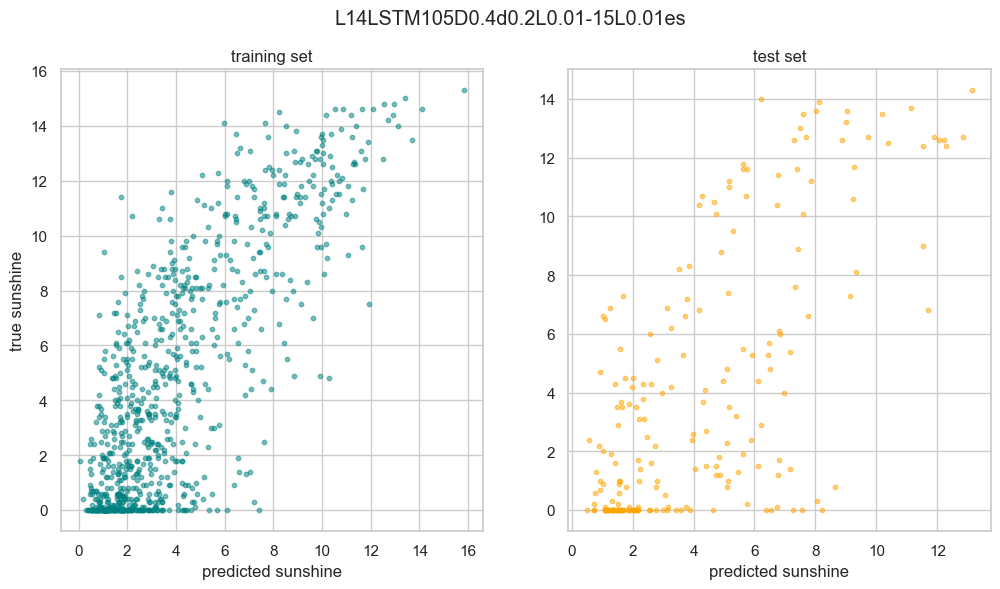

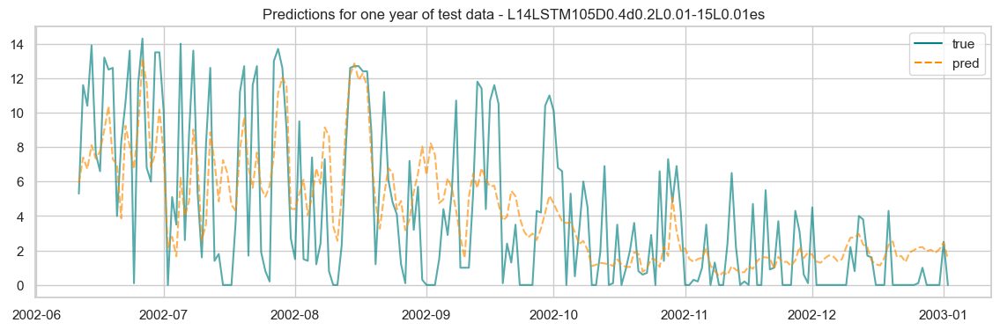

In [202]:
rescore = True
if rescore:
    tuner = bayesian_opt_tuner
    best_model = tuner.get_best_models()[0]
    error_df, *_ = score_and_plot_model_ts(best_model, best_model.name, X_train, y_train, X_test, y_test,
                                           plot_regression=True, plot_history=True)
    error_df

#### To re-train (or continue training) a model

In [198]:
retrain = False
if retrain:
    # To retrain the best model, maybe changing tuning parameters (batchsize, shuffle, optimizer..):
    # NOTE: Maybe better to keep a .bak of previous .h5 file just in case...
    error_df, best_model, *_ = retrain_and_score_tuner_best_model(tuner, X_train, y_train, X_test, y_test,
                                        lag_size=lag_size, callbacks=callbacks,
                                        plot_model=True,
                                        model_cache=False, #do we want to save it?
                                        reset_weights=True, #set false to continue training from where it was left
                                        epochs=epochs,
                                        batch_size=batch_size,
                                        verbose=2,
                                        #shufflegen=False,
                                        #optimizer=keras.optimizers.Adam(0.01), 
                                        plot_history=True,
                                        plot_regression=True)


#### Number of weights per layer as a function of features and units

In [199]:
units = 200
rnn_params = (units + n_features * units + units ** 2) #rnn
lstm_params = 4 * (units + n_features * units + units ** 2) #lstm
print("Units {}; Features {}; RNN parameters {}; LSTM parameters: {}".format(units, n_features,
                                                                             rnn_params, lstm_params))

Units 200; Features 165; RNN parameters 73200; LSTM parameters: 292800


<Axes: xlabel='units'>

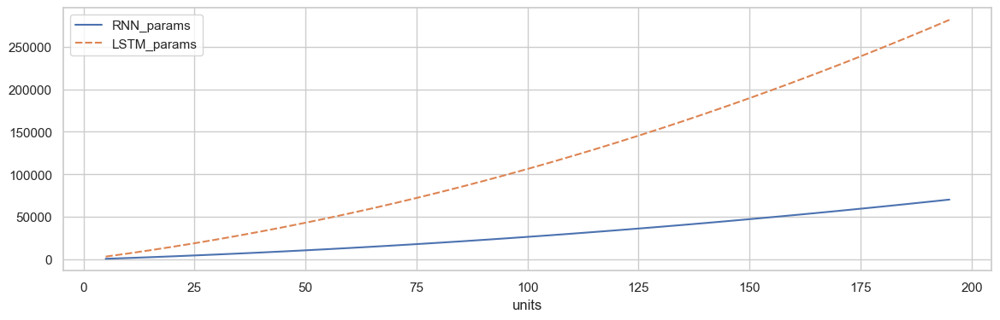

In [200]:
units_list = []
rnn_params = []
lstm_params = []
for units in range(5, 200, 5):
    units_list.append(units)
    rnn_params.append((units + n_features * units + units ** 2))
    lstm_params.append(4*(units + n_features * units + units ** 2))
params_per_units = {'units': units_list, 'RNN_params': rnn_params, 'LSTM_params': lstm_params}
params_df = pd.DataFrame(params_per_units)
params_df.set_index('units', inplace=True)
sns.lineplot(data=params_df)